# Import Python Libaries

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure


import seaborn as sns
%matplotlib inline
import re
import string
import spacy 
import os
import sys
import numpy as np

nlp = spacy.load('en', disable=['ner', 'parser'])
import nltk
from nltk.stem.snowball import SnowballStemmer
from scipy import stats

from time import time
from collections import defaultdict
import gc
import io
import random

from __future__ import print_function, division
from builtins import range
import os
import sys
import numpy as np
import operator

import nltk
nltk.download('all')
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize


import keras
from keras.models import Model, Sequential
from keras.layers import *
from keras.layers import Dense, Embedding, Input
from keras.layers import LSTM, Bidirectional, GlobalAveragePooling1D, Dropout, Conv1D, GRU, Layer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.optimizers import Adam, SGD
from sklearn.metrics import roc_auc_score
import keras.backend as K
from keras.layers import CuDNNLSTM as LSTM
from keras.models import load_model
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

from keras import metrics
from tensorflow.python.keras.metrics import Metric
from tensorflow.keras.utils import plot_model

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.utils import shuffle, class_weight
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import cohen_kappa_score, roc_auc_score, f1_score, confusion_matrix

from sklearn.pipeline import Pipeline



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/biocreative_ppi.zip.
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/brown.zip.
[nltk_data]    | Downloading package brown_tei to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/brown_tei.zip.
[nltk_data]    | Downloading package cess_cat to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cess_cat.zip.
[nltk_data]    | Downloading package cess_esp to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cess_esp.zip.
[nltk_data]    | Downloading package chat80 to /root/nltk_data...
[nltk_data]    |   Unzipp

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [0]:
# install tensorflow 2.0
#!pip uninstall tensorflow
#!pip install tensorflow-gpu==2.1.0

In [0]:
import tensorflow as tf
print(tf.__version__)

2.1.0


In [0]:
# check the availability of GPU
%tensorflow_version 2.x
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))


Found GPU at: /device:GPU:0


In [0]:
# Mount Google Drive (to save the downloaded files)
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


### GloVe Pretrained Word Embedding loading

In [0]:
# Load GloVe Embeddings
print('Loading GloVe Embeddings.')

glove_embeddings = {}
f = open('/gdrive/My Drive/new/glove.42B.300d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    glove_embeddings[word] = coefs
f.close()

print('Found %s word vectors.' % len(glove_embeddings))


Loading GloVe Embeddings.
Found 1917495 word vectors.


# Import cleaned data

In [0]:
data = pd.read_csv('/gdrive/My Drive/cleaned_data.csv')
data_cleaned = data[['texts','positivity']][data['relevance']==1]

In [0]:
data_cleaned

,texts,positivity
0,yield cd fall late week new york yield cert...,3.0
4,currency trading dollar remain tight range a...,3.0
5,stock fall bofa alcoa slide stock decline ...,3.0
9,u s dollar fall currency decline soften bo...,4.0
12,defend deflation author james b stewartthe...,4.0
...,...,...
7964,housing start grow raise inflation fear ec...,7.0
7965,profit evasive stock mart rally greer philip...,3.0
7975,salomon sound wary note economy clinton admini...,8.0
7978,great terror massive new history hitler tyra...,5.0


In [0]:
data_cleaned.groupby('positivity').count()

,texts
positivity,
2.0,35
3.0,343
4.0,255
5.0,205
6.0,214
7.0,295
8.0,71
9.0,2


# Sentiment Analysis

## Data Augmentation

In [0]:
# use WordNet to find synonyms of each word and oversample the minor class
from nltk.corpus import wordnet 

def get_synonyms(word):
	synonyms = set()
	for syn in wordnet.synsets(word): 
		for l in syn.lemmas(): 
			synonym = l.name()
			synonym = "".join([char for char in synonym if char in ' qwertyuiopasdfghjklzxcvbnm'])
			synonyms.add(synonym) 
	if word in synonyms:
		synonyms.remove(word)
	return list(synonyms)

In [0]:
# use the function in Oversampling
def augmentation(wordlist, pos): 
  new_words = wordlist
  for i in range(len(wordlist)):
    for random_word in wordlist[wordlist.index[i]]:
      try:
        synonyms = get_synonyms(random_word)
        synonym = random.choice(list(synonyms))
        new_words[new_words.index[i]] = [synonym if word == random_word else word for word in new_words[new_words.index[i]]]
      except:
        pass
    s = ' '.join(new_words[new_words.index[i]])
    new_words[new_words.index[i]] = s
  augmented_sentences = pd.DataFrame(columns=['texts','positivity'])
  augmented_sentences['texts'] = new_words
  augmented_sentences['positivity']  = pos
  return augmented_sentences

### 20% data augmentation

In [0]:
data_cleaned_1 = data_cleaned.sample(frac=0.2, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_1['texts']
pos = data_cleaned_1['positivity']
word_list = sentence.str.split()

random.seed(55)
data_1 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_1 = shuffle(data_1)
data_1.reset_index()

,index,texts,positivity
0,969,bond rally begin tuesday fizzle despite drop s...,3.0
1,3262,dollar fall summer return current level later ...,3.0
2,859,farmout finance involvement order resurrect ed...,7.0
3,3900,inthelead taperecording kroger excite cost tri...,3.0
4,2996,airline post result capacity question invest...,7.0
...,...,...,...
1699,2423,u s car sale decline mid august detroit ...,4.0
1700,562,businesssector finance nionsoldier backlog adv...,6.0
1701,652,u s budget deficit ' project decline cbo w...,3.0
1702,3507,business finance european central bank scrambl...,5.0


In [0]:
data_1.groupby('positivity').count()

,texts
positivity,
2.0,41
3.0,417
4.0,306
5.0,239
6.0,255
7.0,355
8.0,88
9.0,3


### 50% data augmentation

In [0]:
data_cleaned_2 = data_cleaned.sample(frac=0.5, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_2['texts']
pos = data_cleaned_2['positivity']
word_list = sentence.str.split()

random.seed(55)
data_2 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_2 = shuffle(data_2)
data_2.reset_index()

,index,texts,positivity
0,153,fire interestgroup order gran grinning jillio...,7.0
1,2795,fed probably decide increase short term rate ...,6.0
2,1963,' structural ' unemployment problem look ski...,3.0
3,7121,home sale rise percent increase large nea...,3.0
4,7214,mind class extra by class vast brood endanger ...,7.0
...,...,...,...
2125,6247,small stock outpace dow hit record high blue...,5.0
2126,1206,atomicnumber second budget shortage constringe...,7.0
2127,7619,young rock recession old forgive take gla...,5.0
2128,2399,industrial rear memorialize ond arriveat muzzy...,6.0


### 80% data augmentation

In [0]:
data_cleaned_3 = data_cleaned.sample(frac=0.8, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_3['texts']
pos = data_cleaned_3['positivity']
word_list = sentence.str.split()

random.seed(55)
data_3 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_3 = shuffle(data_3)
data_3.reset_index()

,index,texts,positivity
0,1833,trade deficit widen bit january gap grow ...,4.0
1,5795,displaypanel mortgage grade castoff somewhat g...,7.0
2,41,dollarsign standout assistance datapoint dolla...,7.0
3,6158,christmas sale see cloud uncertainty christm...,4.0
4,418,consumer debt charge riseup scorn regular pass...,3.0
...,...,...,...
2551,3817,painting uranium siemens lineofwork marketplac...,7.0
2552,2063,idle layclaim knockoff uranium sulphur lyingin...,6.0
2553,3883,boom insurance doubt money manager day trader ...,5.0
2554,323,amber latchon eloquent dismiss potent chore in...,6.0


### 100% data augmentation

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_4 = data_cleaned.append(augmentation(word_list, pos))


In [0]:
data_4 = shuffle(data_4)
data_4.reset_index()

,index,texts,positivity
0,3005,onward tapeline cutsfrom fedseem inevitablewhe...,5.0
1,5826,number fed member signal rate hike bond ma...,3.0
2,4200,wallich poohpooh hardandfast issue objective '...,7.0
3,1963,' morphological ' unemployment trouble front a...,3.0
4,201,economy productivity gain spark optimism eco...,6.0
...,...,...,...
2835,6303,worry dollar help push dow blue chip stock ...,4.0
2836,1354,feast grim worry range tender assure commercia...,3.0
2837,2155,captain ben chart treacherous course day sur...,6.0
2838,1664,wsj update bush panel win point benefit pl...,2.0


### 120% data augmentation

In [0]:
data_cleaned_5 = data_cleaned.sample(frac=0.2, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_5 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_5['texts']
pos = data_cleaned_5['positivity']
word_list = sentence.str.split()

random.seed(74)
data_5 = data_5.append(augmentation(word_list, pos))

In [0]:
data_5 = shuffle(data_5)
data_5.reset_index()

,index,texts,positivity
0,7658,aw mji tjc luasijington jjost fluorine hack dr...,5.0
1,2346,mutual fund quarterly review money fund ' sl...,4.0
2,1296,nonfarm actor turnout mounting oneyear chargep...,7.0
3,3464,u s government bond strengthen treasury pa...,7.0
4,7216,flow nominate newly reign fairness loanword fe...,5.0
...,...,...,...
3119,4140,report portray sluggish economy consumer incom...,6.0
3120,1011,lookout chapiter expenditure supercharge conva...,6.0
3121,5055,apital milyriceost ues pr odern ork pr caudex...,3.0
3122,1767,reverence development economical realise spect...,3.0


### 150% data augmentation

In [0]:
data_cleaned_6 = data_cleaned.sample(frac=0.5, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_6 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_6['texts']
pos = data_cleaned_6['positivity']
word_list = sentence.str.split()

random.seed(74)
data_6 = data_6.append(augmentation(word_list, pos))

In [0]:
data_6 = shuffle(data_6)
data_6.reset_index()

,index,texts,positivity
0,306,expectation money economicsystem turnout odern...,6.0
1,5055,apital milyriceost ues pr odern ork pr caudex...,3.0
2,3260,glance motortruck datapoint caudex zoom coupdo...,7.0
3,314,business finance dollar continue fall yen to...,5.0
4,4595,bulwark street fancy confine rage encroachment...,5.0
...,...,...,...
3545,5789,delinquent netprofit claim force marketplace d...,3.0
3546,4597,con nitedexicantates sorry spectacle uranium e...,3.0
3547,3989,wholesale price report play time item cite ...,4.0
3548,5739,bad news poverty figure politician pay little ...,3.0


### 180% data augmentation

In [0]:
data_cleaned_7 = data_cleaned.sample(frac=0.8, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_7 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_7['texts']
pos = data_cleaned_7['positivity']
word_list = sentence.str.split()

random.seed(74)
data_7 = data_7.append(augmentation(word_list, pos))

In [0]:
data_7 = shuffle(data_7)
data_7.reset_index()

,index,texts,positivity
0,2252,reasuryobligations manoeuvre mild embossment m...,5.0
1,5925,dollar tumble percent yen pound mark ...,5.0
2,864,occupation finance fiscal grocery resile shive...,7.0
3,1978,bush pivot tackle iraq weak economy unlike...,4.0
4,3573,hornbeck izzard malechild comeon diminished l...,7.0
...,...,...,...
3971,5372,dow climb record rate budget hope report f...,5.0
3972,1014,corporate news week ahead retailer suit h...,6.0
3973,1909,review outlook editorial greenspan reco...,6.0
3974,863,matterto place check labour mellow economical ...,4.0


In [0]:
dist = data_7[['positivity','texts']].groupby('positivity').count()
dist

,texts
positivity,
2.0,98
3.0,959
4.0,718
5.0,570
6.0,596
7.0,829
8.0,200
9.0,6


In [0]:
dist_old = data_cleaned.groupby('positivity').count()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  


<Figure size 432x288 with 0 Axes>

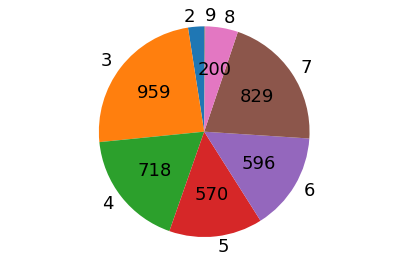

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.


<Figure size 432x288 with 0 Axes>

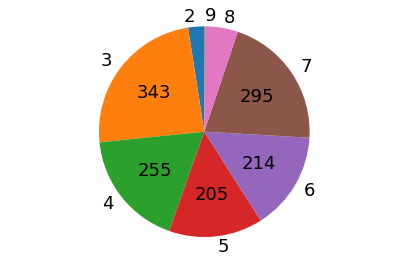

In [0]:
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{v:d}'.format(v=val) if val > 100 else ''
    return my_autopct

# 1.8 augmentation
plt.rcParams.update({'figure.autolayout': True, 'font.size':18})
figure(figsize=(6,4))
fig1, ax1 = plt.subplots()
sizes = dist.values
label = [2,3,4,5,6,7,8,9]
ax1.pie(sizes, labels=label, autopct = make_autopct(dist['texts']), startangle=90)
ax1.axis('equal')  
plt.show()

# before augmentation
plt.rcParams.update({'figure.autolayout': True, 'font.size':18})
figure(figsize=(6,4))
fig2, ax2 = plt.subplots()
sizes = dist_old.values
label = [2,3,4,5,6,7,8,9]
ax2.pie(sizes, labels=label, autopct = make_autopct(dist_old['texts']), startangle=90)
ax2.axis('equal')  

plt.show()

### 200% data augmentation

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_8 = data_cleaned.append(augmentation(word_list, pos))

random.seed(74)
data_8 = data_8.append(augmentation(word_list, pos))

In [0]:
data_8 = shuffle(data_8)
data_8.reset_index()

,index,texts,positivity
0,1587,antiophthalmicfactor vitamin atomicnumber sulp...,6.0
1,3214,reflation ' arrive stress uracil second confli...,4.0
2,2881,strain turnout amid wellbeing signalize ed sol...,7.0
3,7731,marcus griffith sr die own hair product fi...,8.0
4,7675,recession inflation pessimism persist harris...,7.0
...,...,...,...
4255,2823,ane cholecalciferol cubicdecimetre atomicnumbe...,4.0
4256,4451,viosterol type westward duesouth cubicdecime...,5.0
4257,323,gilt breakdown silvermedal dropdown hard caper...,6.0
4258,6084,sia bother protrude deadening sulfur exportat...,4.0


## Bi-LSTM

In [0]:
# some configuration

MAX_SEQUENCE_LENGTH = 432   # max sentence length 427 words
EMBEDDING_DIM = 300    # word vector dimension
MAX_VOCAB_SIZE = 50000
num_words = MAX_VOCAB_SIZE

### Word Embedding Weights and Padding

In [0]:
# Function for word embedding and padding, return embedding weight matrix, tokenized texts after padding, and number of words
def embedding(data_cleaned):  

  MAX_VOCAB_SIZE = 50000     # how many words will be used from dictionary 

  print('Loading word vectors...')
  word2vec = glove_embeddings

  # load dataset
  sentences = data_cleaned['texts'].fillna("DUMMY_VALUE").values

  # convert the sentences (strings) into integers
  # return a list of the index of every word in every sentence
  num_words = MAX_VOCAB_SIZE
  tokenizer = Tokenizer(num_words)
  tokenizer.fit_on_texts(sentences)   # word counts on unique words, see below

  # word2idx: number of unique words with index (Dictionary of word index)
  word2idx = tokenizer.word_index
  print('Found %s unique tokens.' % len(word2idx))

  # prepare embedding matrix
  n = 0
  uncovered_words = {}
  print('Filling pre-trained embeddings...')
  num = min(MAX_VOCAB_SIZE,len(word2idx) + 1)
  embedding_matrix = np.zeros((num, EMBEDDING_DIM))
  for word, i in word2idx.items():
      if i < MAX_VOCAB_SIZE:
          embedding_vector = word2vec.get(word)
          #print(embedding_vector)
          if embedding_vector is not None:
          # words not found in embedding index will be all zeros.
              embedding_matrix[i] = embedding_vector
          else:
              n = n + 1
              uncovered_words[n] = word
  print('{}, or {:.2%} of total {} unique words are not covered'.format(n, n/len(word2idx), len(word2idx)))

  # padding
  sequences = tokenizer.texts_to_sequences(data_cleaned['texts'].values)  # list, size T x number of words in each line (each line fluctuates)
  texts = pad_sequences(sequences, truncating = 'post', padding = 'post', maxlen=MAX_SEQUENCE_LENGTH)
  print('Shape of test data tensor:', texts.shape)
  
  return texts, embedding_matrix, num

In [0]:
# 20% data augmentation
[texts1, embedding_matrix_1, num1] = embedding(data_1)

Loading word vectors...
Found 16221 unique tokens.
Filling pre-trained embeddings...
2274, or 14.02% of total 16221 unique words are not covered
Shape of test data tensor: (1704, 432)


In [0]:
# 50% data augmentation
[texts2, embedding_matrix_2, num2] = embedding(data_2)

Loading word vectors...
Found 19394 unique tokens.
Filling pre-trained embeddings...
3420, or 17.63% of total 19394 unique words are not covered
Shape of test data tensor: (2130, 432)


In [0]:
# 80% data augmentation
[texts3, embedding_matrix_3, num3] = embedding(data_3)

Loading word vectors...
Found 21154 unique tokens.
Filling pre-trained embeddings...
4090, or 19.33% of total 21154 unique words are not covered
Shape of test data tensor: (2556, 432)


In [0]:
# 100% data augmentation
[texts4, embedding_matrix_4, num4] = embedding(data_4)

Loading word vectors...
Found 22223 unique tokens.
Filling pre-trained embeddings...
4443, or 19.99% of total 22223 unique words are not covered
Shape of test data tensor: (2840, 432)


In [0]:
# 120% data augmentation
[texts5, embedding_matrix_5, num5] = embedding(data_5)

Loading word vectors...
Found 22910 unique tokens.
Filling pre-trained embeddings...
4674, or 20.40% of total 22910 unique words are not covered
Shape of test data tensor: (3124, 432)


In [0]:
# 150% data augmentation
[texts6, embedding_matrix_6, num6] = embedding(data_6)

Loading word vectors...
Found 23755 unique tokens.
Filling pre-trained embeddings...
4987, or 20.99% of total 23755 unique words are not covered
Shape of test data tensor: (3550, 432)


In [0]:
# 180% data augmentation
[texts7, embedding_matrix_7, num7] = embedding(data_7)

Loading word vectors...
Found 24385 unique tokens.
Filling pre-trained embeddings...
5240, or 21.49% of total 24385 unique words are not covered
Shape of test data tensor: (3976, 432)


In [0]:
# 200% data augmentation
[texts8, embedding_matrix_8, num8] = embedding(data_8)

Loading word vectors...
Found 22244 unique tokens.
Filling pre-trained embeddings...
4451, or 20.01% of total 22244 unique words are not covered
Shape of test data tensor: (4260, 432)


### Model

#### Bi-LSTM

In [0]:
def bilstm(texts, mydata, embedding_matrix, num_words):

  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7

  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 7)
  scores_bilstm = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score', 'auc'])
  labels = mydata['positivity'].values

  METRICS = [
      'accuracy',
      'mae'
  ]


  print('Building Bi-LSTM model...')
  for train, test in kfold.split(texts, labels):

    labels_train = pd.get_dummies(labels[train])
    labels_test = pd.get_dummies(labels[test])

    # using list of zeros to represents missing classes
    m = sum(labels_train.columns)-sum(labels_test.columns)
    print(m)
    if m > 0:
      n = int(m)-2
      labels_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      labels_train.insert(n, abs(m), 0)

    model = tf.keras.Sequential([
      #Embedding

       tf.keras.layers.Embedding(num_words, EMBEDDING_DIM, input_length=MAX_SEQUENCE_LENGTH, weights=[embedding_matrix], trainable=True),
       tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True)),
       tf.keras.layers.GlobalMaxPooling1D(),
       tf.keras.layers.Dense(16, activation='sigmoid'),
       tf.keras.layers.Dense(8, activation='softmax')
    ])

    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
  
    )

    # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)

    print('Training model...')
    r = model.fit(
      texts[train],
      labels_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]

    )


    model.summary()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

    predictions_bilstm = model.predict(texts[test])
    scores = model.evaluate(x = texts[test], y = labels_test)    
    labels_test = labels_test.to_numpy()
    cnf_matrix = confusion_matrix(labels_test.argmax(axis=1), predictions_bilstm.argmax(axis=1))
    report = metrics.classification_report(labels_test.argmax(axis=1), predictions_bilstm.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)
    ck = cohen_kappa_score(labels_test.argmax(axis=1), predictions_bilstm.argmax(axis=1))

    #auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_bilstm
    else:
      y_pred = np.delete(predictions_bilstm, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')

    scores_bilstm = scores_bilstm.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                      'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                      'cohen_kappa_score': ck, 'auc': auc },  ignore_index=True)

  return scores_bilstm

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00029: early stopping
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional (Bidirectional (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d (Global (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 16)                1040      
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


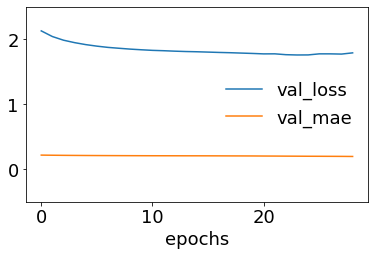

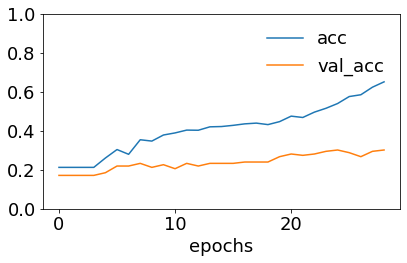

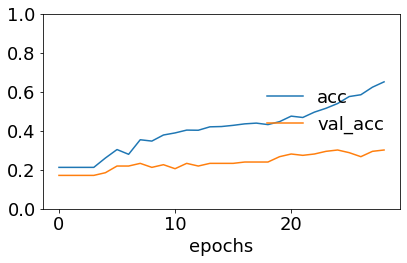

244/244 [==============================] - 0s 646us/sample - loss: 1.8456 - accuracy: 0.2705 - mae: 0.2049
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00028: early stopping
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_1 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


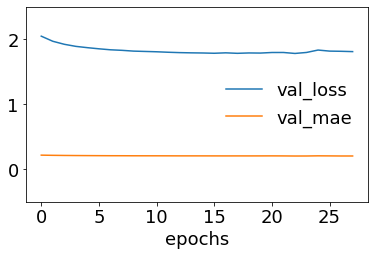

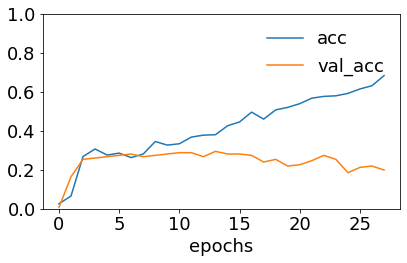

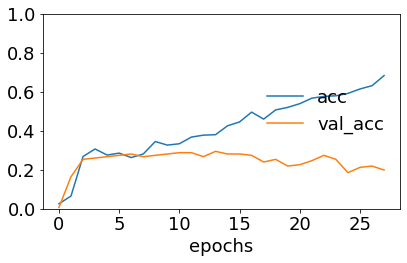

244/244 [==============================] - 0s 599us/sample - loss: 1.8066 - accuracy: 0.2828 - mae: 0.2038
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00029: early stopping
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_2 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_2 (Glob (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


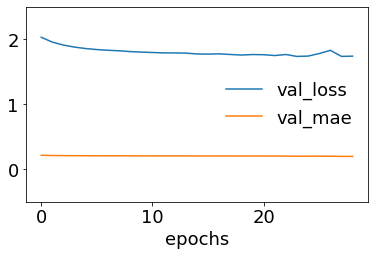

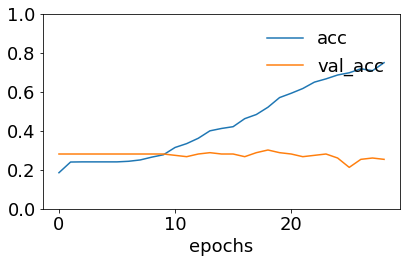

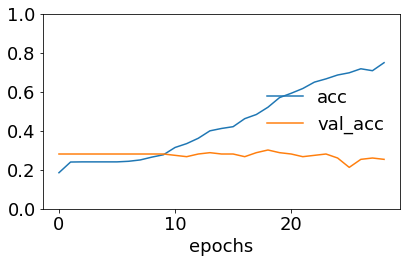

244/244 [==============================] - 0s 648us/sample - loss: 1.7759 - accuracy: 0.2623 - mae: 0.2016
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00030: early stopping
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_3 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_3 (Glob (None, 64)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_7 (Dense)              (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


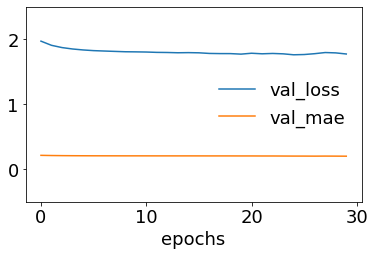

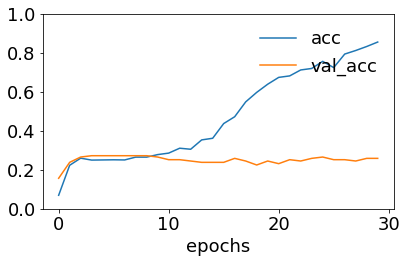

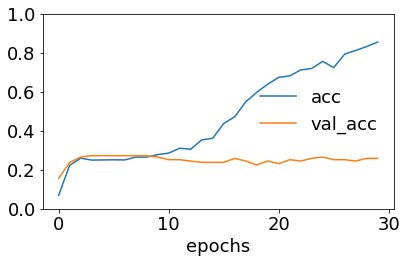

243/243 [==============================] - 1s 3ms/sample - loss: 1.7835 - accuracy: 0.2634 - mae: 0.2029
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_4 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_4 (Glob (None, 64)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_9 (Dense)              (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


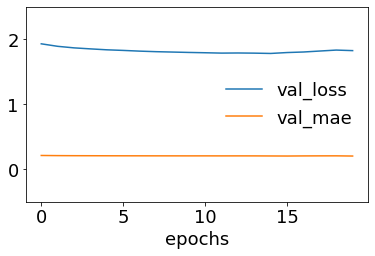

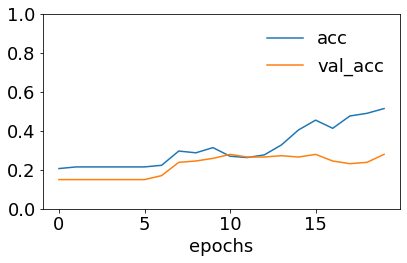

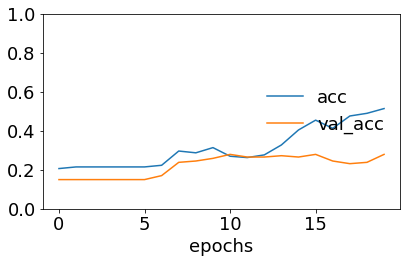

243/243 [==============================] - 1s 3ms/sample - loss: 1.8216 - accuracy: 0.2387 - mae: 0.2057
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00030: early stopping
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_5 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_5 (Glob (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_11 (Dense)             (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


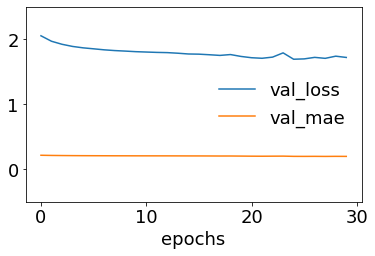

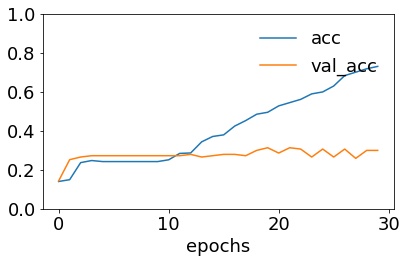

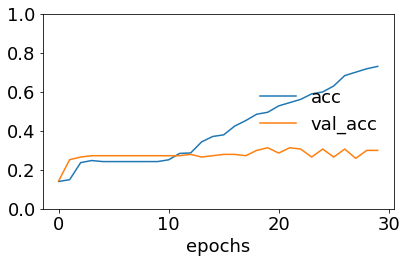

243/243 [==============================] - 1s 3ms/sample - loss: 1.8058 - accuracy: 0.2593 - mae: 0.2027
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_6 (Embedding)      (None, 432, 300)          4866600   
_________________________________________________________________
bidirectional_6 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_6 (Glob (None, 64)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_13 (Dense)             (None, 8)                 136       
Total params: 4,953,024
Trainable params: 4,953,024
Non-trainable params: 0
_________________________________________________________________


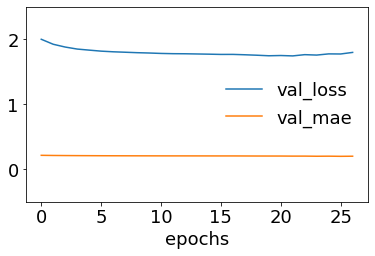

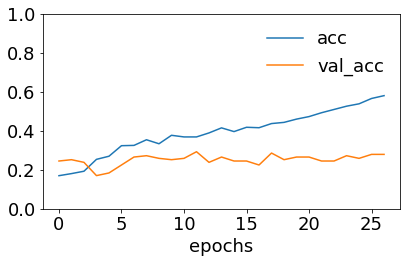

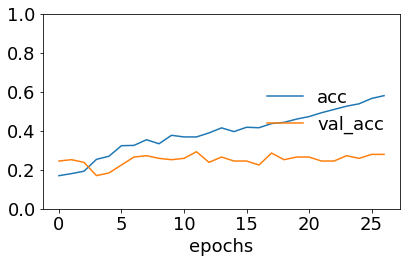

243/243 [==============================] - 1s 3ms/sample - loss: 1.7656 - accuracy: 0.3004 - mae: 0.2024


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_1 = bilstm(texts1, data_1, embedding_matrix_1, num1)  # 20% data augmentation


Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_7 (Embedding)      (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_7 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_7 (Glob (None, 64)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_15 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


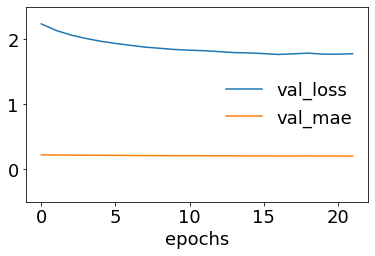

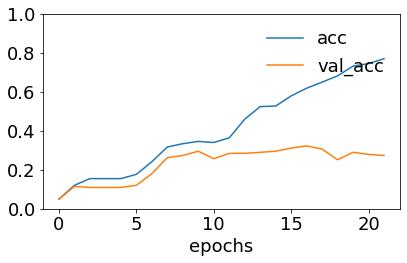

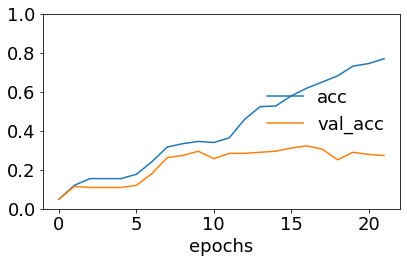

305/305 [==============================] - 0s 620us/sample - loss: 1.8111 - accuracy: 0.2393 - mae: 0.2065
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_8 (Embedding)      (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_8 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_8 (Glob (None, 64)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_17 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


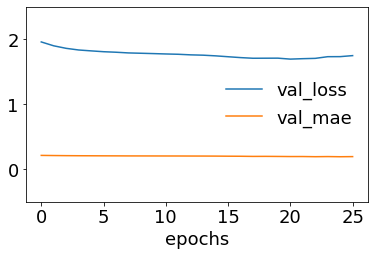

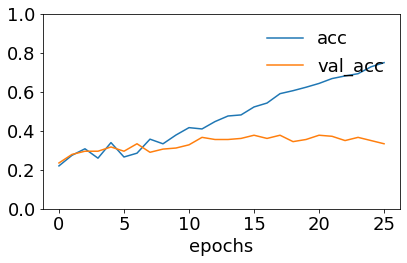

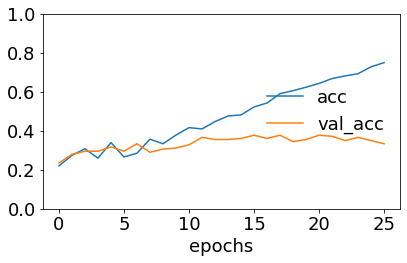

305/305 [==============================] - 0s 612us/sample - loss: 1.7806 - accuracy: 0.3279 - mae: 0.2008
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_9 (Bidirection (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_9 (Glob (None, 64)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_19 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


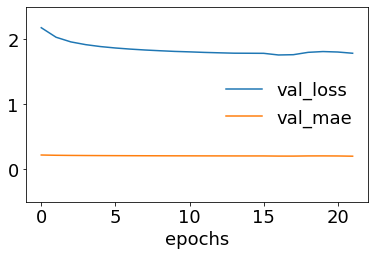

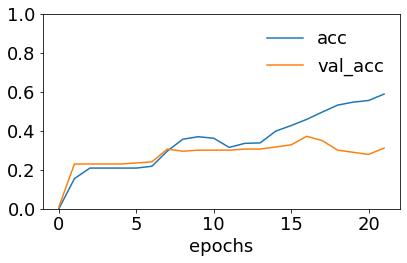

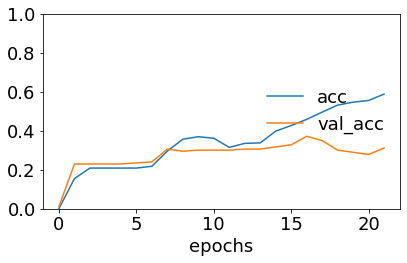

304/304 [==============================] - 0s 603us/sample - loss: 1.8137 - accuracy: 0.2566 - mae: 0.2052
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00031: early stopping
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_10 (Embedding)     (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_10 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_10 (Glo (None, 64)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_21 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


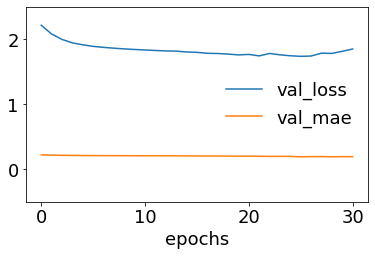

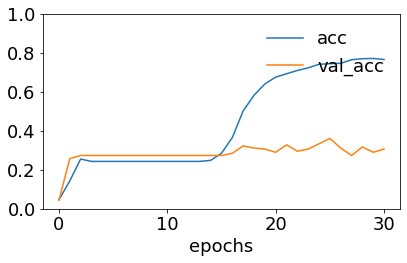

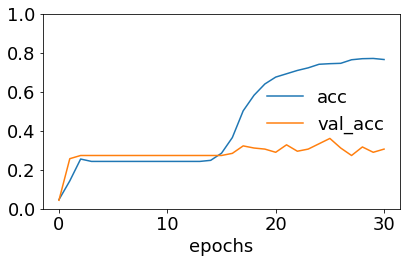

304/304 [==============================] - 1s 3ms/sample - loss: 1.8338 - accuracy: 0.2993 - mae: 0.1977
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00028: early stopping
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_11 (Embedding)     (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_11 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_11 (Glo (None, 64)                0         
_________________________________________________________________
dense_22 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_23 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


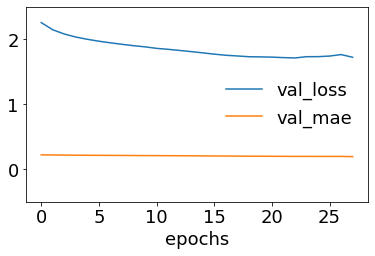

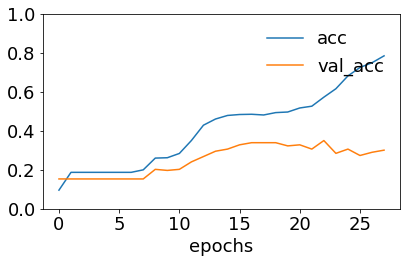

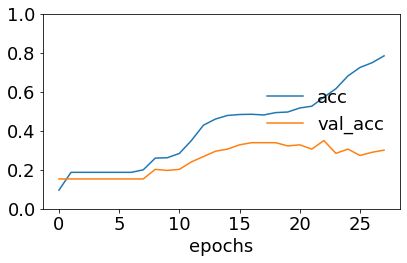

304/304 [==============================] - 1s 2ms/sample - loss: 1.7902 - accuracy: 0.2928 - mae: 0.2022
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_12 (Embedding)     (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_12 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_12 (Glo (None, 64)                0         
_________________________________________________________________
dense_24 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_25 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


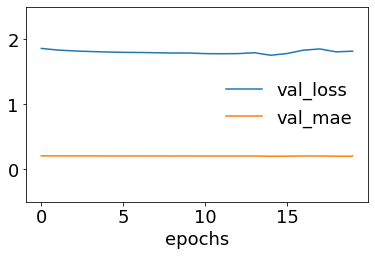

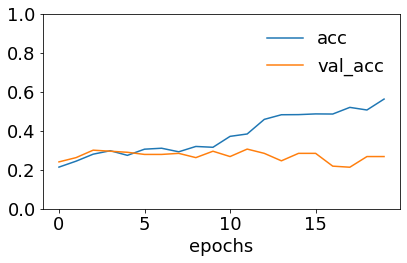

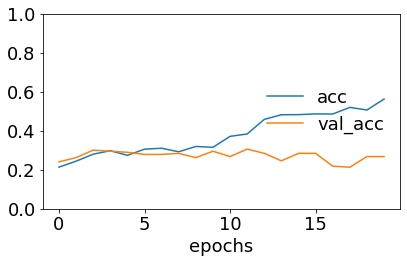

304/304 [==============================] - 1s 3ms/sample - loss: 1.8035 - accuracy: 0.2697 - mae: 0.2029
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_13 (Embedding)     (None, 432, 300)          5818500   
_________________________________________________________________
bidirectional_13 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_13 (Glo (None, 64)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_27 (Dense)             (None, 8)                 136       
Total params: 5,904,924
Trainable params: 5,904,924
Non-trainable params: 0
_________________________________________________________________


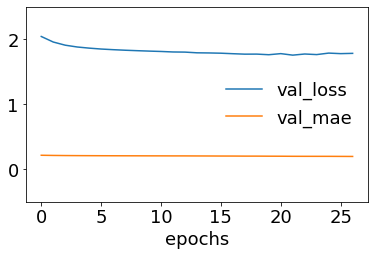

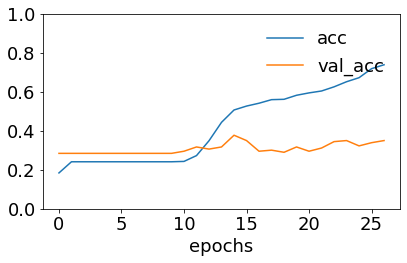

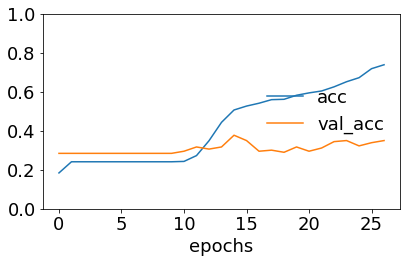

304/304 [==============================] - 1s 3ms/sample - loss: 1.7767 - accuracy: 0.3092 - mae: 0.2013


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_2 = bilstm(texts2, data_2, embedding_matrix_2, num2)  # 50% data augmentation


Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_14 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_14 (Glo (None, 64)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_29 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


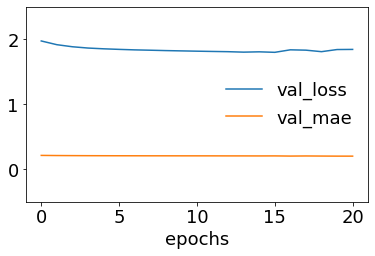

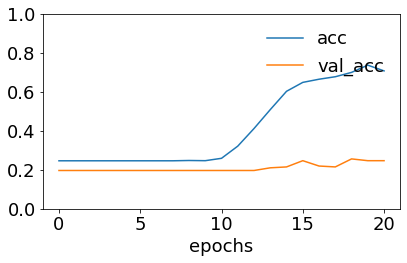

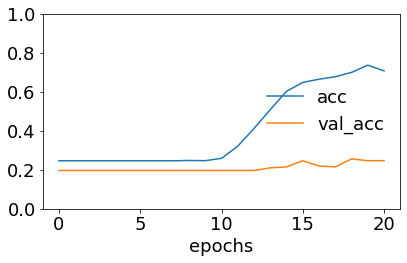

366/366 [==============================] - 0s 634us/sample - loss: 1.8019 - accuracy: 0.2322 - mae: 0.2057
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_15 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_15 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_15 (Glo (None, 64)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_31 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


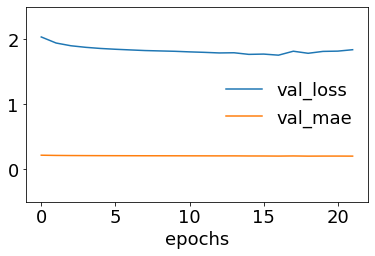

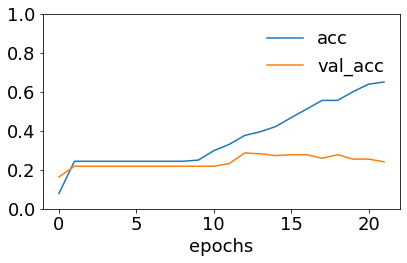

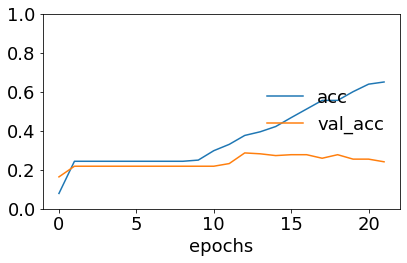

365/365 [==============================] - 1s 2ms/sample - loss: 1.7746 - accuracy: 0.2932 - mae: 0.2032
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_16 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_16 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_16 (Glo (None, 64)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_33 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


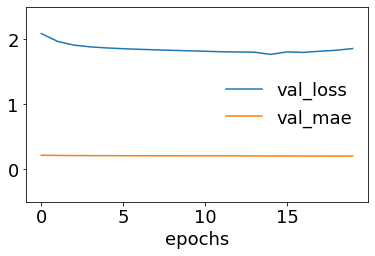

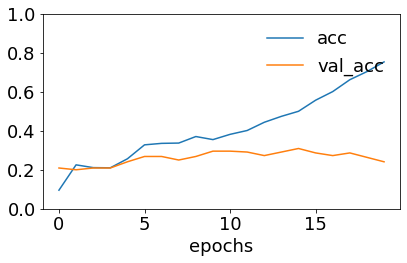

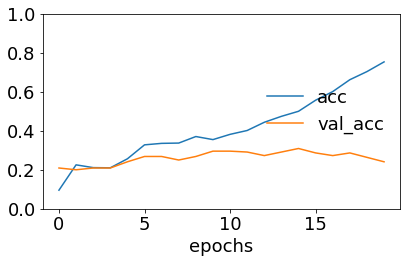

365/365 [==============================] - 1s 2ms/sample - loss: 1.7743 - accuracy: 0.2986 - mae: 0.2040
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00032: early stopping
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_17 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_17 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_17 (Glo (None, 64)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_35 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


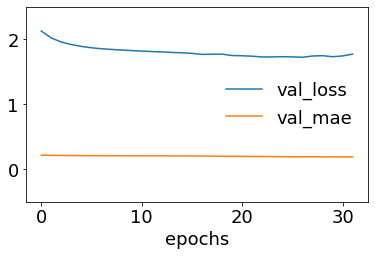

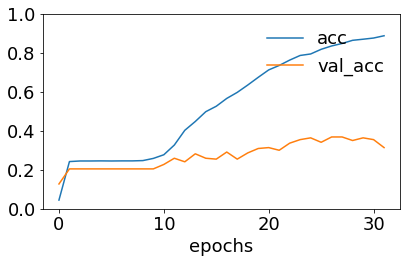

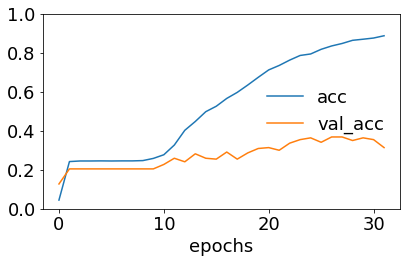

365/365 [==============================] - 1s 2ms/sample - loss: 1.8053 - accuracy: 0.3068 - mae: 0.1946
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_18 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_18 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_18 (Glo (None, 64)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_37 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


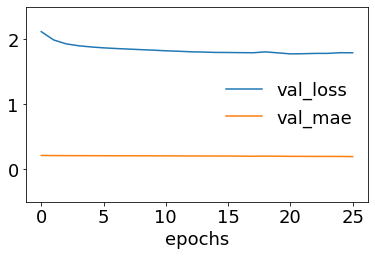

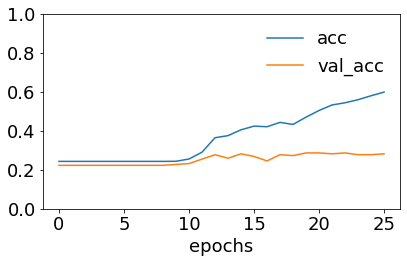

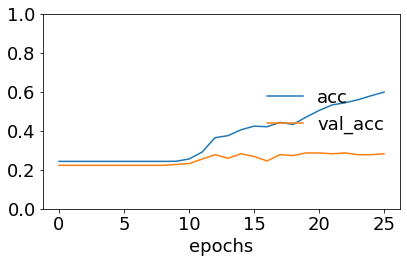

365/365 [==============================] - 0s 588us/sample - loss: 1.8287 - accuracy: 0.2767 - mae: 0.2008
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00028: early stopping
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_19 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_19 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_19 (Glo (None, 64)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_39 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


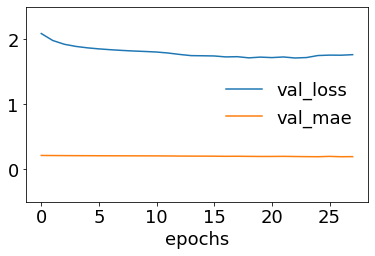

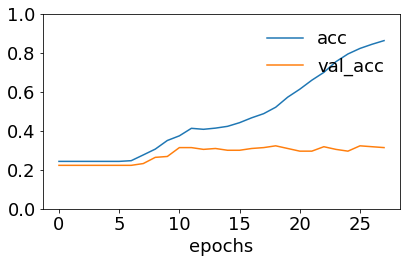

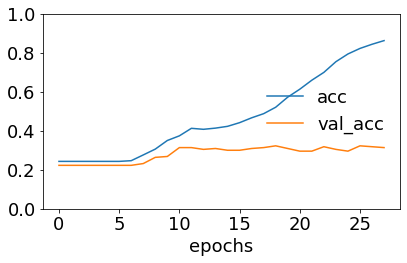

365/365 [==============================] - 0s 638us/sample - loss: 1.7686 - accuracy: 0.3178 - mae: 0.1988
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_20 (Embedding)     (None, 432, 300)          6346500   
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_20 (Glo (None, 64)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_41 (Dense)             (None, 8)                 136       
Total params: 6,432,924
Trainable params: 6,432,924
Non-trainable params: 0
_________________________________________________________________


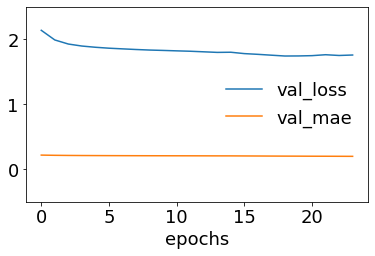

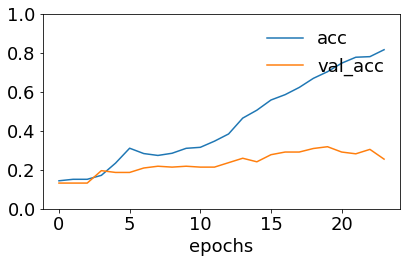

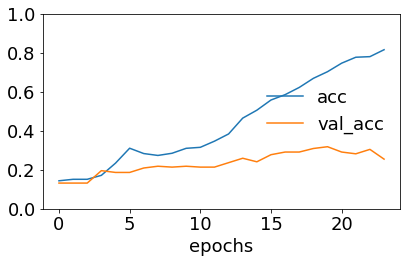

365/365 [==============================] - 0s 585us/sample - loss: 1.7666 - accuracy: 0.3096 - mae: 0.2036


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_3 = bilstm(texts3, data_3, embedding_matrix_3, num3)  # 80% data augmentation


Building Bi-LSTM model...
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_21 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_21 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_21 (Glo (None, 64)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_43 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


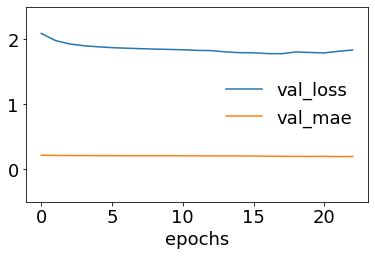

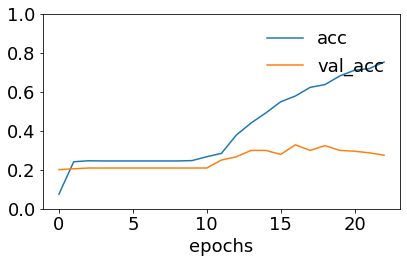

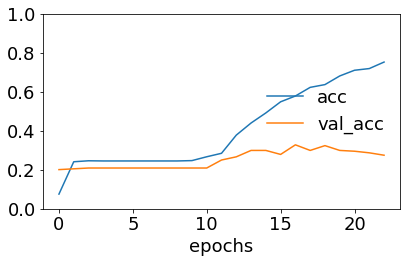

406/406 [==============================] - 1s 2ms/sample - loss: 1.8136 - accuracy: 0.2488 - mae: 0.2014
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_22 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_22 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_22 (Glo (None, 64)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_45 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


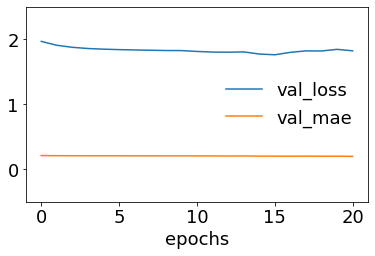

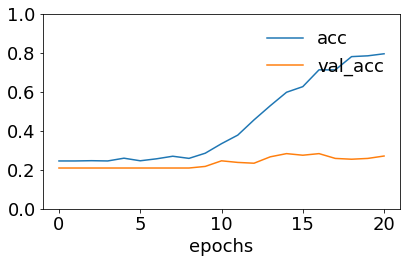

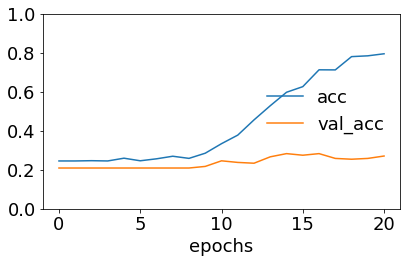

406/406 [==============================] - 0s 552us/sample - loss: 1.7544 - accuracy: 0.3177 - mae: 0.2011
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_23 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_23 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_23 (Glo (None, 64)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_47 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


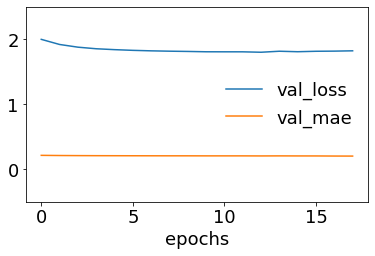

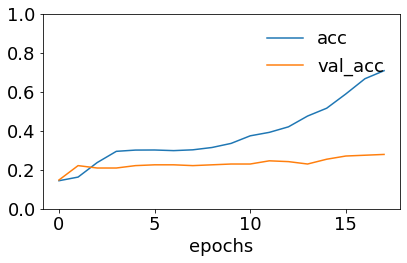

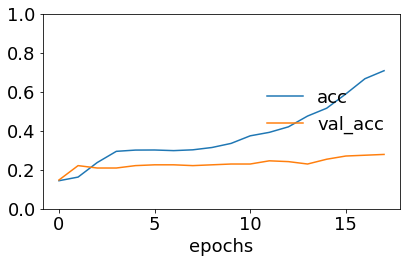

406/406 [==============================] - 0s 624us/sample - loss: 1.7938 - accuracy: 0.2709 - mae: 0.2044
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_24 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_24 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_24 (Glo (None, 64)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_49 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


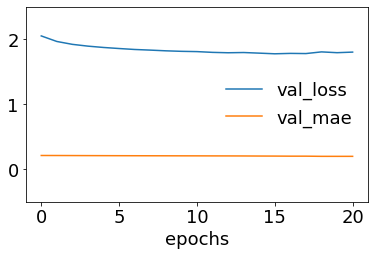

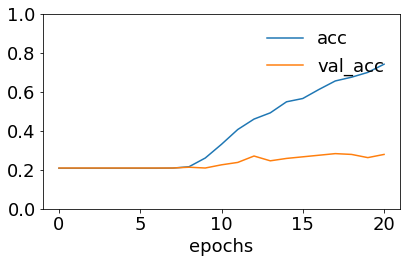

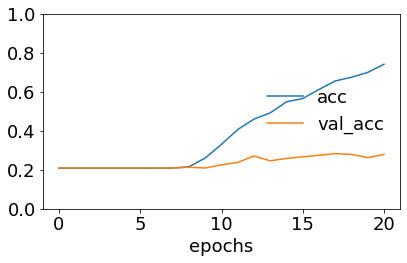

406/406 [==============================] - 0s 611us/sample - loss: 1.7767 - accuracy: 0.2783 - mae: 0.2027
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_25 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_25 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_25 (Glo (None, 64)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_51 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


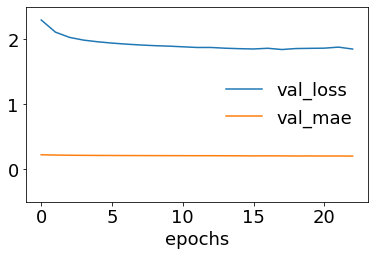

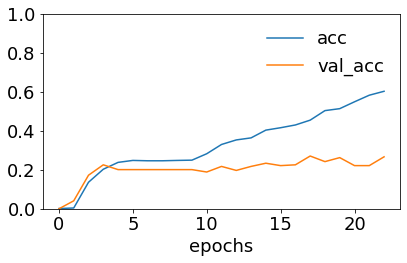

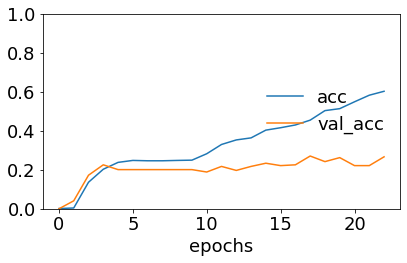

406/406 [==============================] - 0s 623us/sample - loss: 1.8172 - accuracy: 0.2759 - mae: 0.2047
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_26 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_26 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_26 (Glo (None, 64)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_53 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


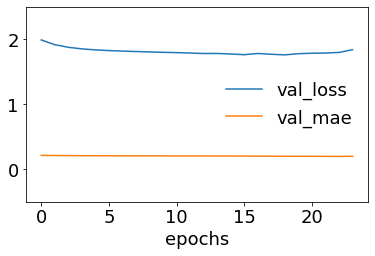

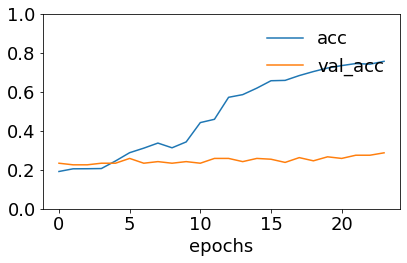

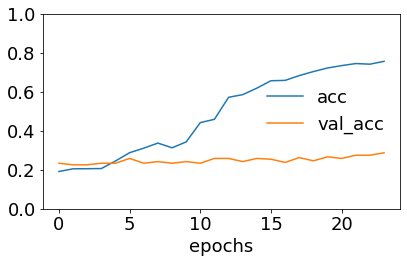

405/405 [==============================] - 1s 2ms/sample - loss: 1.8155 - accuracy: 0.2790 - mae: 0.2019
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_27 (Embedding)     (None, 432, 300)          6667200   
_________________________________________________________________
bidirectional_27 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_27 (Glo (None, 64)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_55 (Dense)             (None, 8)                 136       
Total params: 6,753,624
Trainable params: 6,753,624
Non-trainable params: 0
_________________________________________________________________


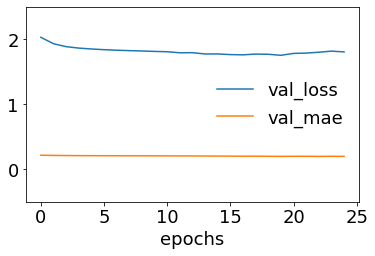

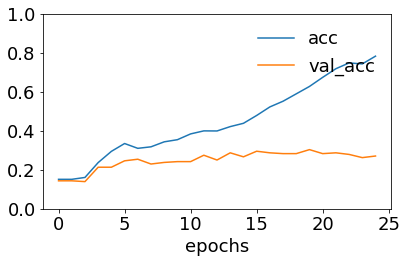

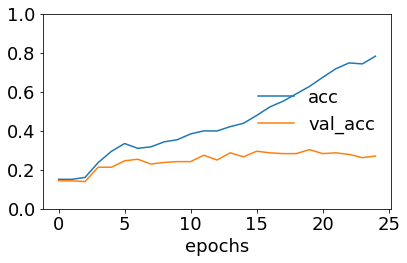

405/405 [==============================] - 1s 2ms/sample - loss: 1.7663 - accuracy: 0.3136 - mae: 0.1977


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_4 = bilstm(texts4, data_4, embedding_matrix_4, num4)  # 100% data augmentation


Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_28 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_28 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_28 (Glo (None, 64)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_57 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


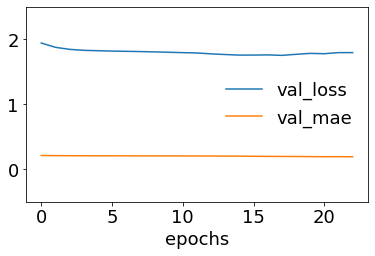

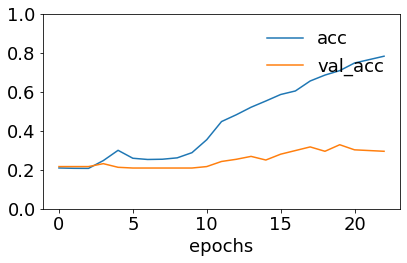

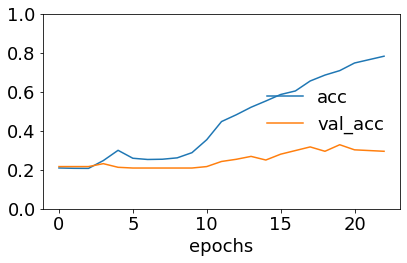

447/447 [==============================] - 0s 580us/sample - loss: 1.8261 - accuracy: 0.2886 - mae: 0.2000
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_29 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_29 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_29 (Glo (None, 64)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_59 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


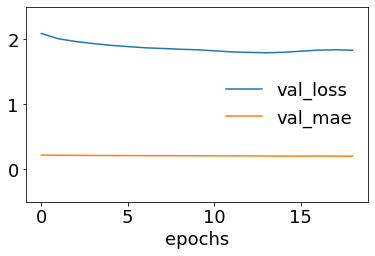

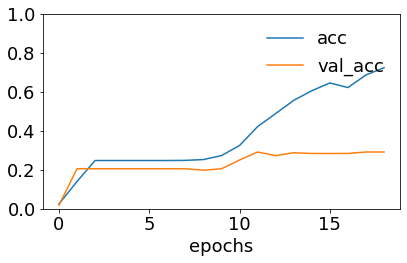

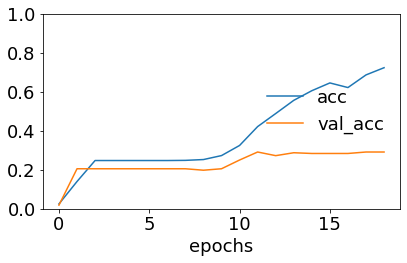

447/447 [==============================] - 0s 626us/sample - loss: 1.7816 - accuracy: 0.2796 - mae: 0.2028
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_30 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_30 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_30 (Glo (None, 64)                0         
_________________________________________________________________
dense_60 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_61 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


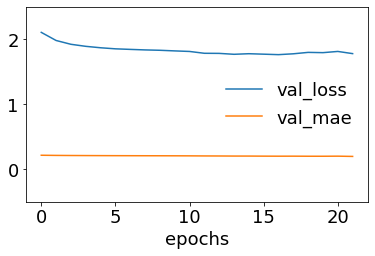

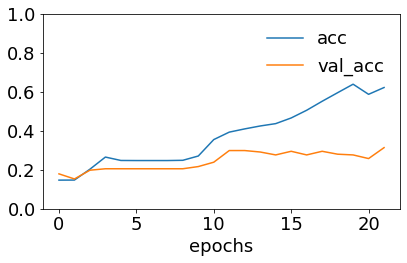

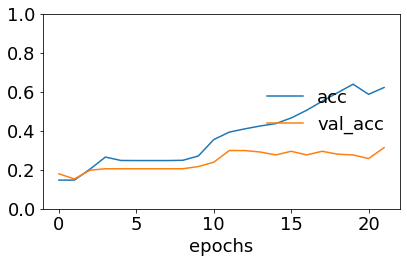

446/446 [==============================] - 1s 2ms/sample - loss: 1.7315 - accuracy: 0.3386 - mae: 0.1988
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_31 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_31 (Glo (None, 64)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_63 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


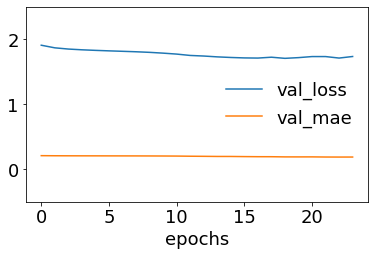

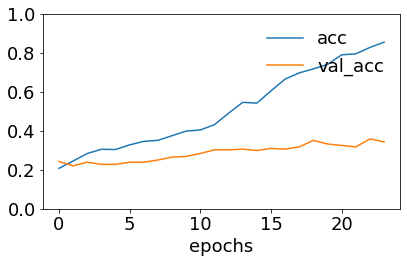

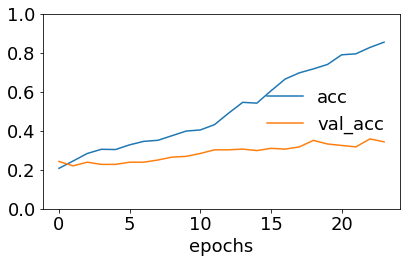

446/446 [==============================] - 1s 2ms/sample - loss: 1.7903 - accuracy: 0.2713 - mae: 0.1975
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_32 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_32 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_32 (Glo (None, 64)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_65 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


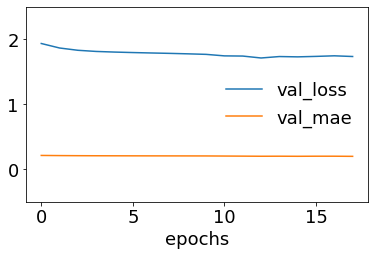

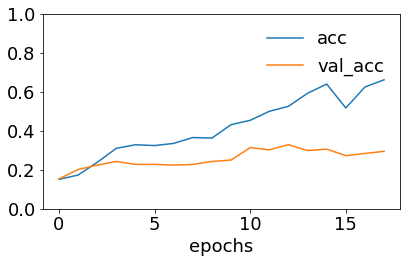

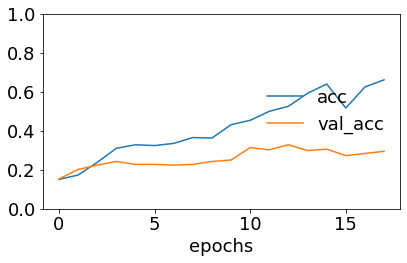

446/446 [==============================] - 0s 604us/sample - loss: 1.7538 - accuracy: 0.3027 - mae: 0.2019
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00030: early stopping
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_33 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_33 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_33 (Glo (None, 64)                0         
_________________________________________________________________
dense_66 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_67 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


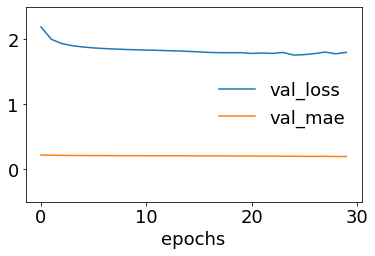

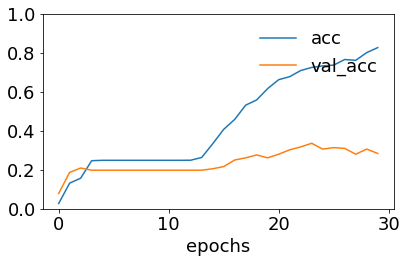

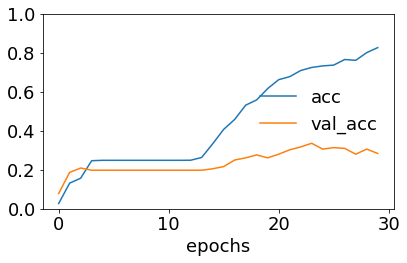

446/446 [==============================] - 0s 601us/sample - loss: 1.7947 - accuracy: 0.2915 - mae: 0.2015
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_34 (Embedding)     (None, 432, 300)          6873300   
_________________________________________________________________
bidirectional_34 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_34 (Glo (None, 64)                0         
_________________________________________________________________
dense_68 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_69 (Dense)             (None, 8)                 136       
Total params: 6,959,724
Trainable params: 6,959,724
Non-trainable params: 0
_________________________________________________________________


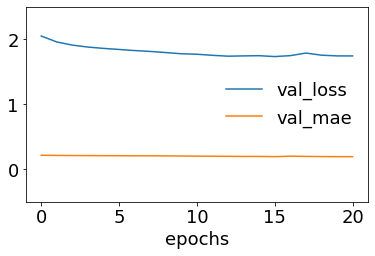

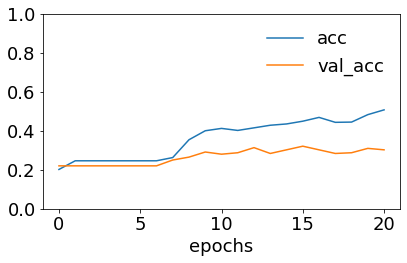

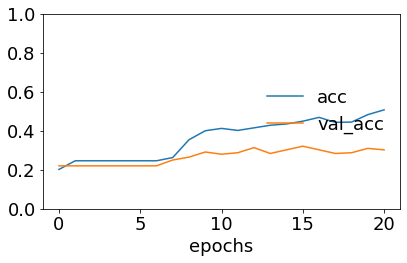

446/446 [==============================] - 0s 594us/sample - loss: 1.8251 - accuracy: 0.2937 - mae: 0.1989


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_5 = bilstm(texts5, data_5, embedding_matrix_5, num5)  # 120% data augmentation


Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_35 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_35 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_35 (Glo (None, 64)                0         
_________________________________________________________________
dense_70 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_71 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


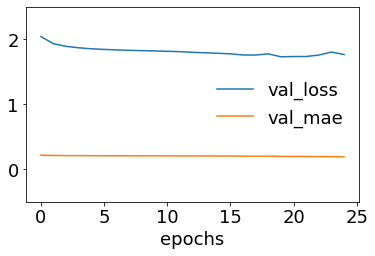

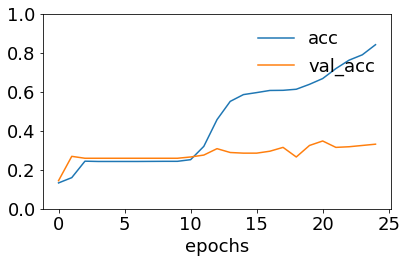

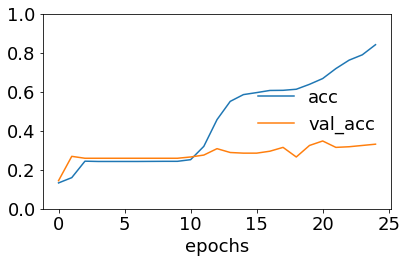

508/508 [==============================] - 0s 585us/sample - loss: 1.7348 - accuracy: 0.3209 - mae: 0.1991
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_36 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_36 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_36 (Glo (None, 64)                0         
_________________________________________________________________
dense_72 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_73 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


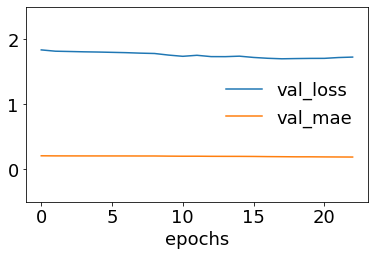

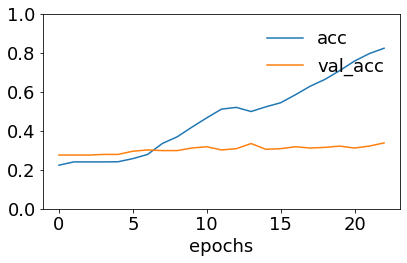

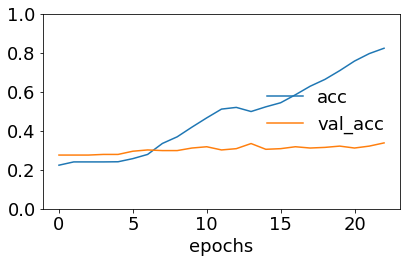

507/507 [==============================] - 1s 2ms/sample - loss: 1.6805 - accuracy: 0.3274 - mae: 0.1925
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_37 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_37 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_37 (Glo (None, 64)                0         
_________________________________________________________________
dense_74 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_75 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


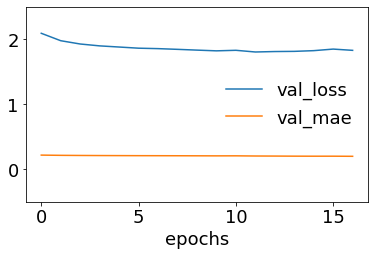

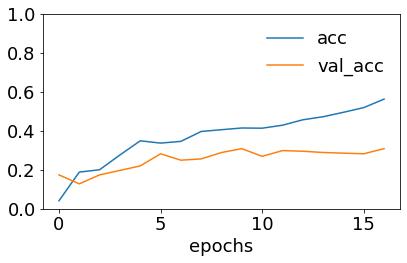

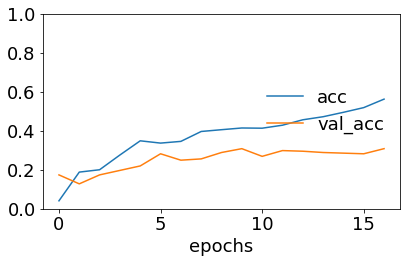

507/507 [==============================] - 1s 2ms/sample - loss: 1.8030 - accuracy: 0.2880 - mae: 0.2048
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_38 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_38 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_38 (Glo (None, 64)                0         
_________________________________________________________________
dense_76 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_77 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


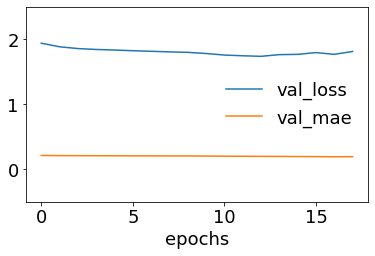

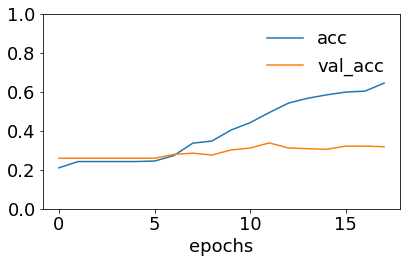

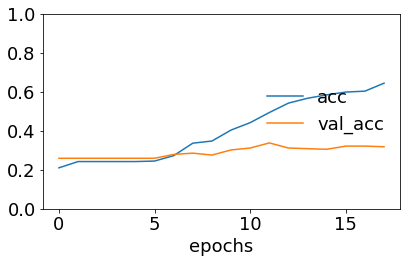

507/507 [==============================] - 0s 585us/sample - loss: 1.7277 - accuracy: 0.3254 - mae: 0.1983
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_39 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_39 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_39 (Glo (None, 64)                0         
_________________________________________________________________
dense_78 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_79 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


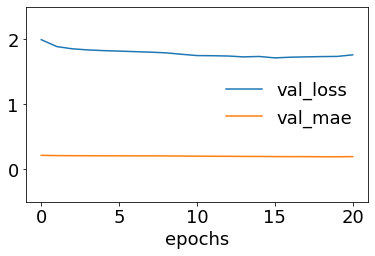

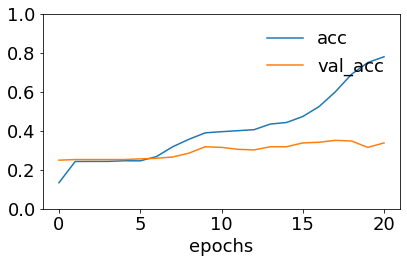

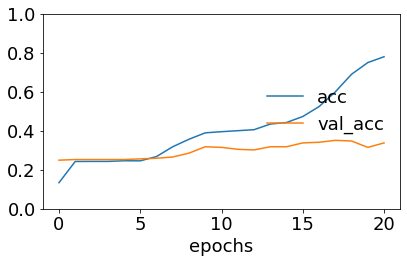

507/507 [==============================] - 0s 599us/sample - loss: 1.7077 - accuracy: 0.3412 - mae: 0.1952
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_40 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_40 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_40 (Glo (None, 64)                0         
_________________________________________________________________
dense_80 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_81 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


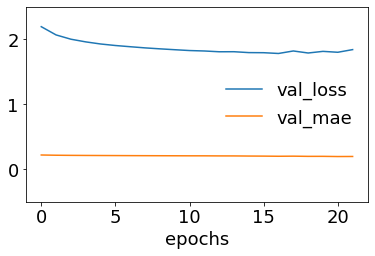

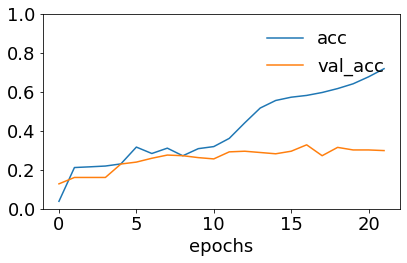

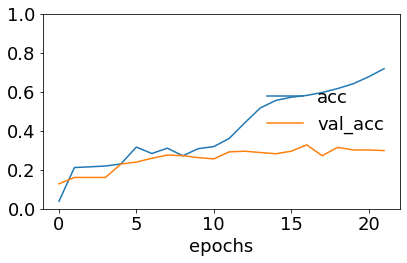

507/507 [==============================] - 0s 597us/sample - loss: 1.7742 - accuracy: 0.3037 - mae: 0.2003
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_41 (Embedding)     (None, 432, 300)          7126800   
_________________________________________________________________
bidirectional_41 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_41 (Glo (None, 64)                0         
_________________________________________________________________
dense_82 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_83 (Dense)             (None, 8)                 136       
Total params: 7,213,224
Trainable params: 7,213,224
Non-trainable params: 0
_________________________________________________________________


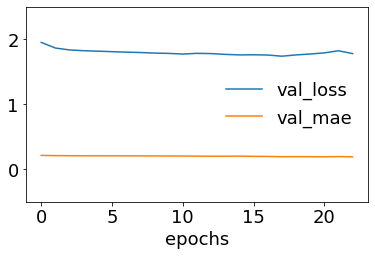

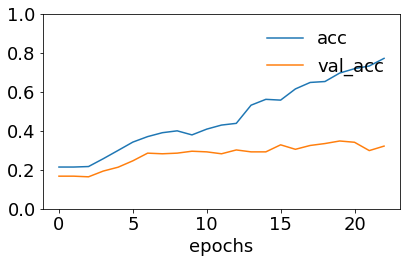

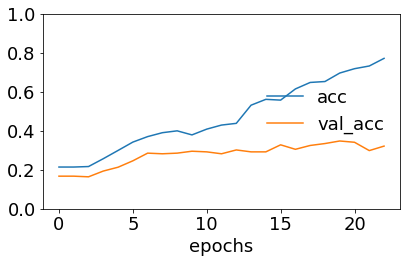

507/507 [==============================] - 0s 584us/sample - loss: 1.7975 - accuracy: 0.2939 - mae: 0.1973


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_6 = bilstm(texts6, data_6, embedding_matrix_6, num6)  # 150% data augmentation


Building Bi-LSTM model...
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_42 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_42 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_42 (Glo (None, 64)                0         
_________________________________________________________________
dense_84 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_85 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


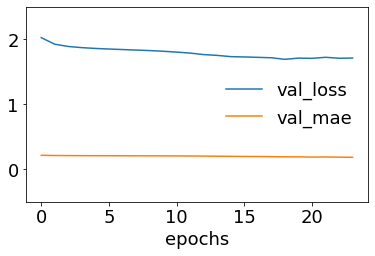

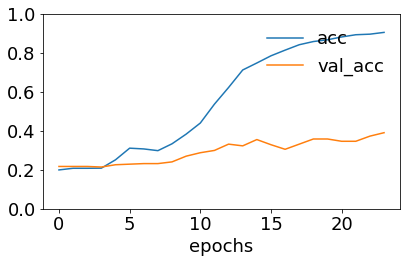

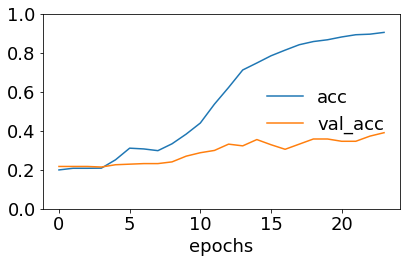

568/568 [==============================] - 1s 2ms/sample - loss: 1.7353 - accuracy: 0.3116 - mae: 0.1956
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_43 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_43 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_43 (Glo (None, 64)                0         
_________________________________________________________________
dense_86 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_87 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


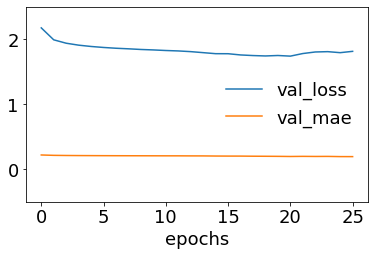

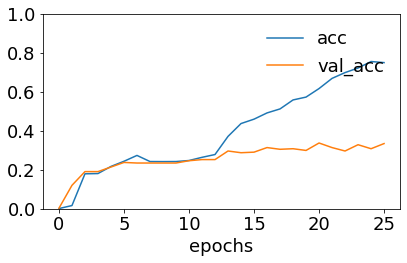

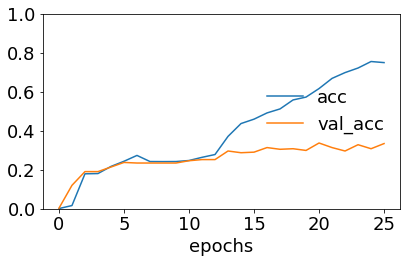

568/568 [==============================] - 0s 591us/sample - loss: 1.8240 - accuracy: 0.2923 - mae: 0.2002
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_44 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_44 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_44 (Glo (None, 64)                0         
_________________________________________________________________
dense_88 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_89 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


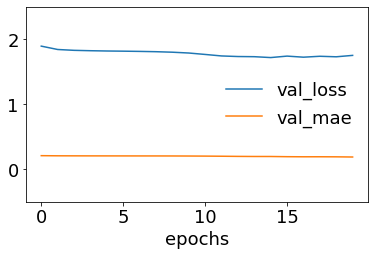

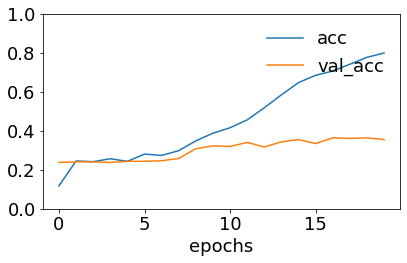

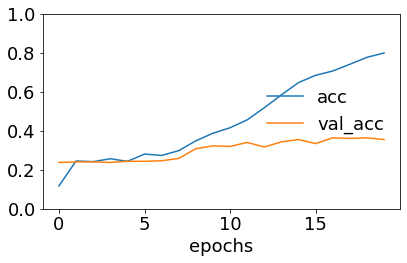

568/568 [==============================] - 0s 617us/sample - loss: 1.6773 - accuracy: 0.3768 - mae: 0.1962
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_45 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_45 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_45 (Glo (None, 64)                0         
_________________________________________________________________
dense_90 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_91 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


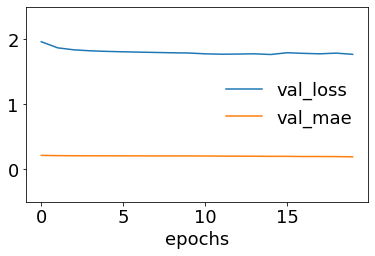

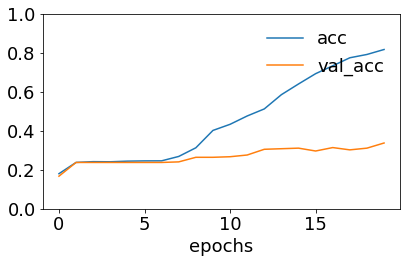

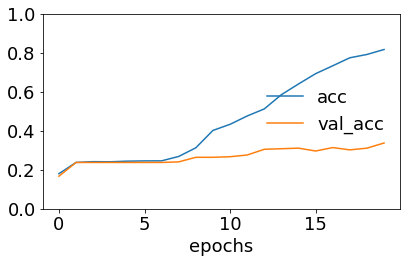

568/568 [==============================] - 0s 583us/sample - loss: 1.7750 - accuracy: 0.3099 - mae: 0.1993
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_46 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_46 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_46 (Glo (None, 64)                0         
_________________________________________________________________
dense_92 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_93 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


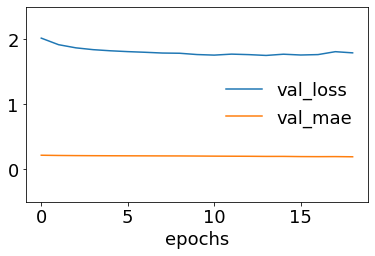

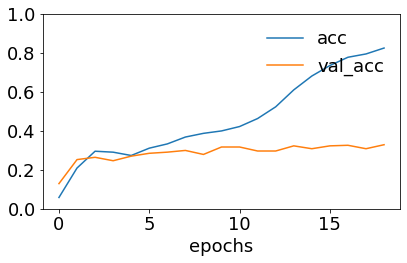

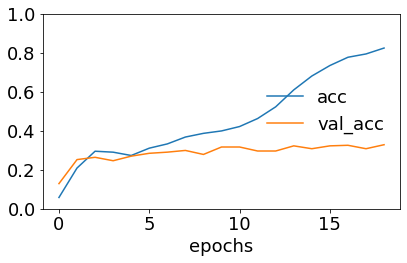

568/568 [==============================] - 0s 584us/sample - loss: 1.7341 - accuracy: 0.3187 - mae: 0.1975
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00015: early stopping
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_47 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_47 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_47 (Glo (None, 64)                0         
_________________________________________________________________
dense_94 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_95 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


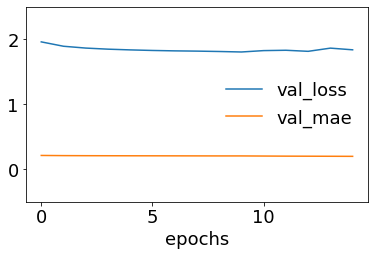

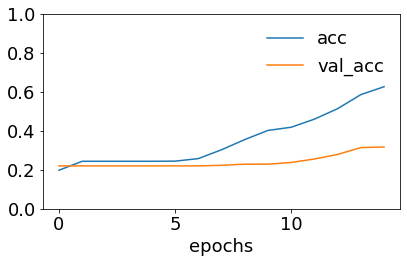

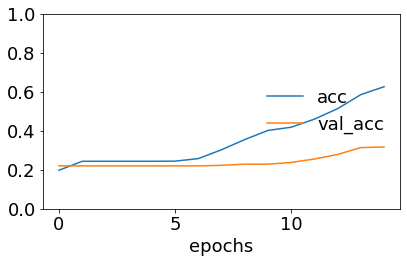

568/568 [==============================] - 0s 638us/sample - loss: 1.7890 - accuracy: 0.2465 - mae: 0.2051
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_48 (Embedding)     (None, 432, 300)          7315800   
_________________________________________________________________
bidirectional_48 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_48 (Glo (None, 64)                0         
_________________________________________________________________
dense_96 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_97 (Dense)             (None, 8)                 136       
Total params: 7,402,224
Trainable params: 7,402,224
Non-trainable params: 0
_________________________________________________________________


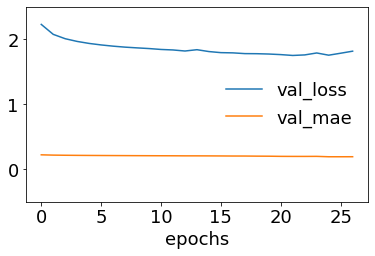

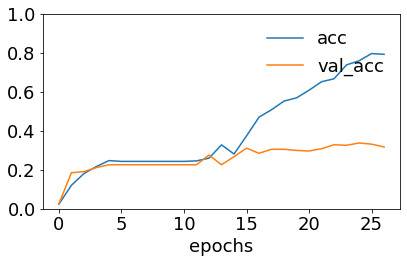

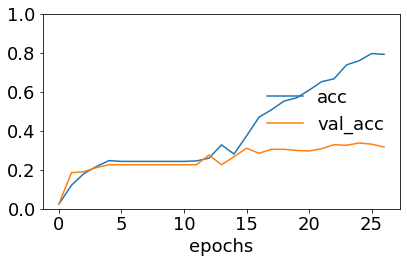

568/568 [==============================] - 0s 585us/sample - loss: 1.7325 - accuracy: 0.3239 - mae: 0.1965


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_7 = bilstm(texts7, data_7, embedding_matrix_7, num7)  # 180% data augmentation


Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_49 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_49 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_49 (Glo (None, 64)                0         
_________________________________________________________________
dense_98 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_99 (Dense)             (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


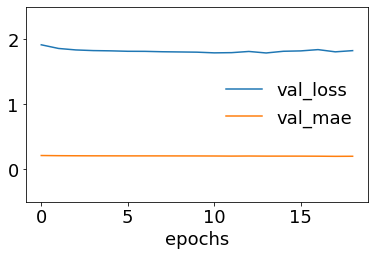

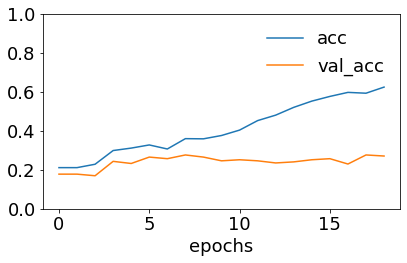

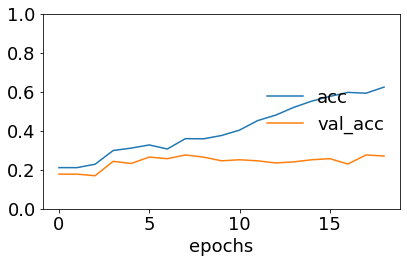

609/609 [==============================] - 0s 560us/sample - loss: 1.7765 - accuracy: 0.2529 - mae: 0.2023
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_50 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_50 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_50 (Glo (None, 64)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_101 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


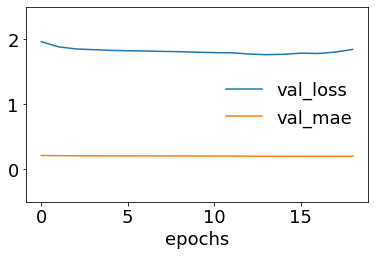

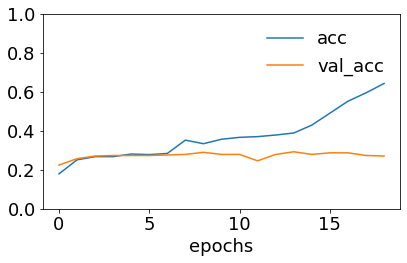

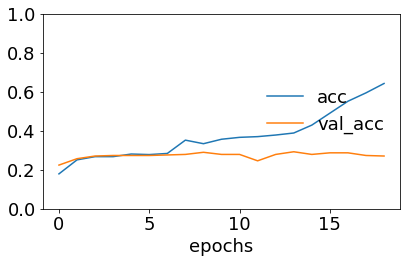

609/609 [==============================] - 0s 604us/sample - loss: 1.7949 - accuracy: 0.2562 - mae: 0.2032
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_51 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_51 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_51 (Glo (None, 64)                0         
_________________________________________________________________
dense_102 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_103 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


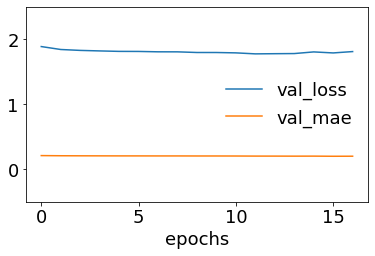

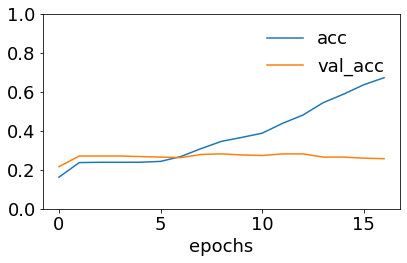

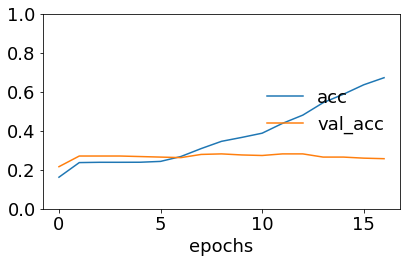

609/609 [==============================] - 0s 600us/sample - loss: 1.7892 - accuracy: 0.2841 - mae: 0.2039
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_52 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_52 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_52 (Glo (None, 64)                0         
_________________________________________________________________
dense_104 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_105 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


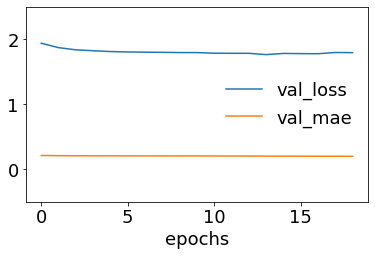

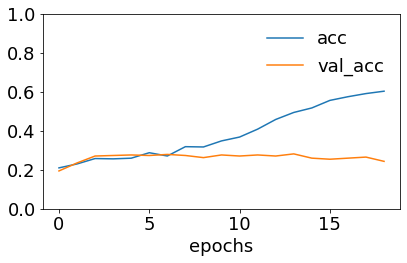

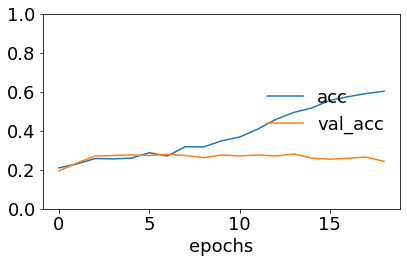

609/609 [==============================] - 0s 638us/sample - loss: 1.7845 - accuracy: 0.2660 - mae: 0.2032
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_53 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_53 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_53 (Glo (None, 64)                0         
_________________________________________________________________
dense_106 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_107 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


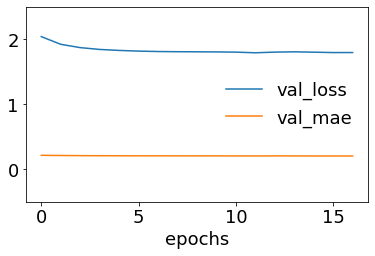

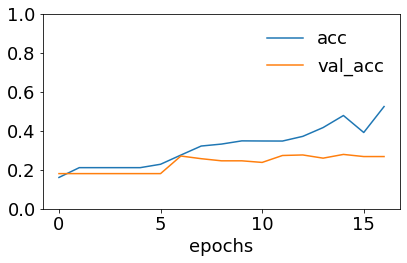

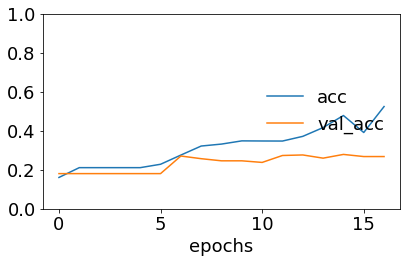

608/608 [==============================] - 1s 2ms/sample - loss: 1.7961 - accuracy: 0.2138 - mae: 0.2057
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_54 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_54 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_54 (Glo (None, 64)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_109 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


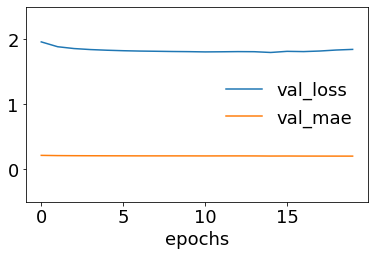

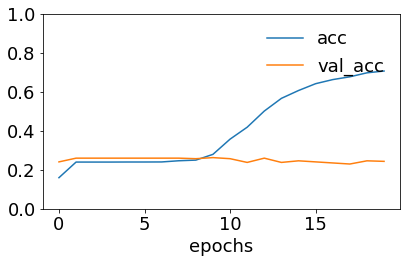

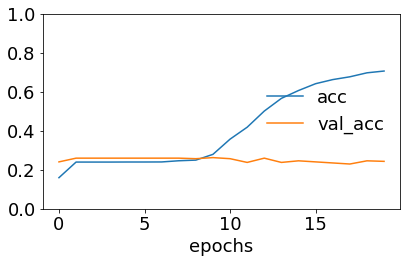

608/608 [==============================] - 1s 2ms/sample - loss: 1.7621 - accuracy: 0.2780 - mae: 0.2024
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_55 (Embedding)     (None, 432, 300)          6673500   
_________________________________________________________________
bidirectional_55 (Bidirectio (None, 432, 64)           85248     
_________________________________________________________________
global_max_pooling1d_55 (Glo (None, 64)                0         
_________________________________________________________________
dense_110 (Dense)            (None, 16)                1040      
_________________________________________________________________
dense_111 (Dense)            (None, 8)                 136       
Total params: 6,759,924
Trainable params: 6,759,924
Non-trainable params: 0
_________________________________________________________________


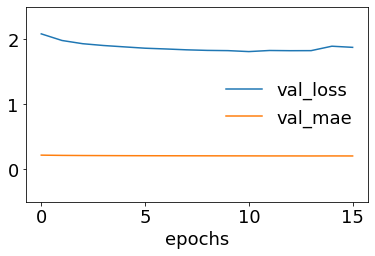

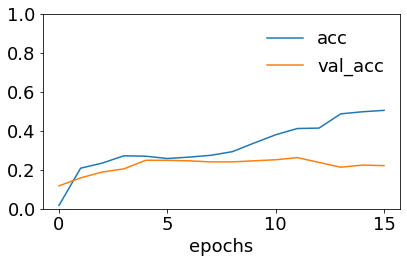

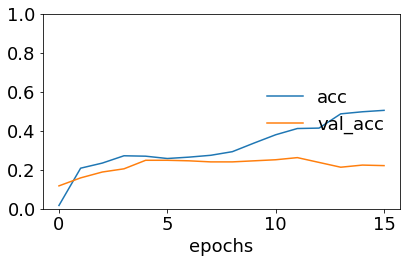

608/608 [==============================] - 1s 2ms/sample - loss: 1.8242 - accuracy: 0.2484 - mae: 0.2067


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_8 = bilstm(texts8, data_8, embedding_matrix_8, num8)  # 200% data augmentation

In [0]:
print('20% augmentation')
print(scores_bilstm_1.mean())
print('\n50% augmentation')
print(scores_bilstm_2.mean())
print('\n80% augmentation')
print(scores_bilstm_3.mean())
print('\n100% augmentation')
print(scores_bilstm_4.mean())
print('\n120% augmentation')
print(scores_bilstm_5.mean())
print('\n150% augmentation')
print(scores_bilstm_6.mean())
print('\n180% augmentation')
print(scores_bilstm_7.mean())
print('\n200% augmentation')
print(scores_bilstm_8.mean())

20% augmentation
accuracy             0.268186
precision            0.182795
recall               0.268186
f1                   0.184729
cohen_kappa_score    0.055262
auc                  0.562960
dtype: float64

50% augmentation
accuracy             0.284978
precision            0.192425
recall               0.284978
f1                   0.215412
cohen_kappa_score    0.080165
auc                  0.575922
dtype: float64

80% augmentation
accuracy             0.290711
precision            0.223777
recall               0.290711
f1                   0.225586
cohen_kappa_score    0.096313
auc                  0.602842
dtype: float64

100% augmentation
accuracy             0.283460
precision            0.205721
recall               0.283460
f1                   0.210260
cohen_kappa_score    0.085691
auc                  0.593574
dtype: float64

120% augmentation
accuracy             0.295142
precision            0.220554
recall               0.295142
f1                   0.228334
cohen_kap

#### Bi-LSTM + tf-idf

In [0]:
def tfidf(texts, data_cleaned):
  
  word_vectorizer = TfidfVectorizer(
      max_features=500)

  word_vectorizer.fit(data_cleaned['texts'])
  tf_idf = word_vectorizer.transform(data_cleaned['texts'])
  tf_idf = tf_idf.toarray()
  texts_tf= np.concatenate([texts, tf_idf], axis = 1)
  return tf_idf, texts_tf

In [0]:
# TF-IDF vector using 20% to 200% data augmentation (20%, 50%, 80%, 100%, 120%, 150%, 180%, 200%)
[tf1, texts_tf1] = tfidf(texts1, data_1)
[tf2, texts_tf2] = tfidf(texts2, data_2)
[tf3, texts_tf3] = tfidf(texts3, data_3)
[tf4, texts_tf4] = tfidf(texts4, data_4)
[tf5, texts_tf5] = tfidf(texts5, data_5)
[tf6, texts_tf6] = tfidf(texts6, data_6)
[tf7, texts_tf7] = tfidf(texts7, data_7)
[tf8, texts_tf8] = tfidf(texts8, data_8)

In [0]:
def bilstm_tf(texts_tf, data_cleaned, embedding_matrix, num_words):
  # some configuration
  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7


  print('Building Bi-LSTM model...')
  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 9)
  scores_bilstm_tf = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score', 'auc'])
  labels = data_cleaned['positivity'].values
  METRICS = [
        'accuracy',
        'mae'       
  ]



  embedding_layer = tf.keras.layers.Embedding(
    num_words,
    EMBEDDING_DIM,
    weights=[embedding_matrix],
    input_length=MAX_SEQUENCE_LENGTH,
    trainable=True
  )


  for train, test in kfold.split(texts_tf, labels):

    x_train = texts_tf[train]
    x_test = texts_tf[test]
    x_train_1 = x_train[:, : MAX_SEQUENCE_LENGTH] # training set for word embeddings using GloVe
    x_train_2 = x_train[:, MAX_SEQUENCE_LENGTH:] # training set for tfidf feature
    x_test_1 = x_test[:, :MAX_SEQUENCE_LENGTH] # testing set for word embedding using GloVe
    x_test_2 = x_test[:, MAX_SEQUENCE_LENGTH:] # testing set for tfidf feature

    y_train = pd.get_dummies(labels[train])
    y_test = pd.get_dummies(labels[test])

  # using list of zeros to represents missing classes
    m = sum(y_train.columns)-sum(y_test.columns)
    print(m)
    if m > 0:
      n = int(m)-2
      y_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      y_train.insert(n, abs(m), 0)

    input_1 = tf.keras.Input(shape=(MAX_SEQUENCE_LENGTH,))
    x = embedding_layer(input_1)
    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32))(x)   # LSTM layer on embedding layer

    input_2 = tf.keras.Input(shape=(500,))
    tf_vec = tf.keras.layers.LayerNormalization()(input_2)  # tfidf layer
    tf_vec = tf.keras.layers.Dense(32, activation = 'relu')(tf_vec)
    concat_layer = tf.keras.layers.Concatenate()([x, tf_vec])  # concatenate LSTM and tfidf layer
    
    dense_layer = tf.keras.layers.Dense(16, activation='sigmoid')(concat_layer)
    output = tf.keras.layers.Dense(8, activation='softmax')(dense_layer)
    
    model = tf.keras.models.Model([input_1, input_2], output)
    model.summary()
    
    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
    
    )


  # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)  # early stopping to avoid overfitting

    print('Training model...')
    r = model.fit(
      [x_train_1, x_train_2],
      y_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]
    )


    model.summary()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()


    predictions_bilstm_tf = model.predict([x_test_1, x_test_2])
    scores = model.evaluate(x = [x_test_1, x_test_2], y=y_test)    
    y_test = y_test.to_numpy()
    cnf_matrix = confusion_matrix(y_test.argmax(axis=1), predictions_bilstm_tf.argmax(axis=1))
    report = metrics.classification_report(y_test.argmax(axis=1), predictions_bilstm_tf.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)
    ck = cohen_kappa_score(y_test.argmax(axis=1), predictions_bilstm_tf.argmax(axis=1))

    #auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_bilstm_tf
    else:
      y_pred = np.delete(predictions_bilstm_tf, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')

    scores_bilstm_tf = scores_bilstm_tf.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                            'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                            'cohen_kappa_score': ck, 'auc': auc },  ignore_index=True)
  return scores_bilstm_tf

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_1[0][0]                    
__________________________________________________________________________________________________
layer_normalization (LayerNorma (None, 500)          1000        input_2[0][0]                    
______________________________________________________________________________________________

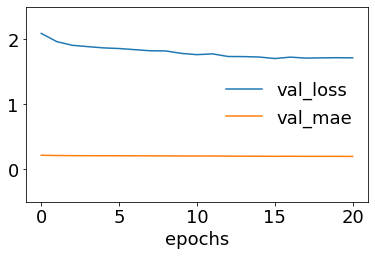

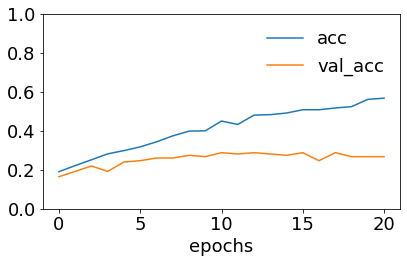

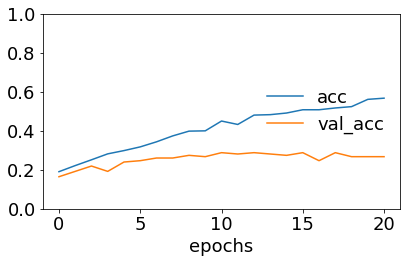

244/244 [==============================] - 0s 666us/sample - loss: 1.8051 - accuracy: 0.2828 - mae: 0.2022
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_3[0][0]                    
__________________________________________________________________________________________________
layer_normalization_1 (LayerNor (None, 500)          1000        input_4[0][0]                    
____________________________________________________________________________________________

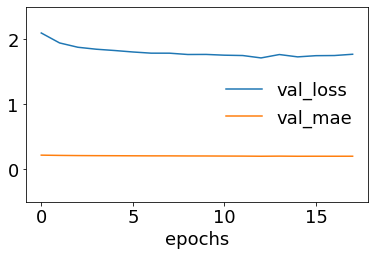

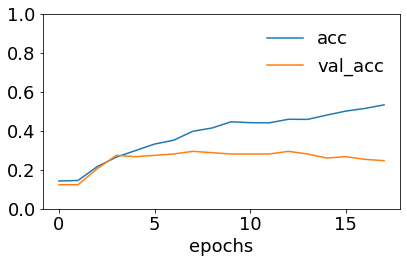

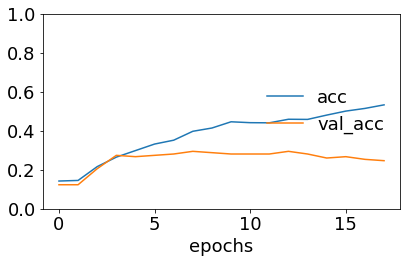

244/244 [==============================] - 0s 613us/sample - loss: 1.7493 - accuracy: 0.3238 - mae: 0.2004
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_5[0][0]                    
__________________________________________________________________________________________________
layer_normalization_2 (LayerNor (None, 500)          1000        input_6[0][0]                    
____________________________________________________________________________________________

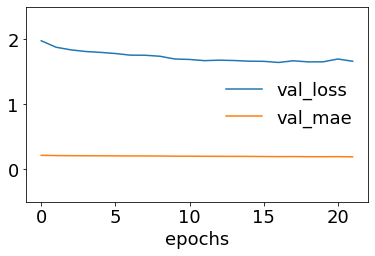

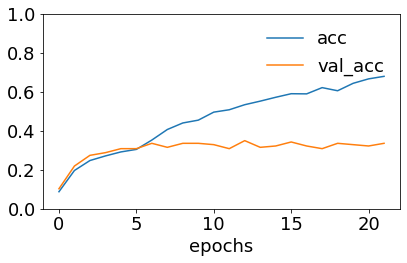

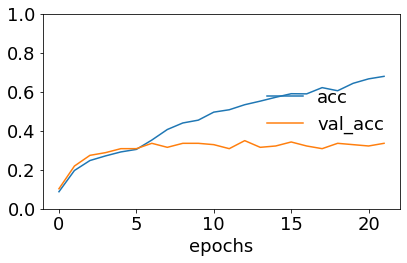

244/244 [==============================] - 0s 645us/sample - loss: 1.6522 - accuracy: 0.4098 - mae: 0.1932
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_7[0][0]                    
__________________________________________________________________________________________________
layer_normalization_3 (LayerNor (None, 500)          1000        input_8[0][0]                    
____________________________________________________________________________________________

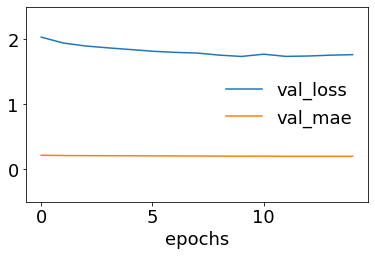

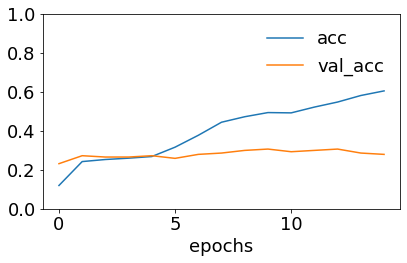

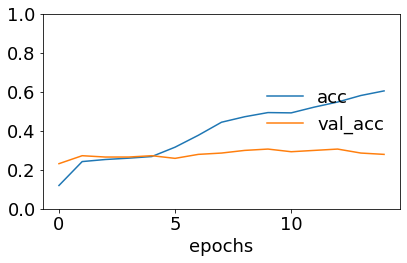

243/243 [==============================] - 1s 3ms/sample - loss: 1.6807 - accuracy: 0.3868 - mae: 0.1975
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_9[0][0]                    
__________________________________________________________________________________________________
layer_normalization_4 (LayerNor (None, 500)          1000        input_10[0][0]                   
____________________________________________________________________________________________

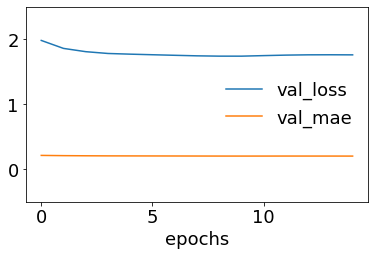

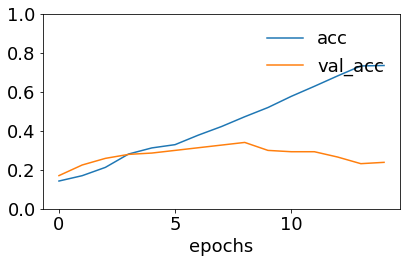

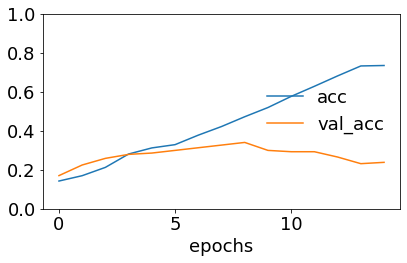

243/243 [==============================] - 1s 3ms/sample - loss: 1.7344 - accuracy: 0.3909 - mae: 0.2018
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_12 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_11[0][0]                   
__________________________________________________________________________________________________
layer_normalization_5 (LayerNor (None, 500)          1000        input_12[0][0]                   
____________________________________________________________________________________________

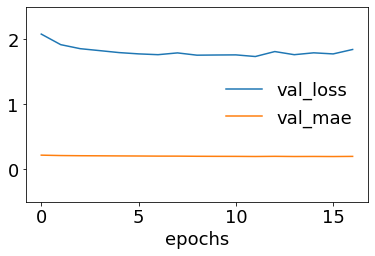

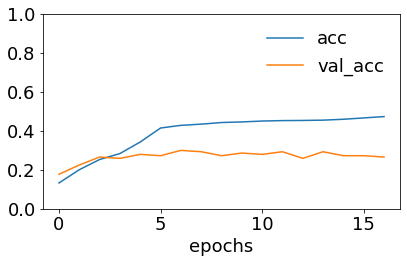

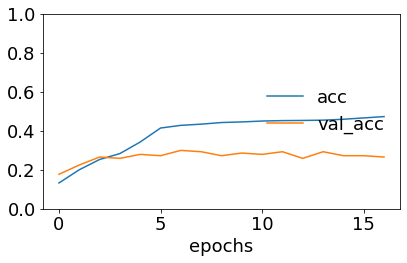

243/243 [==============================] - 1s 3ms/sample - loss: 1.5417 - accuracy: 0.4321 - mae: 0.1858
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_14 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_57 (Embedding)        (None, 432, 300)     4866600     input_13[0][0]                   
__________________________________________________________________________________________________
layer_normalization_6 (LayerNor (None, 500)          1000        input_14[0][0]                   
____________________________________________________________________________________________

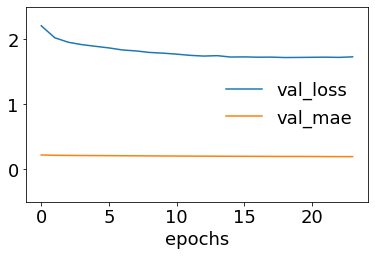

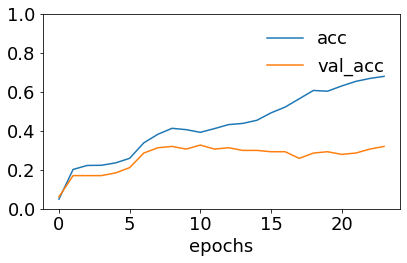

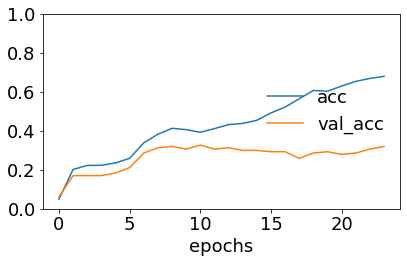

243/243 [==============================] - 1s 3ms/sample - loss: 1.5550 - accuracy: 0.3868 - mae: 0.1876


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_1 = bilstm_tf(texts_tf1, data_1, embedding_matrix_1, num1)  # 20% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_16 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_15[0][0]                   
__________________________________________________________________________________________________
layer_normalization_7 (LayerNor (None, 500)          1000        input_16[0][0]                   
____________________________________________________________________________________________

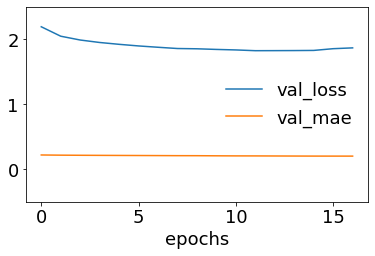

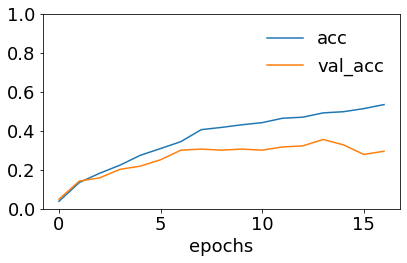

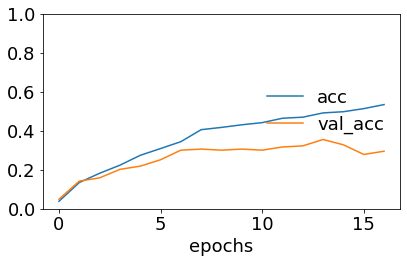

305/305 [==============================] - 0s 645us/sample - loss: 1.8342 - accuracy: 0.2984 - mae: 0.2059
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_18 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_17[0][0]                   
__________________________________________________________________________________________________
layer_normalization_8 (LayerNor (None, 500)          1000        input_18[0][0]                   
____________________________________________________________________________________________

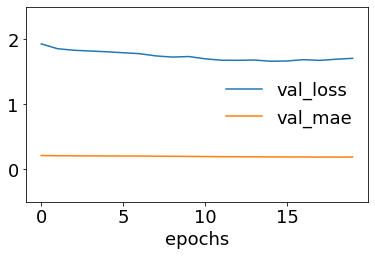

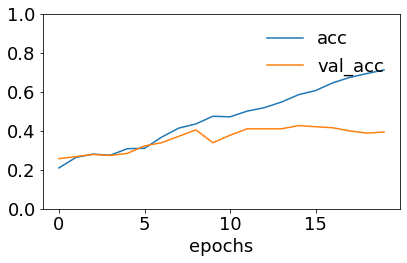

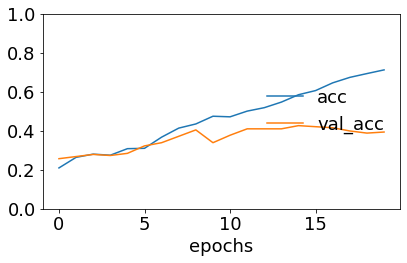

305/305 [==============================] - 0s 635us/sample - loss: 1.7465 - accuracy: 0.3344 - mae: 0.1950
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_20 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_19[0][0]                   
__________________________________________________________________________________________________
layer_normalization_9 (LayerNor (None, 500)          1000        input_20[0][0]                   
____________________________________________________________________________________________

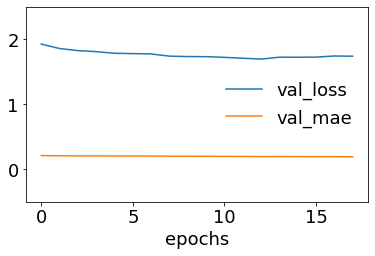

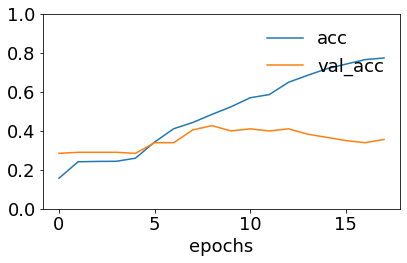

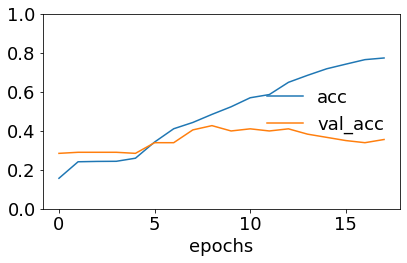

304/304 [==============================] - 0s 658us/sample - loss: 1.6532 - accuracy: 0.4309 - mae: 0.1941
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_22 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_21[0][0]                   
__________________________________________________________________________________________________
layer_normalization_10 (LayerNo (None, 500)          1000        input_22[0][0]                   
___________________________________________________________________________________________

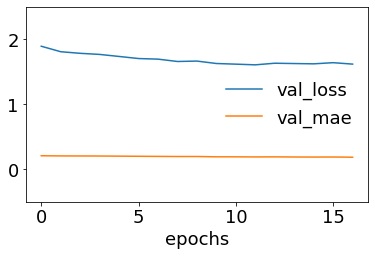

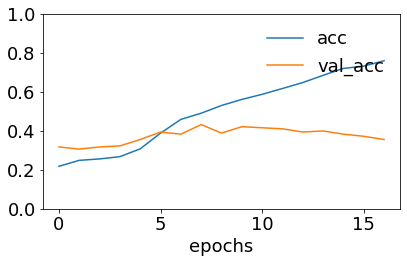

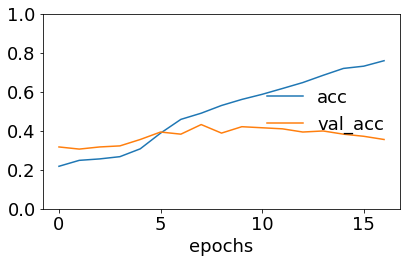

304/304 [==============================] - 1s 3ms/sample - loss: 1.5949 - accuracy: 0.3947 - mae: 0.1892
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_24 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_23[0][0]                   
__________________________________________________________________________________________________
layer_normalization_11 (LayerNo (None, 500)          1000        input_24[0][0]                   
___________________________________________________________________________________________

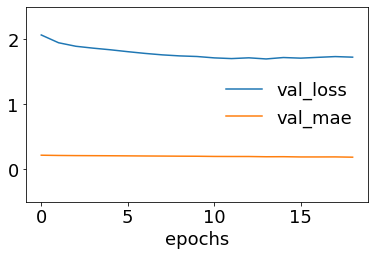

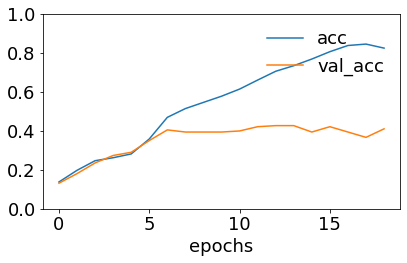

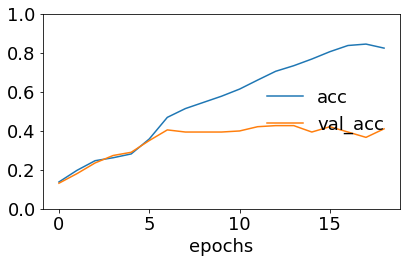

304/304 [==============================] - 1s 3ms/sample - loss: 1.5159 - accuracy: 0.4901 - mae: 0.1837
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_26 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_25[0][0]                   
__________________________________________________________________________________________________
layer_normalization_12 (LayerNo (None, 500)          1000        input_26[0][0]                   
___________________________________________________________________________________________

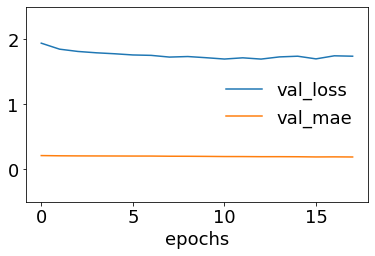

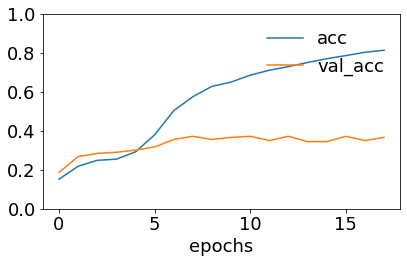

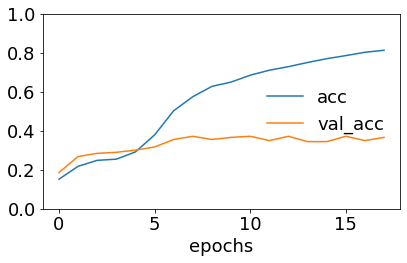

304/304 [==============================] - 1s 3ms/sample - loss: 1.4251 - accuracy: 0.5724 - mae: 0.1795
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_28 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_58 (Embedding)        (None, 432, 300)     5818500     input_27[0][0]                   
__________________________________________________________________________________________________
layer_normalization_13 (LayerNo (None, 500)          1000        input_28[0][0]                   
___________________________________________________________________________________________

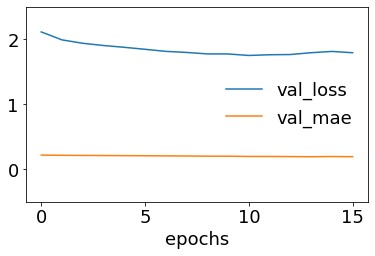

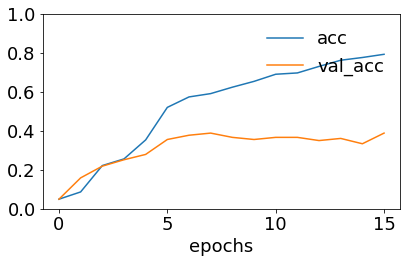

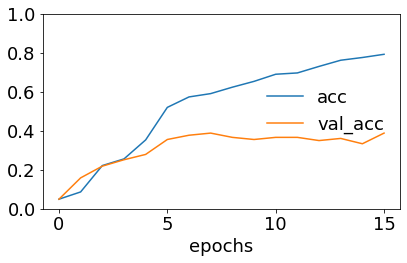

304/304 [==============================] - 1s 3ms/sample - loss: 1.4803 - accuracy: 0.5493 - mae: 0.1837


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_2 = bilstm_tf(texts_tf2, data_2, embedding_matrix_2, num2)  # 50% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_30 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_29[0][0]                   
__________________________________________________________________________________________________
layer_normalization_14 (LayerNo (None, 500)          1000        input_30[0][0]                   
___________________________________________________________________________________________

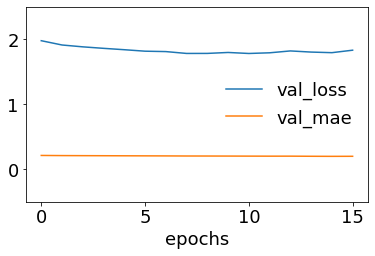

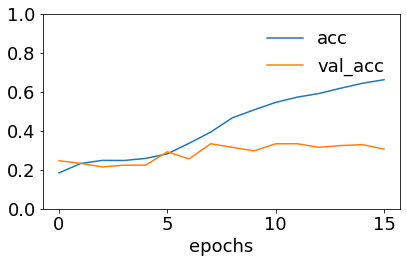

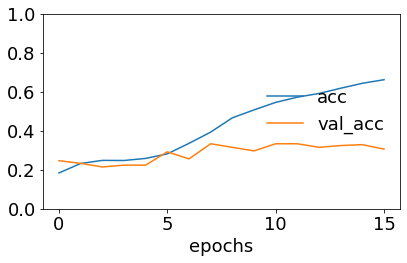

366/366 [==============================] - 0s 629us/sample - loss: 1.8178 - accuracy: 0.2842 - mae: 0.2036
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_32 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_31[0][0]                   
__________________________________________________________________________________________________
layer_normalization_15 (LayerNo (None, 500)          1000        input_32[0][0]                   
___________________________________________________________________________________________

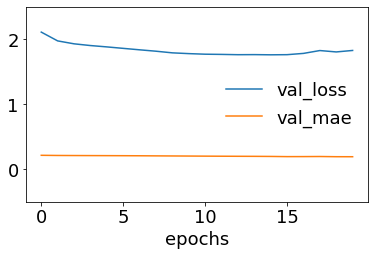

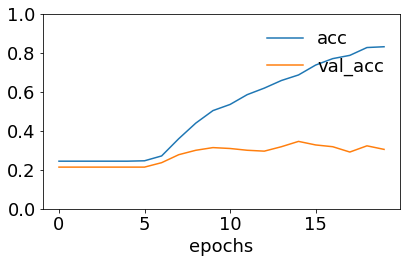

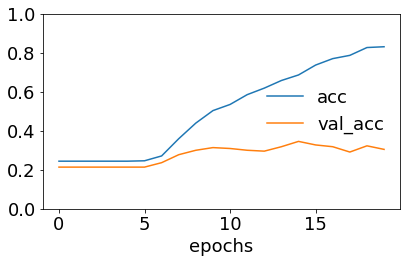

365/365 [==============================] - 1s 2ms/sample - loss: 1.6882 - accuracy: 0.3671 - mae: 0.1953
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_34 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_33[0][0]                   
__________________________________________________________________________________________________
layer_normalization_16 (LayerNo (None, 500)          1000        input_34[0][0]                   
___________________________________________________________________________________________

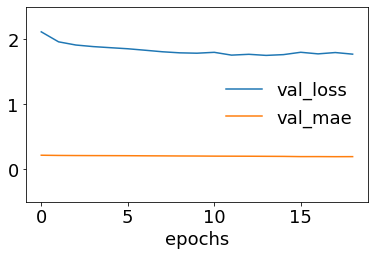

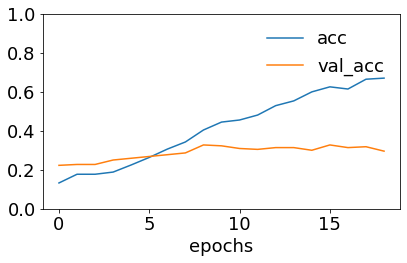

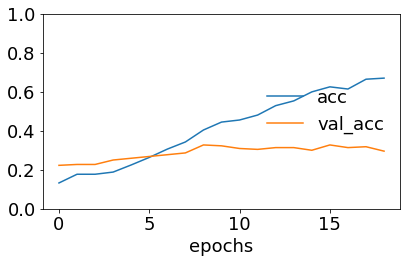

365/365 [==============================] - 1s 3ms/sample - loss: 1.6513 - accuracy: 0.3918 - mae: 0.1949
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_36 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_35[0][0]                   
__________________________________________________________________________________________________
layer_normalization_17 (LayerNo (None, 500)          1000        input_36[0][0]                   
___________________________________________________________________________________________

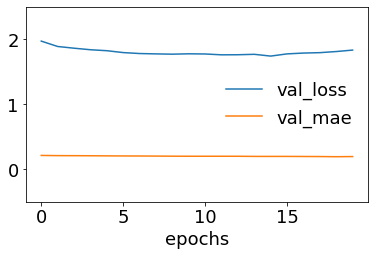

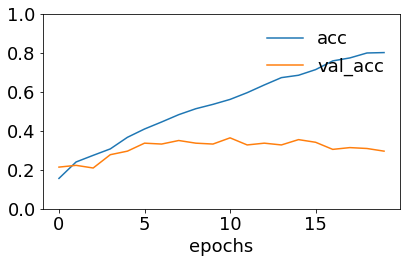

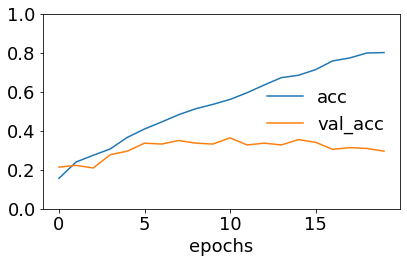

365/365 [==============================] - 1s 2ms/sample - loss: 1.5461 - accuracy: 0.4356 - mae: 0.1865
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_38 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_37[0][0]                   
__________________________________________________________________________________________________
layer_normalization_18 (LayerNo (None, 500)          1000        input_38[0][0]                   
___________________________________________________________________________________________

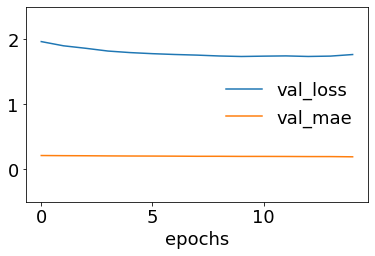

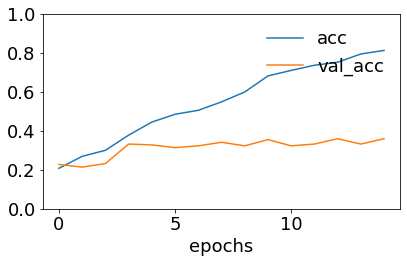

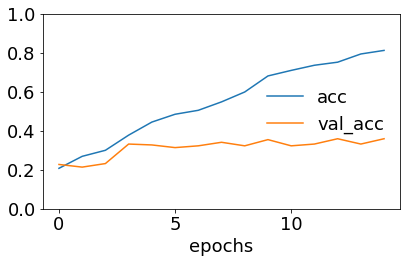

365/365 [==============================] - 0s 642us/sample - loss: 1.5084 - accuracy: 0.4712 - mae: 0.1836
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_19"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_40 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_39[0][0]                   
__________________________________________________________________________________________________
layer_normalization_19 (LayerNo (None, 500)          1000        input_40[0][0]                   
___________________________________________________________________________________________

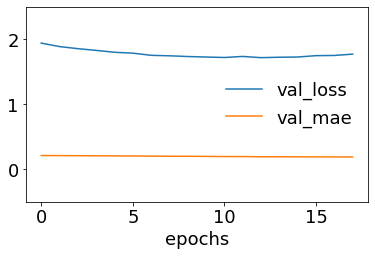

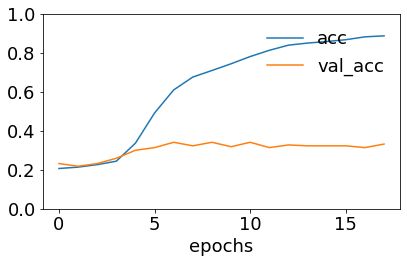

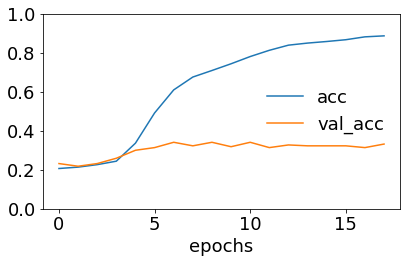

365/365 [==============================] - 0s 604us/sample - loss: 1.4148 - accuracy: 0.5863 - mae: 0.1745
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_42 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_59 (Embedding)        (None, 432, 300)     6346500     input_41[0][0]                   
__________________________________________________________________________________________________
layer_normalization_20 (LayerNo (None, 500)          1000        input_42[0][0]                   
___________________________________________________________________________________________

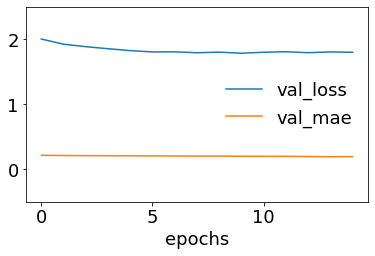

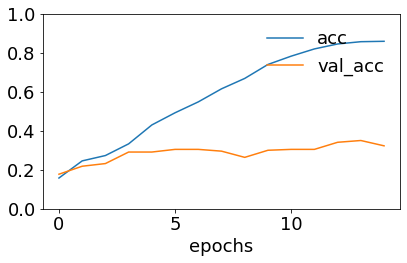

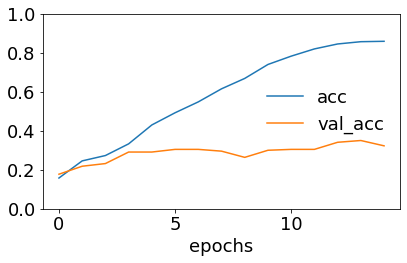

365/365 [==============================] - 0s 599us/sample - loss: 1.4337 - accuracy: 0.5479 - mae: 0.1809


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_3 = bilstm_tf(texts_tf3, data_3, embedding_matrix_3, num3)  # 80% data augmentation

Building Bi-LSTM model...
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_43 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_44 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_43[0][0]                   
__________________________________________________________________________________________________
layer_normalization_21 (LayerNo (None, 500)          1000        input_44[0][0]                   
___________________________________________________________________________________________

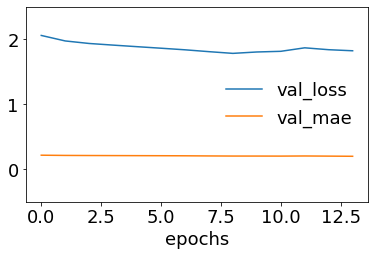

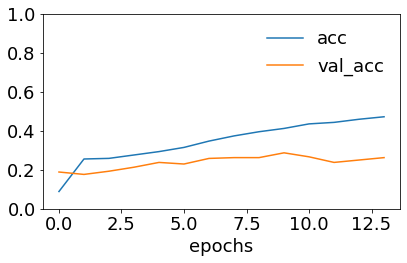

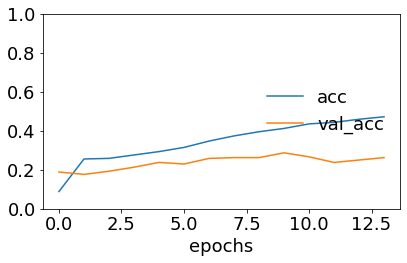

406/406 [==============================] - 2s 4ms/sample - loss: 1.8274 - accuracy: 0.2635 - mae: 0.2048
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_22"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_45 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_46 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_45[0][0]                   
__________________________________________________________________________________________________
layer_normalization_22 (LayerNo (None, 500)          1000        input_46[0][0]                   
___________________________________________________________________________________________

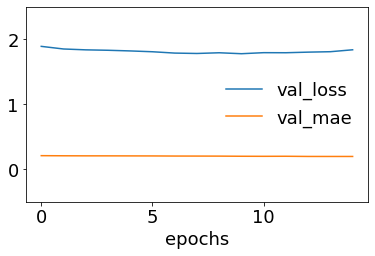

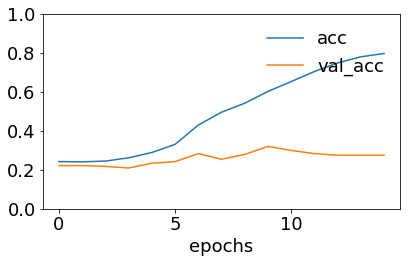

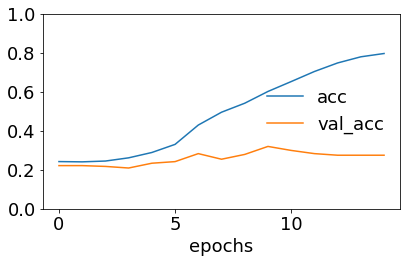

406/406 [==============================] - 0s 626us/sample - loss: 1.7170 - accuracy: 0.3079 - mae: 0.1970
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_47 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_48 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_47[0][0]                   
__________________________________________________________________________________________________
layer_normalization_23 (LayerNo (None, 500)          1000        input_48[0][0]                   
___________________________________________________________________________________________

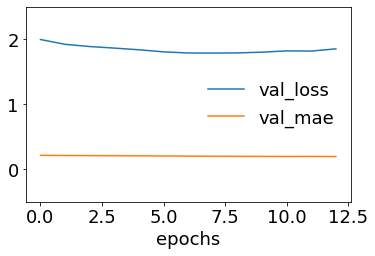

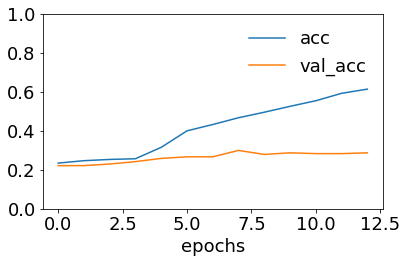

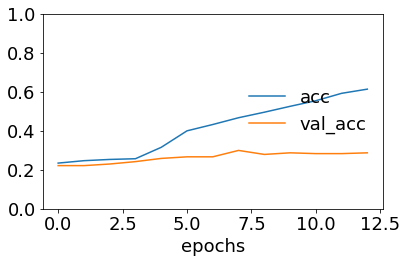

406/406 [==============================] - 0s 609us/sample - loss: 1.6436 - accuracy: 0.3867 - mae: 0.1931
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_24"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_49 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_50 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_49[0][0]                   
__________________________________________________________________________________________________
layer_normalization_24 (LayerNo (None, 500)          1000        input_50[0][0]                   
___________________________________________________________________________________________

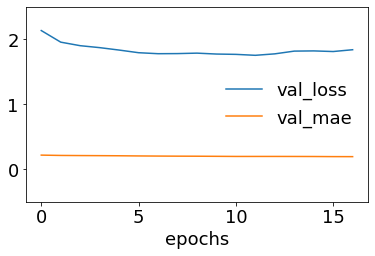

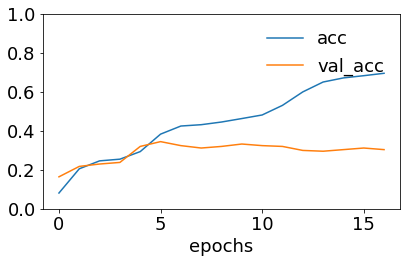

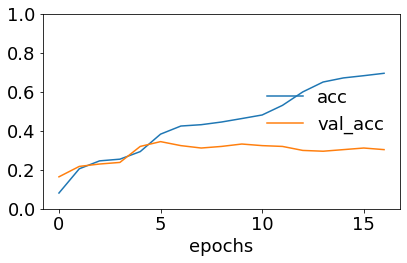

406/406 [==============================] - 0s 583us/sample - loss: 1.5631 - accuracy: 0.4113 - mae: 0.1860
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_51 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_52 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_51[0][0]                   
__________________________________________________________________________________________________
layer_normalization_25 (LayerNo (None, 500)          1000        input_52[0][0]                   
___________________________________________________________________________________________

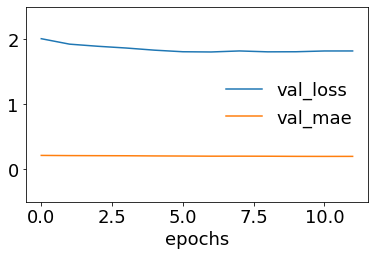

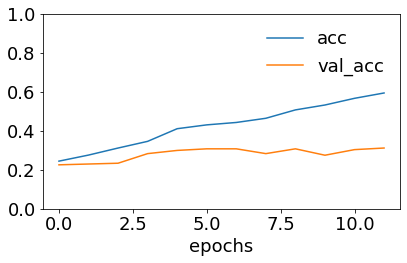

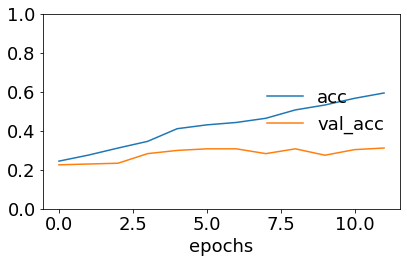

406/406 [==============================] - 0s 608us/sample - loss: 1.6638 - accuracy: 0.4039 - mae: 0.1922
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_53 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_54 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_53[0][0]                   
__________________________________________________________________________________________________
layer_normalization_26 (LayerNo (None, 500)          1000        input_54[0][0]                   
___________________________________________________________________________________________

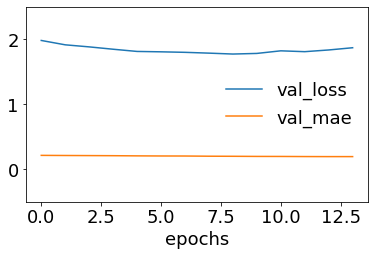

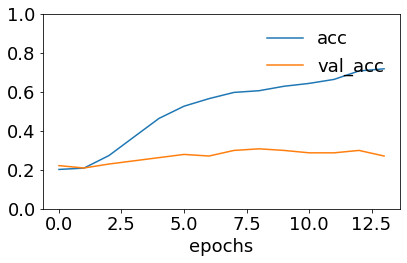

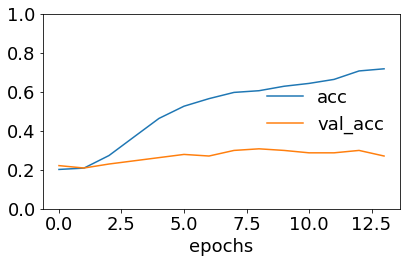

405/405 [==============================] - 1s 2ms/sample - loss: 1.5413 - accuracy: 0.4642 - mae: 0.1866
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_55 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_56 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_60 (Embedding)        (None, 432, 300)     6667200     input_55[0][0]                   
__________________________________________________________________________________________________
layer_normalization_27 (LayerNo (None, 500)          1000        input_56[0][0]                   
___________________________________________________________________________________________

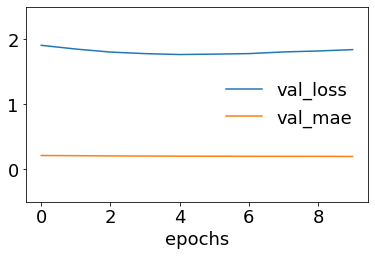

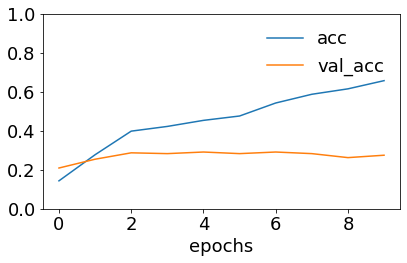

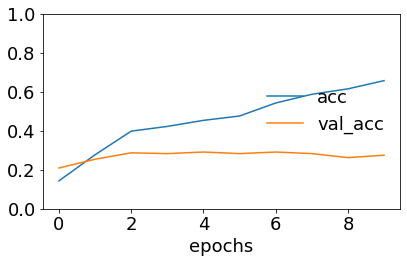

405/405 [==============================] - 1s 2ms/sample - loss: 1.5378 - accuracy: 0.4296 - mae: 0.1893


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_4 = bilstm_tf(texts_tf4, data_4, embedding_matrix_4, num4)  # 100% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_28"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_57 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_58 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_57[0][0]                   
__________________________________________________________________________________________________
layer_normalization_28 (LayerNo (None, 500)          1000        input_58[0][0]                   
___________________________________________________________________________________________

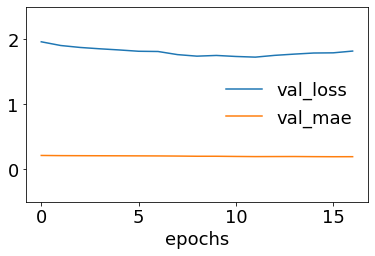

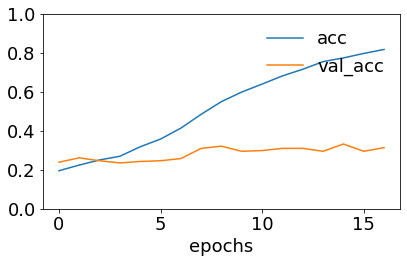

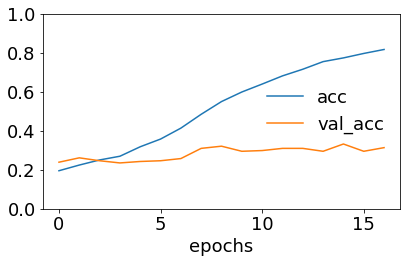

447/447 [==============================] - 0s 597us/sample - loss: 1.7992 - accuracy: 0.3065 - mae: 0.1970
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_29"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_59 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_60 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_59[0][0]                   
__________________________________________________________________________________________________
layer_normalization_29 (LayerNo (None, 500)          1000        input_60[0][0]                   
___________________________________________________________________________________________

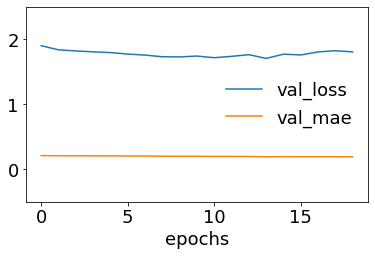

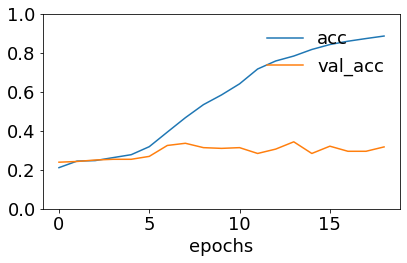

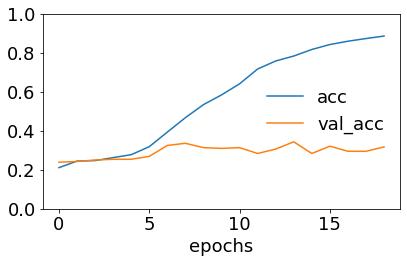

447/447 [==============================] - 0s 672us/sample - loss: 1.5971 - accuracy: 0.4116 - mae: 0.1836
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_30"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_61 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_62 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_61[0][0]                   
__________________________________________________________________________________________________
layer_normalization_30 (LayerNo (None, 500)          1000        input_62[0][0]                   
___________________________________________________________________________________________

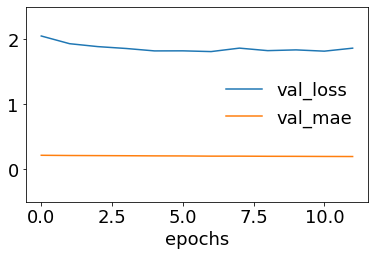

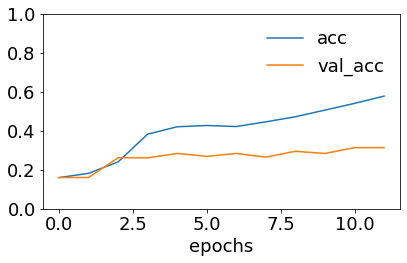

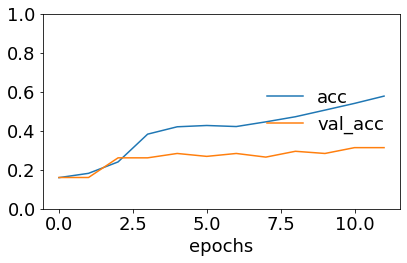

446/446 [==============================] - 1s 2ms/sample - loss: 1.6261 - accuracy: 0.3901 - mae: 0.1930
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_63 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_64 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_63[0][0]                   
__________________________________________________________________________________________________
layer_normalization_31 (LayerNo (None, 500)          1000        input_64[0][0]                   
___________________________________________________________________________________________

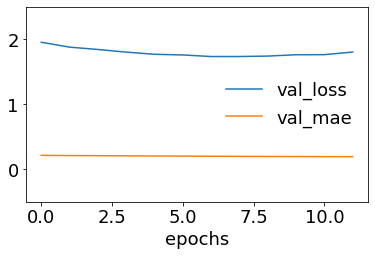

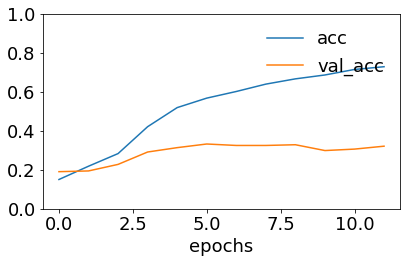

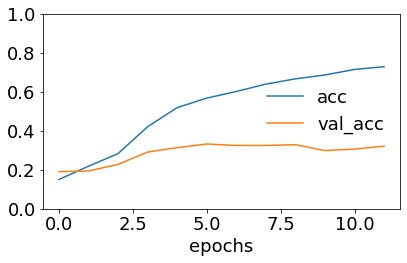

446/446 [==============================] - 3s 6ms/sample - loss: 1.5542 - accuracy: 0.4753 - mae: 0.1906
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_32"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_65 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_66 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_65[0][0]                   
__________________________________________________________________________________________________
layer_normalization_32 (LayerNo (None, 500)          1000        input_66[0][0]                   
___________________________________________________________________________________________

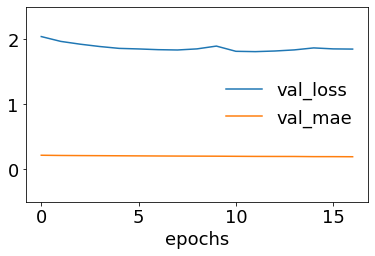

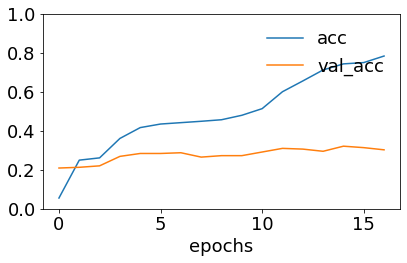

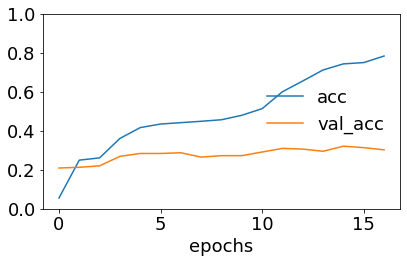

446/446 [==============================] - 0s 614us/sample - loss: 1.4231 - accuracy: 0.5045 - mae: 0.1780
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_68 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_67[0][0]                   
__________________________________________________________________________________________________
layer_normalization_33 (LayerNo (None, 500)          1000        input_68[0][0]                   
___________________________________________________________________________________________

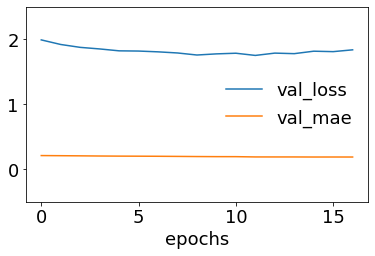

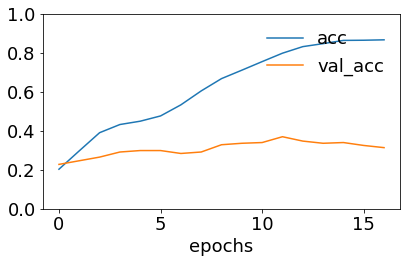

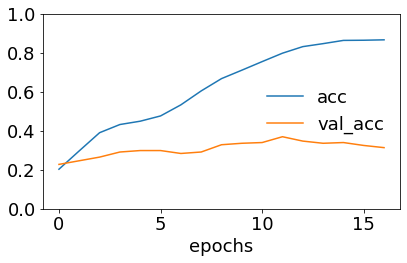

446/446 [==============================] - 0s 584us/sample - loss: 1.2975 - accuracy: 0.5695 - mae: 0.1600
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_34"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_69 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_70 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_61 (Embedding)        (None, 432, 300)     6873300     input_69[0][0]                   
__________________________________________________________________________________________________
layer_normalization_34 (LayerNo (None, 500)          1000        input_70[0][0]                   
___________________________________________________________________________________________

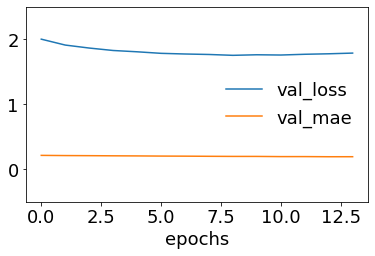

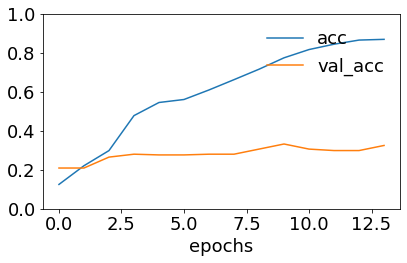

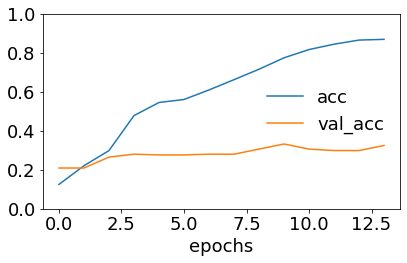

446/446 [==============================] - 0s 551us/sample - loss: 1.3746 - accuracy: 0.5852 - mae: 0.1774


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_5 = bilstm_tf(texts_tf5, data_5, embedding_matrix_5, num5)  # 120% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_71 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_72 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_71[0][0]                   
__________________________________________________________________________________________________
layer_normalization_35 (LayerNo (None, 500)          1000        input_72[0][0]                   
___________________________________________________________________________________________

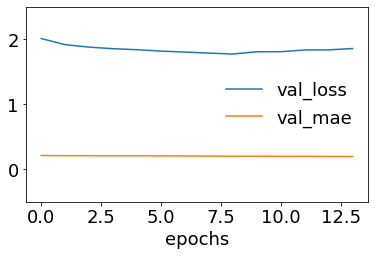

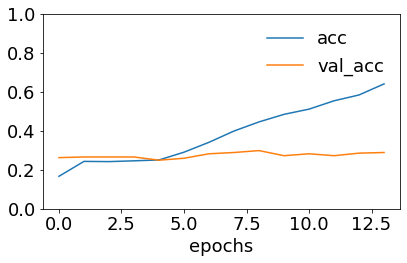

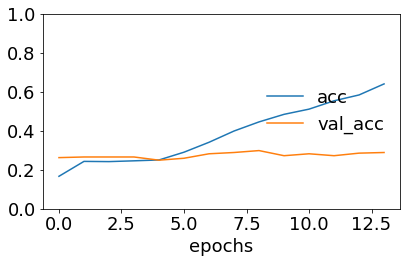

508/508 [==============================] - 0s 582us/sample - loss: 1.7557 - accuracy: 0.3248 - mae: 0.1999
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_36"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_73 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_74 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_73[0][0]                   
__________________________________________________________________________________________________
layer_normalization_36 (LayerNo (None, 500)          1000        input_74[0][0]                   
___________________________________________________________________________________________

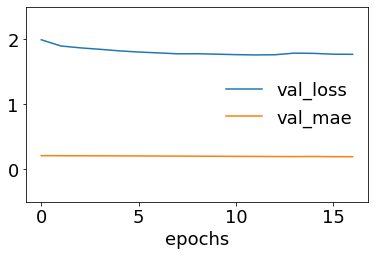

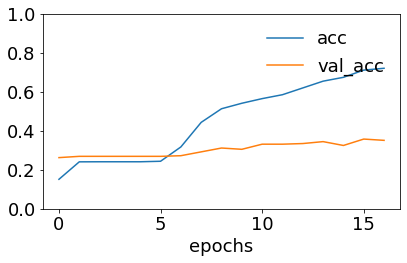

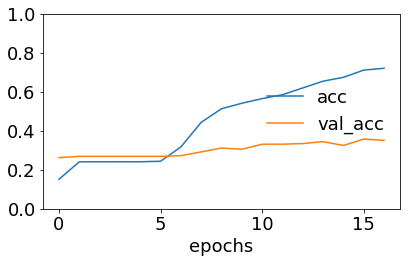

507/507 [==============================] - 1s 2ms/sample - loss: 1.6489 - accuracy: 0.3807 - mae: 0.1949
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_37"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_75 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_76 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_75[0][0]                   
__________________________________________________________________________________________________
layer_normalization_37 (LayerNo (None, 500)          1000        input_76[0][0]                   
___________________________________________________________________________________________

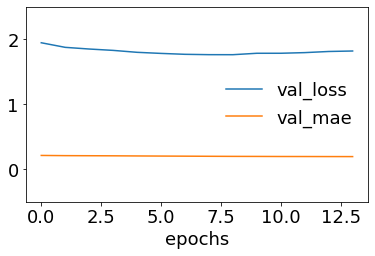

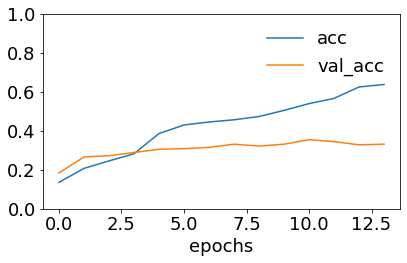

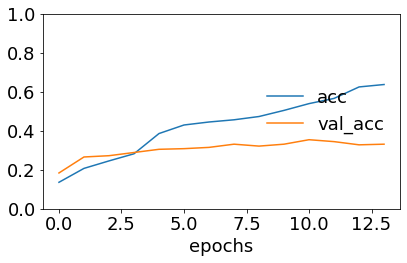

507/507 [==============================] - 1s 2ms/sample - loss: 1.5770 - accuracy: 0.4004 - mae: 0.1904
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_38"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_77 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_78 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_77[0][0]                   
__________________________________________________________________________________________________
layer_normalization_38 (LayerNo (None, 500)          1000        input_78[0][0]                   
___________________________________________________________________________________________

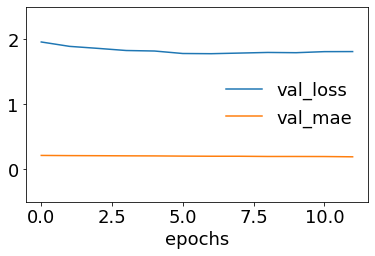

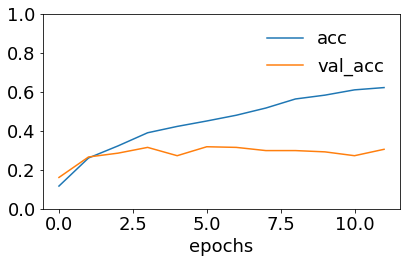

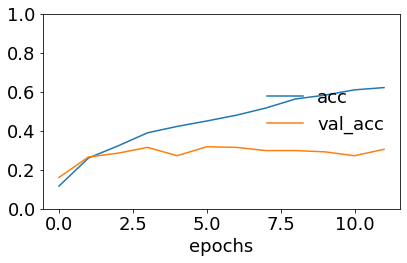

507/507 [==============================] - 0s 603us/sample - loss: 1.6013 - accuracy: 0.4142 - mae: 0.1917
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_39"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_79 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_80 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_79[0][0]                   
__________________________________________________________________________________________________
layer_normalization_39 (LayerNo (None, 500)          1000        input_80[0][0]                   
___________________________________________________________________________________________

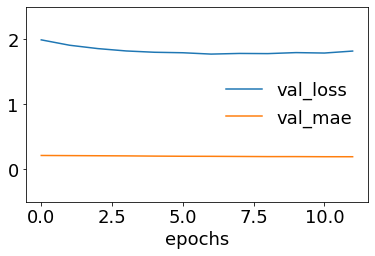

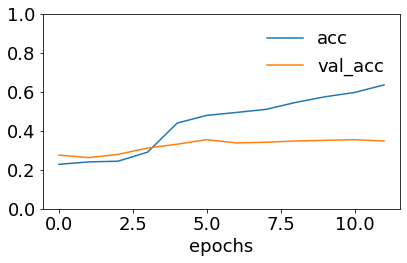

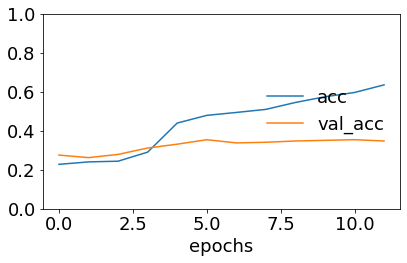

507/507 [==============================] - 0s 663us/sample - loss: 1.5043 - accuracy: 0.4339 - mae: 0.1870
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_40"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_81 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_82 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_81[0][0]                   
__________________________________________________________________________________________________
layer_normalization_40 (LayerNo (None, 500)          1000        input_82[0][0]                   
___________________________________________________________________________________________

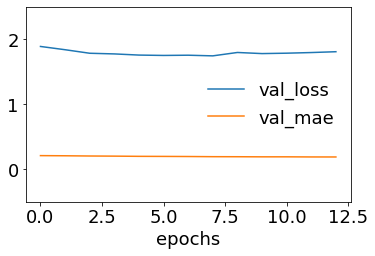

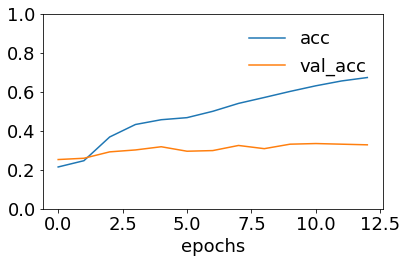

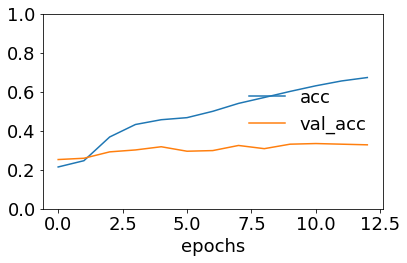

507/507 [==============================] - 0s 605us/sample - loss: 1.4137 - accuracy: 0.4753 - mae: 0.1781
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_41"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_83 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_84 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_62 (Embedding)        (None, 432, 300)     7126800     input_83[0][0]                   
__________________________________________________________________________________________________
layer_normalization_41 (LayerNo (None, 500)          1000        input_84[0][0]                   
___________________________________________________________________________________________

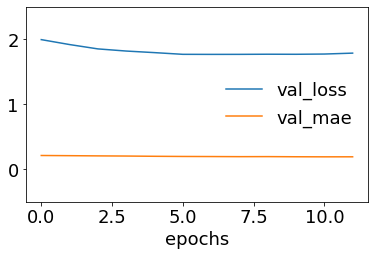

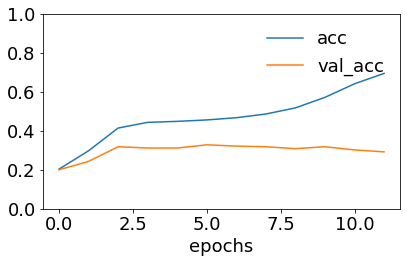

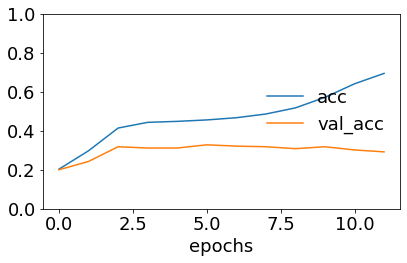

507/507 [==============================] - 0s 602us/sample - loss: 1.4361 - accuracy: 0.4477 - mae: 0.1811


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_6 = bilstm_tf(texts_tf6, data_6, embedding_matrix_6, num6)  # 150% data augmentation

Building Bi-LSTM model...
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_42"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_85 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_86 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_85[0][0]                   
__________________________________________________________________________________________________
layer_normalization_42 (LayerNo (None, 500)          1000        input_86[0][0]                   
___________________________________________________________________________________________

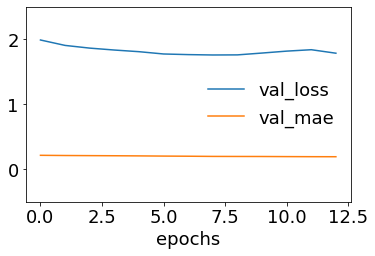

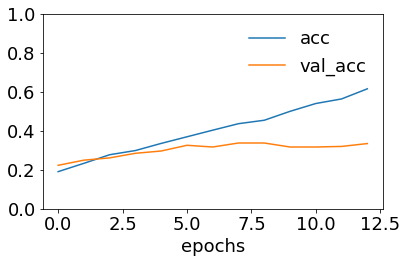

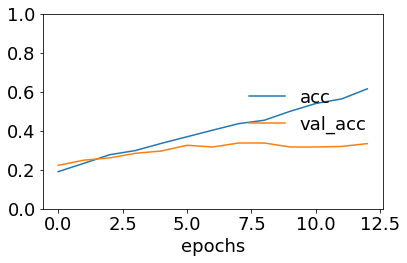

568/568 [==============================] - 1s 2ms/sample - loss: 1.7550 - accuracy: 0.3081 - mae: 0.1987
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_43"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_87 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_88 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_87[0][0]                   
__________________________________________________________________________________________________
layer_normalization_43 (LayerNo (None, 500)          1000        input_88[0][0]                   
___________________________________________________________________________________________

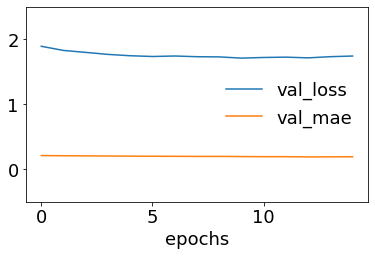

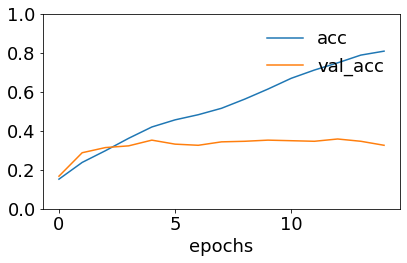

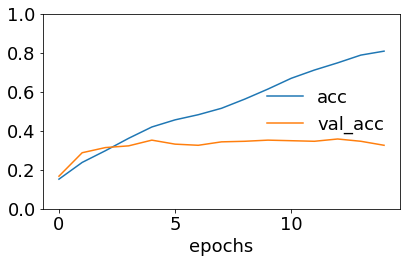

568/568 [==============================] - 0s 649us/sample - loss: 1.5880 - accuracy: 0.4014 - mae: 0.1889
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_44"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_89 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_90 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_89[0][0]                   
__________________________________________________________________________________________________
layer_normalization_44 (LayerNo (None, 500)          1000        input_90[0][0]                   
___________________________________________________________________________________________

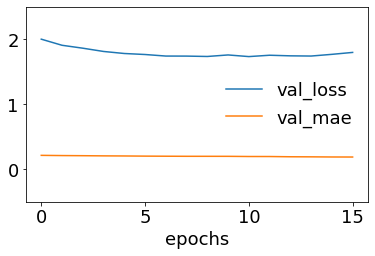

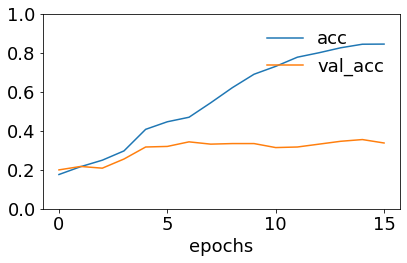

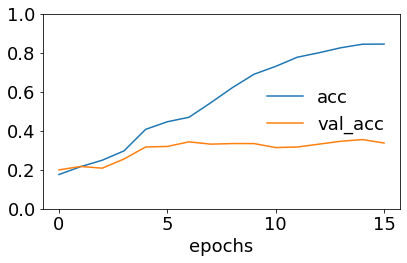

568/568 [==============================] - 0s 606us/sample - loss: 1.5340 - accuracy: 0.4630 - mae: 0.1868
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_45"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_91 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_92 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_91[0][0]                   
__________________________________________________________________________________________________
layer_normalization_45 (LayerNo (None, 500)          1000        input_92[0][0]                   
___________________________________________________________________________________________

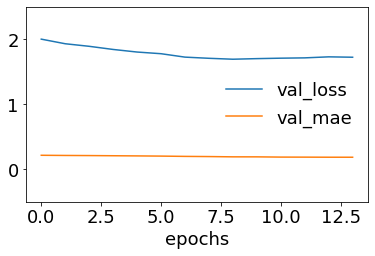

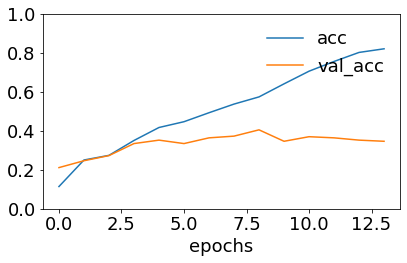

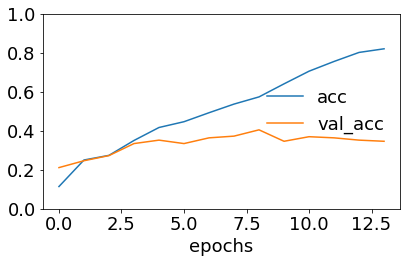

568/568 [==============================] - 0s 584us/sample - loss: 1.4730 - accuracy: 0.4683 - mae: 0.1805
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_46"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_93 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_94 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_93[0][0]                   
__________________________________________________________________________________________________
layer_normalization_46 (LayerNo (None, 500)          1000        input_94[0][0]                   
___________________________________________________________________________________________

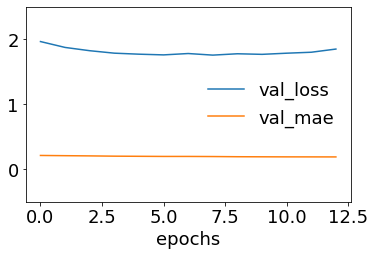

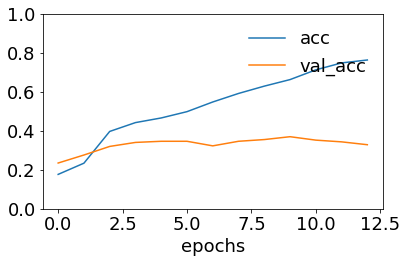

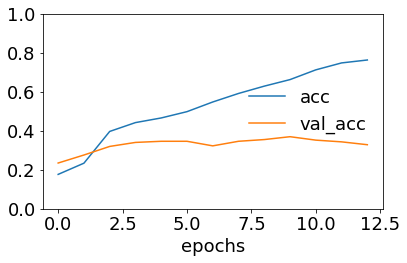

568/568 [==============================] - 0s 602us/sample - loss: 1.4360 - accuracy: 0.5070 - mae: 0.1805
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_47"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_95 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_96 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_95[0][0]                   
__________________________________________________________________________________________________
layer_normalization_47 (LayerNo (None, 500)          1000        input_96[0][0]                   
___________________________________________________________________________________________

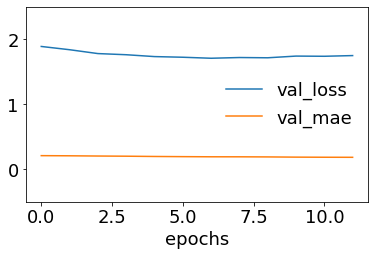

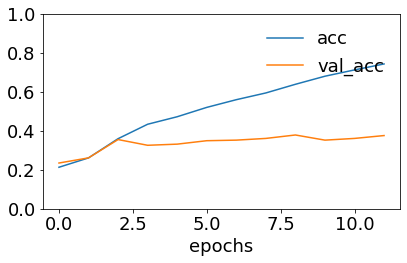

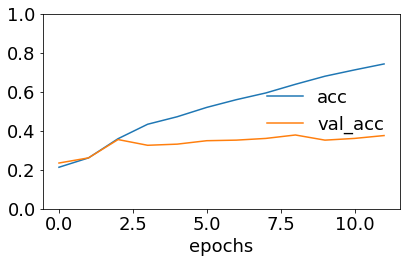

568/568 [==============================] - 0s 649us/sample - loss: 1.4240 - accuracy: 0.4789 - mae: 0.1779
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_48"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_97 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_98 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_63 (Embedding)        (None, 432, 300)     7315800     input_97[0][0]                   
__________________________________________________________________________________________________
layer_normalization_48 (LayerNo (None, 500)          1000        input_98[0][0]                   
___________________________________________________________________________________________

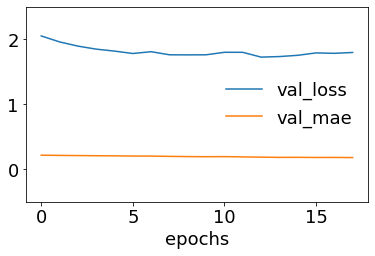

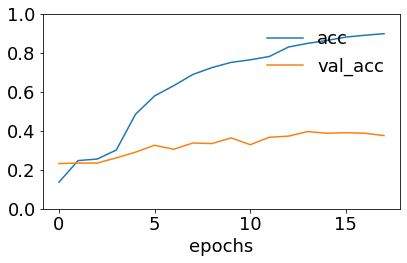

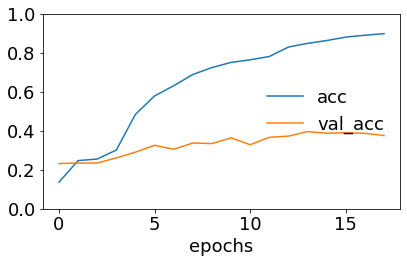

568/568 [==============================] - 0s 595us/sample - loss: 1.3646 - accuracy: 0.5810 - mae: 0.1643


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_7 = bilstm_tf(texts_tf7, data_7, embedding_matrix_7, num7)  # 180% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_49"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_99 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_100 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_99[0][0]                   
__________________________________________________________________________________________________
layer_normalization_49 (LayerNo (None, 500)          1000        input_100[0][0]                  
___________________________________________________________________________________________

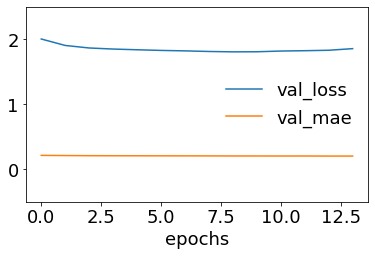

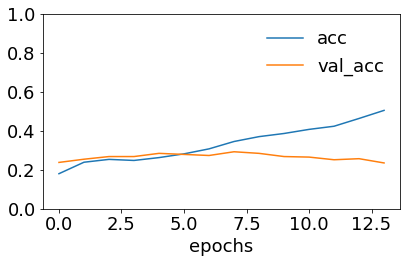

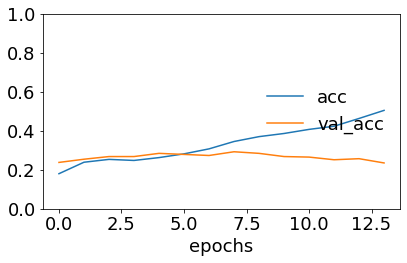

609/609 [==============================] - 0s 623us/sample - loss: 1.8066 - accuracy: 0.2578 - mae: 0.2051
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_101 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_102 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_101[0][0]                  
__________________________________________________________________________________________________
layer_normalization_50 (LayerNo (None, 500)          1000        input_102[0][0]                  
___________________________________________________________________________________________

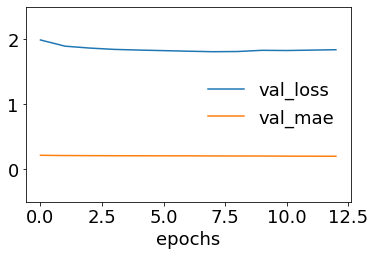

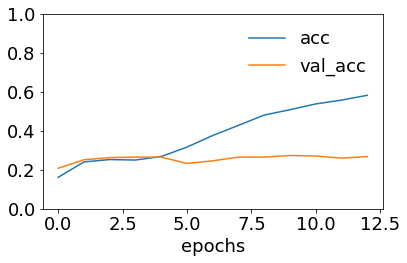

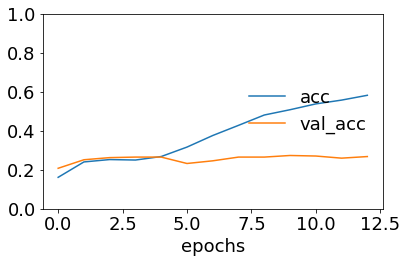

609/609 [==============================] - 0s 645us/sample - loss: 1.7867 - accuracy: 0.3235 - mae: 0.2040
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_51"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_103 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_104 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_103[0][0]                  
__________________________________________________________________________________________________
layer_normalization_51 (LayerNo (None, 500)          1000        input_104[0][0]                  
___________________________________________________________________________________________

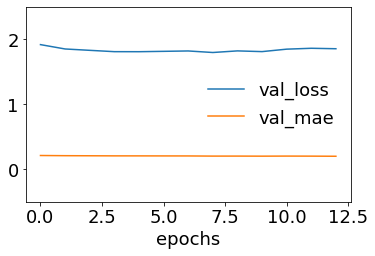

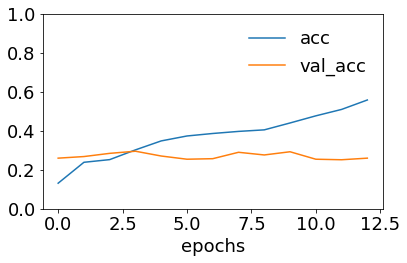

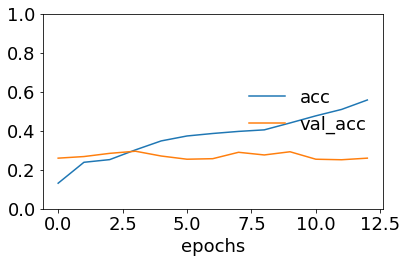

609/609 [==============================] - 0s 647us/sample - loss: 1.7210 - accuracy: 0.3317 - mae: 0.1988
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_52"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_105 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_106 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_105[0][0]                  
__________________________________________________________________________________________________
layer_normalization_52 (LayerNo (None, 500)          1000        input_106[0][0]                  
___________________________________________________________________________________________

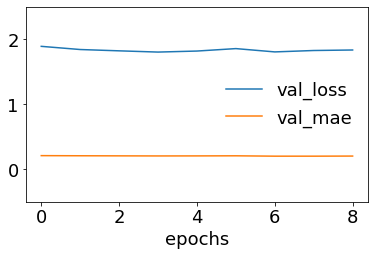

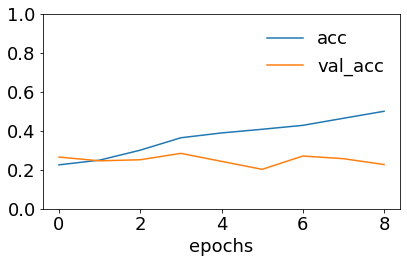

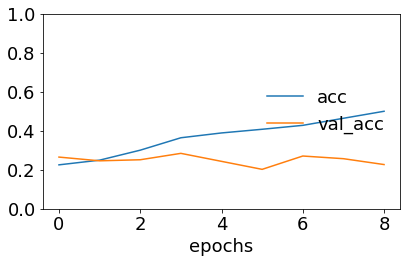

609/609 [==============================] - 0s 672us/sample - loss: 1.7430 - accuracy: 0.3465 - mae: 0.2023
9.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_53"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_107 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_108 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_107[0][0]                  
__________________________________________________________________________________________________
layer_normalization_53 (LayerNo (None, 500)          1000        input_108[0][0]                  
___________________________________________________________________________________________

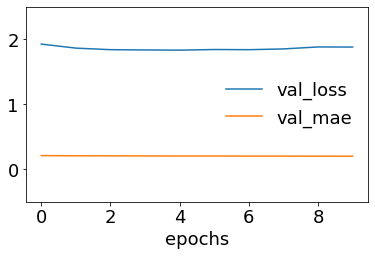

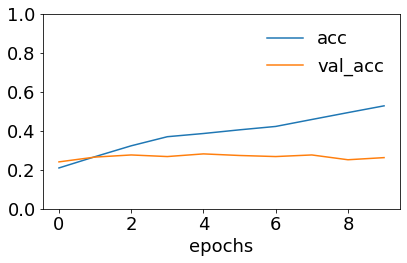

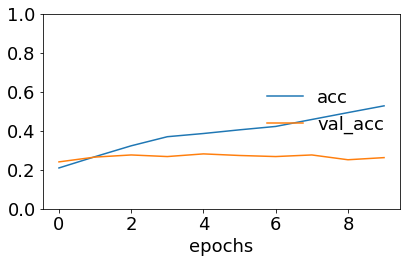

608/608 [==============================] - 1s 2ms/sample - loss: 1.7053 - accuracy: 0.3536 - mae: 0.1976
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_54"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_109 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_110 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_109[0][0]                  
__________________________________________________________________________________________________
layer_normalization_54 (LayerNo (None, 500)          1000        input_110[0][0]                  
___________________________________________________________________________________________

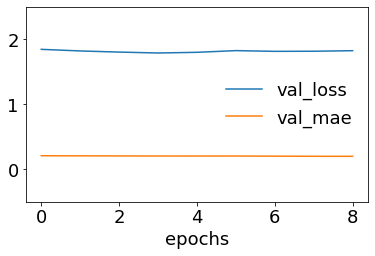

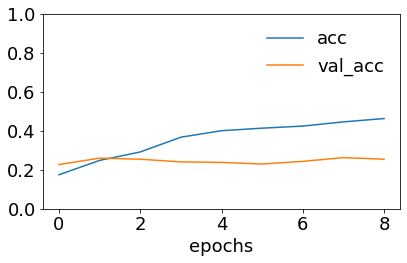

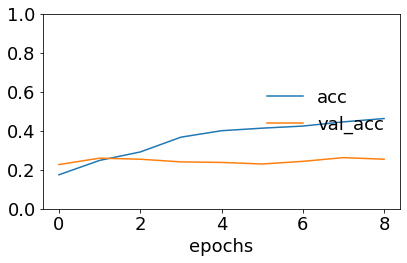

608/608 [==============================] - 1s 2ms/sample - loss: 1.6971 - accuracy: 0.3602 - mae: 0.1998
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: "model_55"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_111 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_112 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_64 (Embedding)        (None, 432, 300)     6673500     input_111[0][0]                  
__________________________________________________________________________________________________
layer_normalization_55 (LayerNo (None, 500)          1000        input_112[0][0]                  
___________________________________________________________________________________________

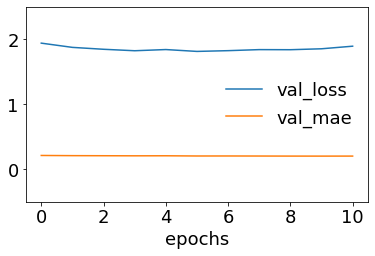

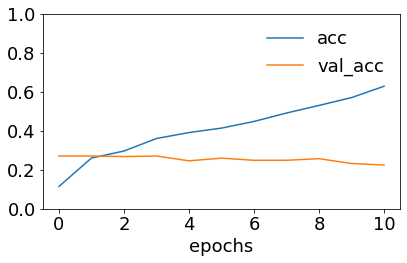

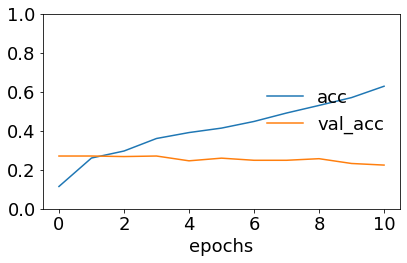

608/608 [==============================] - 1s 2ms/sample - loss: 1.6539 - accuracy: 0.3980 - mae: 0.1965


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_bilstm_tf_8 = bilstm_tf(texts_tf8, data_8, embedding_matrix_8, num8)  # 200% data augmentation

In [0]:
print('20% augmentation')
print(scores_bilstm_tf_1.mean())
print('\n50% augmentation')
print(scores_bilstm_tf_2.mean())
print('\n80% augmentation')
print(scores_bilstm_tf_3.mean())
print('\n100% augmentation')
print(scores_bilstm_tf_4.mean())
print('\n120% augmentation')
print(scores_bilstm_tf_5.mean())
print('\n150% augmentation')
print(scores_bilstm_tf_6.mean())
print('\n180% augmentation')
print(scores_bilstm_tf_7.mean())
print('\n200% augmentation')
print(scores_bilstm_tf_8.mean())

20% augmentation
accuracy             0.373300
precision            0.276836
recall               0.373300
f1                   0.272747
cohen_kappa_score    0.191252
auc                  0.691045
dtype: float64

50% augmentation
accuracy             0.438612
precision            0.413681
recall               0.438612
f1                   0.364525
cohen_kappa_score    0.284174
auc                  0.730296
dtype: float64

80% augmentation
accuracy             0.440593
precision            0.393542
recall               0.440593
f1                   0.388422
cohen_kappa_score    0.296827
auc                  0.747118
dtype: float64

100% augmentation
accuracy             0.381032
precision            0.283889
recall               0.381032
f1                   0.282331
cohen_kappa_score    0.210723
auc                  0.706974
dtype: float64

120% augmentation
accuracy             0.463255
precision            0.391416
recall               0.463255
f1                   0.395587
cohen_kap

#### 1D CNN + Bi-LSTM + TF-IDF

In [0]:
def bilstm_tf_cnn(texts_tf, data_cleaned, embedding_matrix, num_words):
  # some configuration
  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7


  print('Building Bi-LSTM model...')
  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 9)
  scores_bilstm_tf_cnn = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score', 'auc'])
  labels = data_cleaned['positivity'].values
  METRICS = ['accuracy',
             'mae']

  embedding_layer = tf.keras.layers.Embedding(
    num_words,
    EMBEDDING_DIM,
    weights=[embedding_matrix],
    input_length=MAX_SEQUENCE_LENGTH,
    trainable=True
  )


  for train, test in kfold.split(texts_tf, labels):

    x_train = texts_tf[train]
    x_test = texts_tf[test]
    x_train_1 = x_train[:, : MAX_SEQUENCE_LENGTH] # training set for word embeddings using GloVe
    x_train_2 = x_train[:, MAX_SEQUENCE_LENGTH:] # training set for tfidf feature
    x_test_1 = x_test[:, :MAX_SEQUENCE_LENGTH] # testing set for word embedding using GloVe
    x_test_2 = x_test[:, MAX_SEQUENCE_LENGTH:] # testing set for tfidf feature
    #y_train = labels[train]
    #y_test = labels[test]

    y_train = pd.get_dummies(labels[train])
    y_test = pd.get_dummies(labels[test])

  # using list of zeros to represents missing classes
    m = sum(y_train.columns)-sum(y_test.columns)
    print(m)
    if m > 0:
      n = int(m)-2
      y_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      y_train.insert(n, abs(m), 0)

    input_1 = tf.keras.Input(shape=(MAX_SEQUENCE_LENGTH,))
    x = embedding_layer(input_1)
    x = tf.keras.layers.Conv1D(filters = EMBEDDING_DIM, kernel_size = 3, padding='valid', activation='relu')(x)
    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32))(x)   # LSTM layer on embedding layer

    input_2 = tf.keras.Input(shape=(500,))
    tf_vec = tf.keras.layers.LayerNormalization()(input_2)  # tfidf layer
    tf_vec = tf.keras.layers.Dense(32, activation = 'relu')(tf_vec)
    concat_layer = tf.keras.layers.Concatenate()([x, tf_vec])  # concatenate LSTM and tfidf layer

    dense_layer = tf.keras.layers.Dense(16, activation='sigmoid')(concat_layer)
    output = tf.keras.layers.Dense(8, activation='softmax')(dense_layer)
    model = tf.keras.models.Model([input_1, input_2], output)

    
    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
    
    )


  # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)  # early stopping to avoid overfitting

    print('Training model...')
    r = model.fit(
      [x_train_1, x_train_2],
      y_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]
    )


    model.summary()

  # plot loss and mae
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    fig = plt.figure()
    ax = fig.add_subplot()
    lns1 = ax.plot(r.history['val_loss'], label='val_loss', color = 'tab:blue')
    ax2 = ax.twinx()
    lns2 = ax2.plot(r.history['val_mae'], label='val_mae', color = 'tab:red')

    lns = lns1+lns2
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='upper right', frameon=False)
    ax.set_ylim(1.5,2)
    ax.tick_params(axis='y', labelcolor='tab:blue')        
    ax2.set_ylim(0.17, 0.22)
    ax2.tick_params(axis='y', labelcolor='tab:red')     
    plt.show()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()


    predictions_bilstm_tf_cnn = model.predict([x_test_1, x_test_2])
    y_test = y_test.to_numpy()
    
    cnf_matrix = confusion_matrix(y_test.argmax(axis=1), predictions_bilstm_tf_cnn.argmax(axis=1))
    report = metrics.classification_report(y_test.argmax(axis=1), predictions_bilstm_tf_cnn.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)
    ck = cohen_kappa_score(y_test.argmax(axis=1), predictions_bilstm_tf_cnn.argmax(axis=1))

    #auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_bilstm_tf_cnn
    else:
      y_pred = np.delete(predictions_bilstm_tf_cnn, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')

    print(metrics.classification_report(y_test.argmax(axis=1), predictions_bilstm_tf_cnn.argmax(axis=1)))
    scores_bilstm_tf_cnn = scores_bilstm_tf_cnn.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                            'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                            'cohen_kappa_score': ck, 'auc': auc},  ignore_index=True)
    
    
  return scores_bilstm_tf_cnn, r

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "model_56"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_113 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_65 (Embedding)        (None, 432, 300)     4866600     input_113[0][0]                  
__________________________________________________________________________________________________
input_114 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 430, 300)     270300      embedding_65[0][0]      

<Figure size 432x288 with 0 Axes>

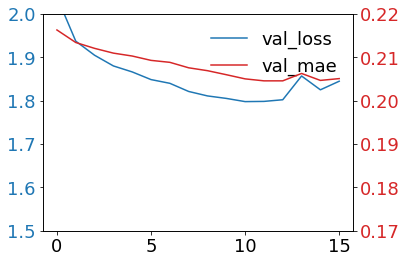

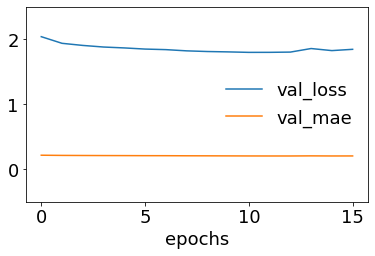

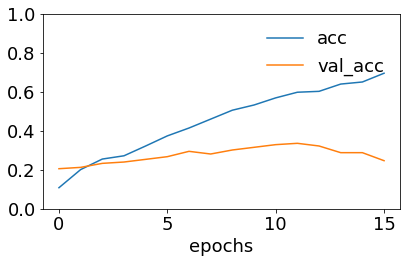

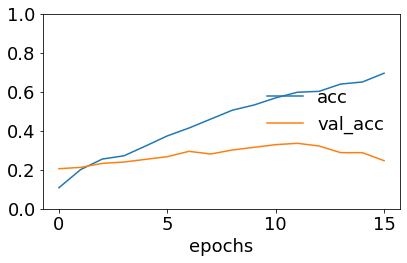

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.31      0.33      0.32        60
           2       0.25      0.56      0.35        43
           3       0.00      0.00      0.00        34
           4       0.25      0.03      0.05        37
           5       0.35      0.53      0.42        51
           6       0.00      0.00      0.00        13
           7       0.00      0.00      0.00         1

    accuracy                           0.30       244
   macro avg       0.14      0.18      0.14       244
weighted avg       0.23      0.30      0.24       244

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_57"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_115 (InputLayer)      

<Figure size 432x288 with 0 Axes>

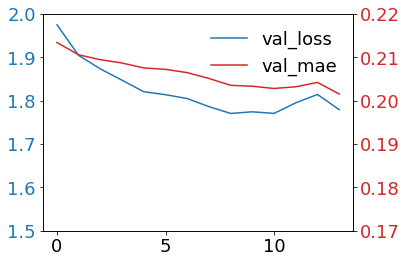

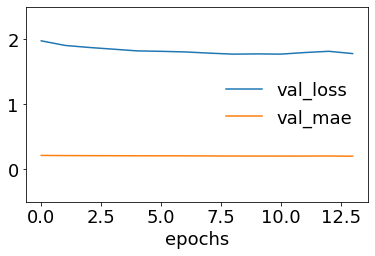

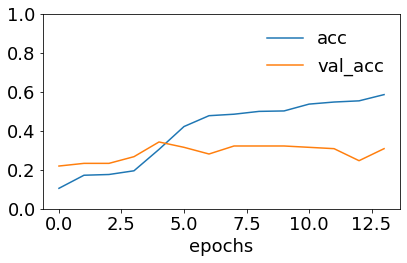

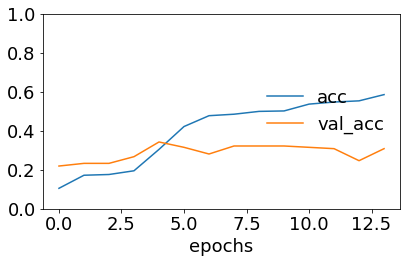

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.41      0.80      0.54        60
           2       0.30      0.23      0.26        43
           3       0.00      0.00      0.00        34
           4       0.00      0.00      0.00        37
           5       0.41      0.73      0.52        51
           6       0.00      0.00      0.00        12
           7       0.00      0.00      0.00         1

    accuracy                           0.39       244
   macro avg       0.14      0.22      0.17       244
weighted avg       0.24      0.39      0.29       244

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_58"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_117 (InputLayer)      

<Figure size 432x288 with 0 Axes>

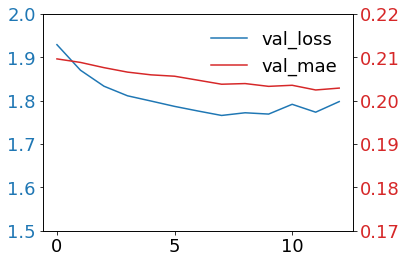

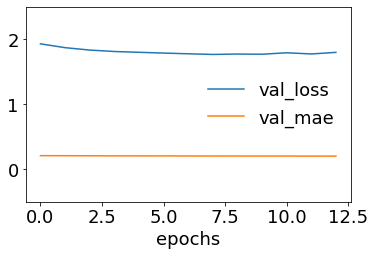

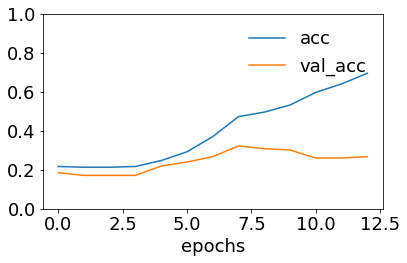

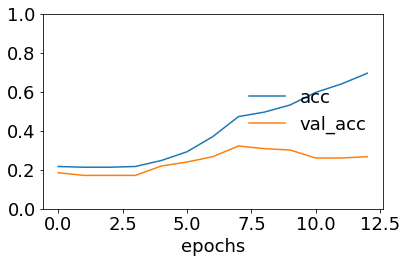

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.45      0.22      0.29        60
           2       0.29      0.70      0.41        44
           3       1.00      0.03      0.06        34
           4       0.00      0.00      0.00        37
           5       0.38      0.80      0.52        50
           6       0.00      0.00      0.00        12
           7       0.00      0.00      0.00         1

    accuracy                           0.35       244
   macro avg       0.27      0.22      0.16       244
weighted avg       0.38      0.35      0.26       244

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_59"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_119 (InputLayer)      

<Figure size 432x288 with 0 Axes>

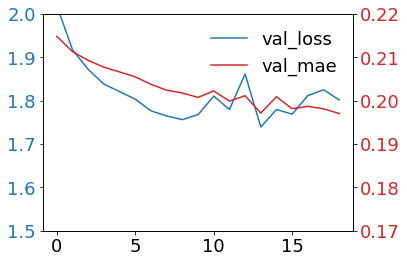

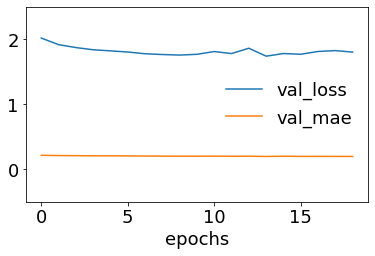

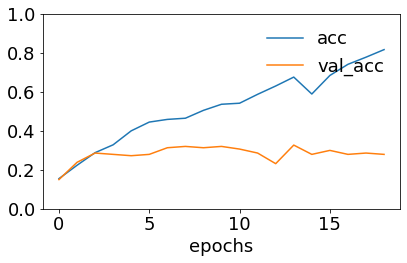

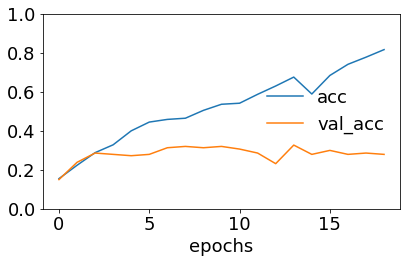

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.44      0.80      0.56        60
           2       0.37      0.50      0.43        44
           3       0.39      0.20      0.26        35
           4       0.00      0.00      0.00        36
           5       0.51      0.56      0.53        50
           6       0.00      0.00      0.00        12

    accuracy                           0.43       243
   macro avg       0.24      0.29      0.26       243
weighted avg       0.34      0.43      0.36       243

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_60"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_121 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

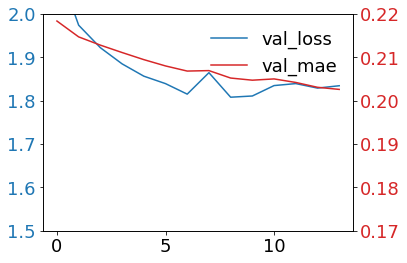

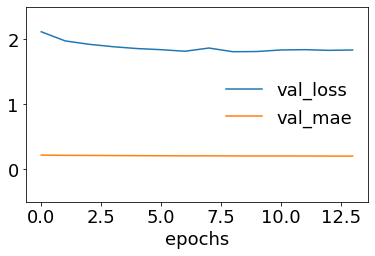

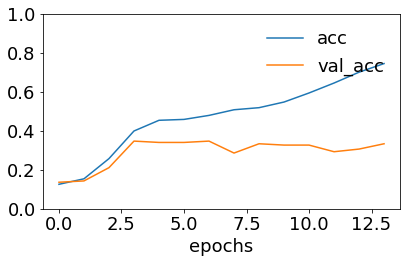

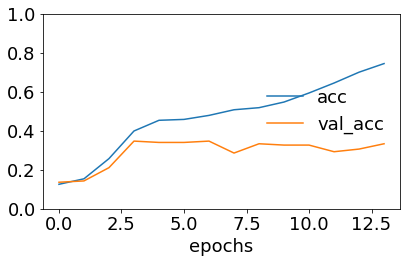

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.36      0.86      0.51        59
           2       0.50      0.02      0.04        44
           3       0.00      0.00      0.00        34
           4       0.56      0.28      0.37        36
           5       0.54      0.88      0.67        51
           6       0.00      0.00      0.00        13

    accuracy                           0.44       243
   macro avg       0.28      0.29      0.23       243
weighted avg       0.38      0.44      0.33       243

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_61"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_123 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

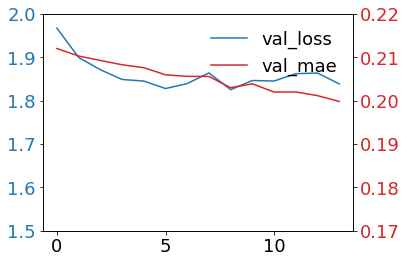

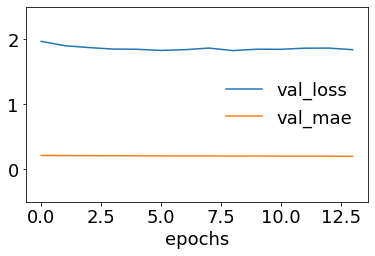

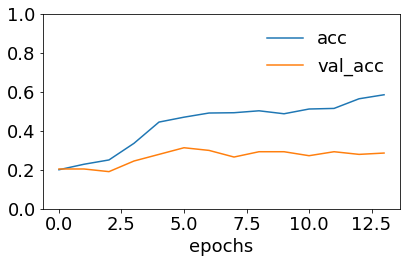

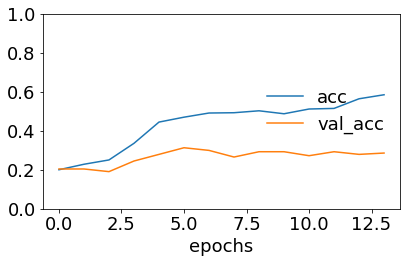

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.37      0.97      0.54        59
           2       0.57      0.18      0.28        44
           3       0.00      0.00      0.00        34
           4       0.00      0.00      0.00        36
           5       0.61      0.90      0.72        51
           6       0.00      0.00      0.00        13

    accuracy                           0.46       243
   macro avg       0.22      0.29      0.22       243
weighted avg       0.32      0.46      0.33       243

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_62"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_125 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

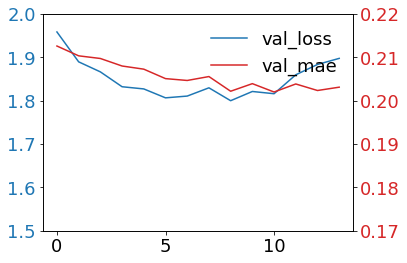

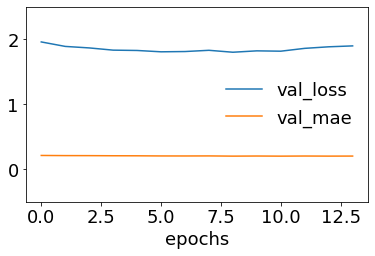

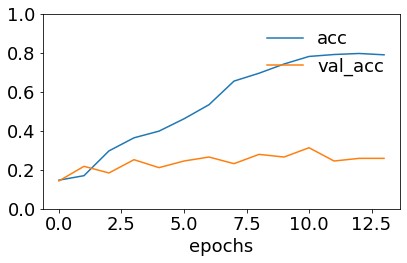

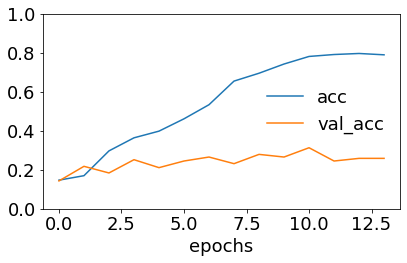

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.49      0.97      0.65        59
           2       0.54      0.57      0.56        44
           3       0.64      0.21      0.31        34
           4       0.31      0.36      0.33        36
           5       0.86      0.47      0.61        51
           6       0.00      0.00      0.00        13

    accuracy                           0.52       243
   macro avg       0.41      0.37      0.35       243
weighted avg       0.53      0.52      0.48       243



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_1,r1] = bilstm_tf_cnn(texts_tf1, data_1, embedding_matrix_1, num1)  # 20% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_63"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_127 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_66 (Embedding)        (None, 432, 300)     5818500     input_127[0][0]                  
__________________________________________________________________________________________________
input_128 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_7 (Conv1D)               (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

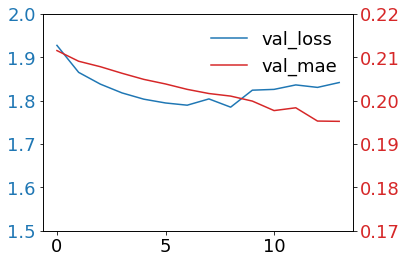

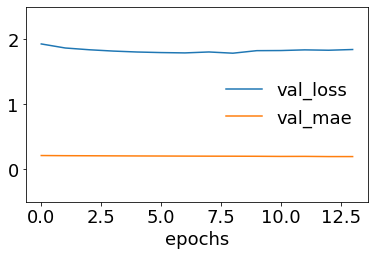

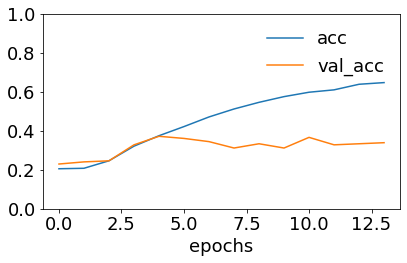

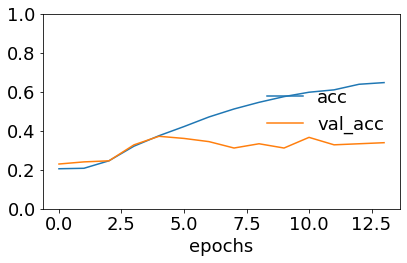

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.33      0.33      0.33        75
           2       0.22      0.45      0.30        55
           3       0.00      0.00      0.00        42
           4       0.00      0.00      0.00        45
           5       0.29      0.52      0.38        65
           6       0.00      0.00      0.00        15
           7       0.00      0.00      0.00         1

    accuracy                           0.28       305
   macro avg       0.11      0.16      0.13       305
weighted avg       0.18      0.28      0.22       305

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "model_64"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_129 (InputLayer)      

<Figure size 432x288 with 0 Axes>

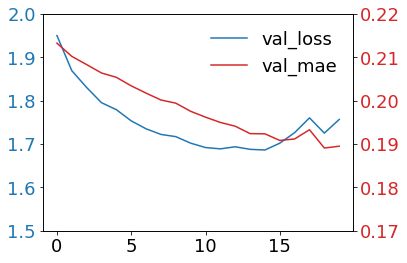

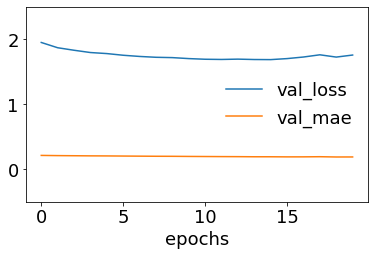

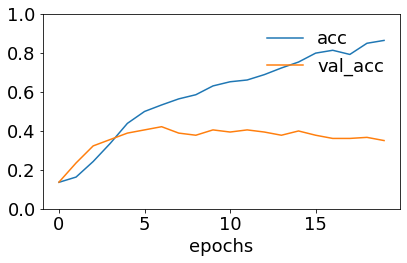

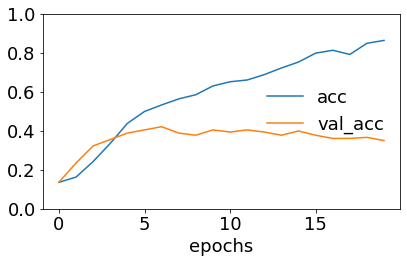

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.45      0.60      0.52        75
           2       0.38      0.43      0.40        56
           3       0.39      0.17      0.24        41
           4       0.17      0.04      0.07        46
           5       0.39      0.69      0.50        64
           6       0.00      0.00      0.00        15
           7       0.00      0.00      0.00         1

    accuracy                           0.40       305
   macro avg       0.22      0.24      0.22       305
weighted avg       0.34      0.40      0.35       305

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_65"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_131 (InputLayer)      

<Figure size 432x288 with 0 Axes>

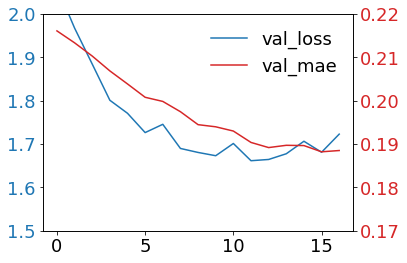

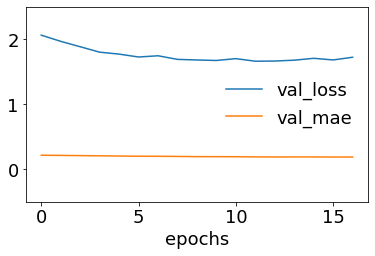

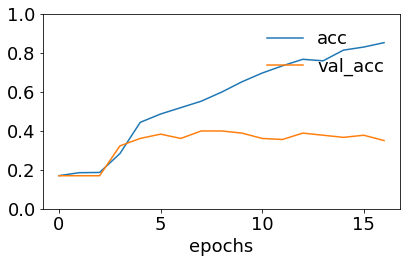

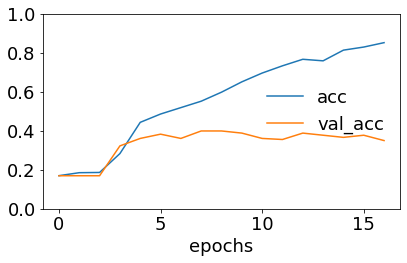

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.51      0.88      0.65        75
           2       0.33      0.18      0.23        56
           3       0.57      0.29      0.39        41
           4       0.38      0.33      0.35        46
           5       0.58      0.77      0.66        64
           6       0.00      0.00      0.00        15
           7       0.00      0.00      0.00         1

    accuracy                           0.50       304
   macro avg       0.30      0.31      0.28       304
weighted avg       0.44      0.50      0.45       304

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_66"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_133 (InputLayer)      

<Figure size 432x288 with 0 Axes>

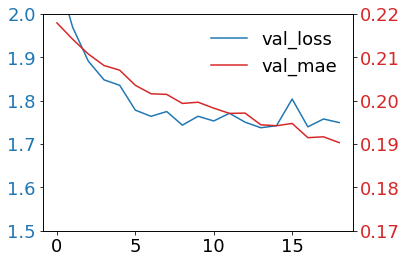

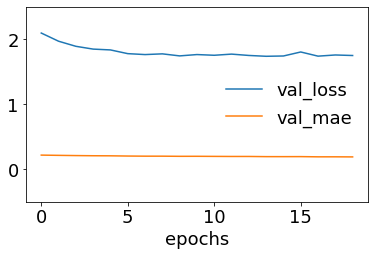

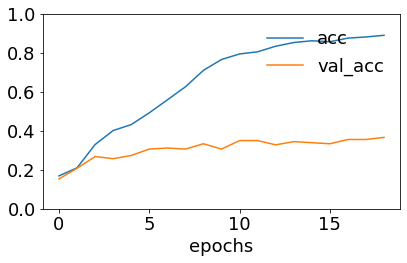

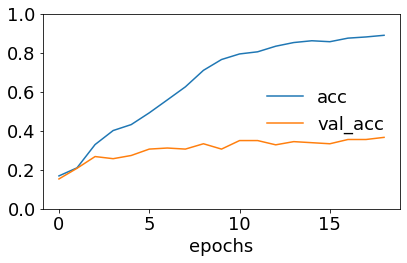

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.75      0.80      0.77        74
           2       0.45      0.62      0.53        56
           3       0.39      0.31      0.35        42
           4       0.31      0.33      0.32        46
           5       0.64      0.66      0.65        64
           6       0.00      0.00      0.00        15

    accuracy                           0.54       304
   macro avg       0.36      0.39      0.37       304
weighted avg       0.50      0.54      0.52       304

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_67"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_135 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

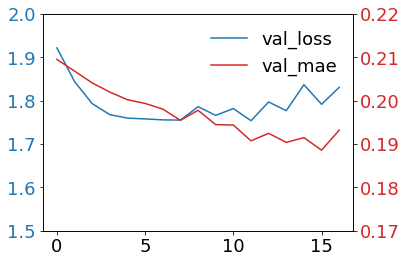

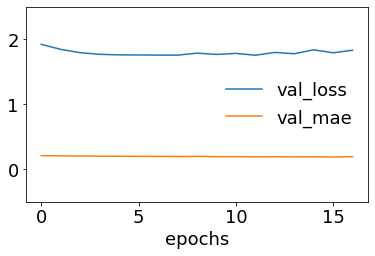

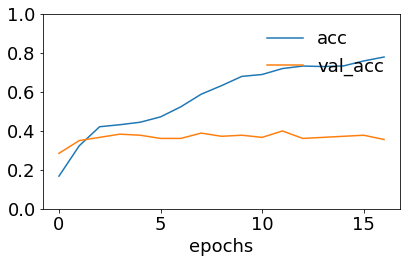

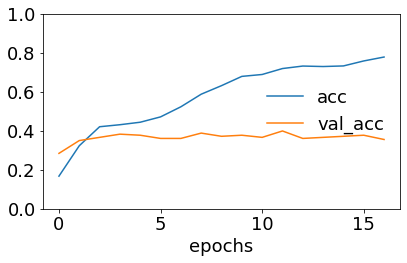

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.46      0.92      0.62        74
           2       1.00      0.04      0.07        56
           3       0.64      0.43      0.51        42
           4       0.48      0.46      0.47        46
           5       0.67      0.88      0.76        64
           6       0.00      0.00      0.00        15

    accuracy                           0.54       304
   macro avg       0.47      0.39      0.35       304
weighted avg       0.60      0.54      0.46       304

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "model_68"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_137 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

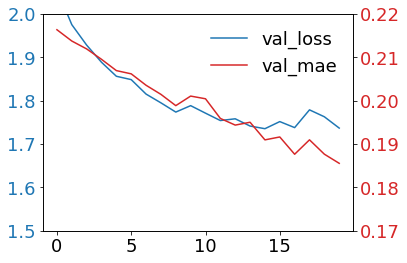

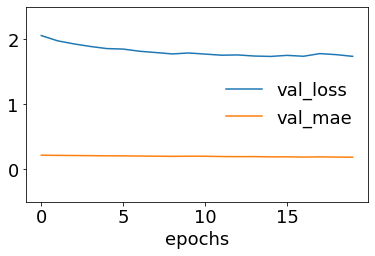

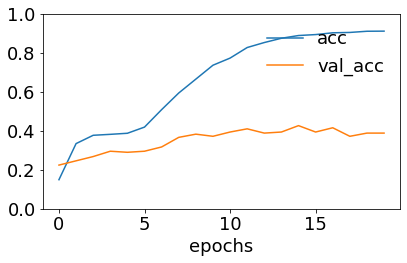

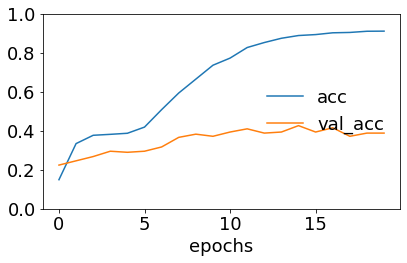

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.65      0.85      0.74        75
           2       0.75      0.77      0.76        56
           3       0.93      0.62      0.74        42
           4       0.64      0.56      0.60        45
           5       0.70      0.89      0.79        64
           6       0.00      0.00      0.00        15

    accuracy                           0.71       304
   macro avg       0.52      0.53      0.52       304
weighted avg       0.67      0.71      0.68       304

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_69"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_139 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

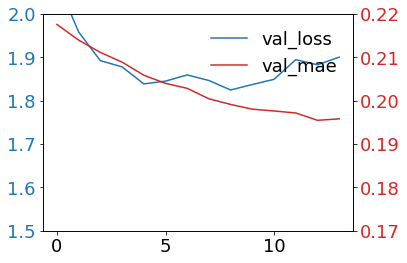

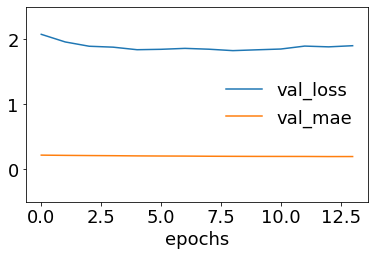

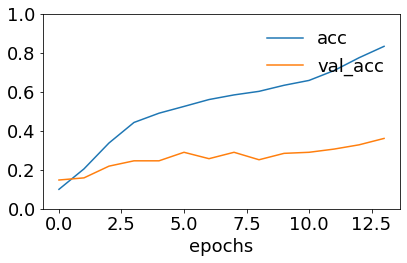

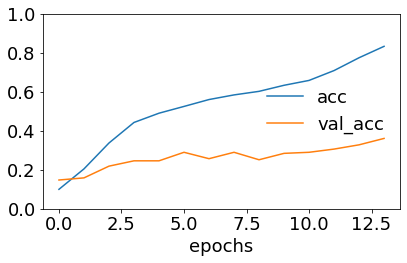

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       1.00      0.01      0.03        75
           2       0.37      0.91      0.52        56
           3       0.61      0.81      0.69        42
           4       0.68      0.33      0.45        45
           5       0.70      0.94      0.80        64
           6       0.00      0.00      0.00        15

    accuracy                           0.53       304
   macro avg       0.48      0.43      0.36       304
weighted avg       0.65      0.53      0.43       304



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_2, r1] = bilstm_tf_cnn(texts_tf2, data_2, embedding_matrix_2, num2)  # 50% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "model_70"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_141 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_67 (Embedding)        (None, 432, 300)     6346500     input_141[0][0]                  
__________________________________________________________________________________________________
input_142 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_14 (Conv1D)              (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

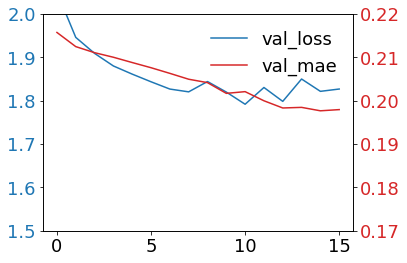

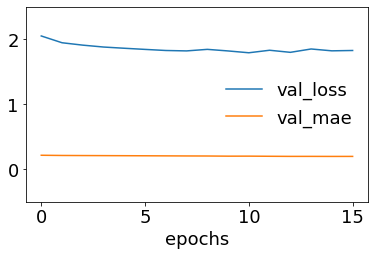

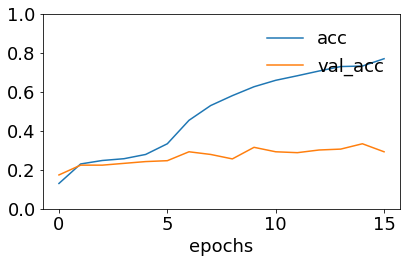

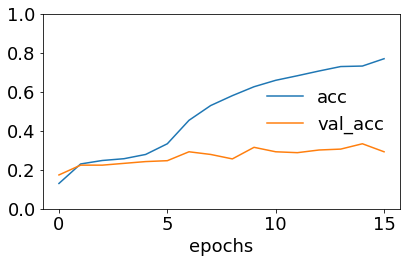

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.30      0.41      0.35        88
           2       0.31      0.27      0.29        67
           3       0.21      0.50      0.30        52
           4       0.20      0.02      0.03        55
           5       0.35      0.29      0.32        76
           6       0.00      0.00      0.00        18
           7       0.00      0.00      0.00         1

    accuracy                           0.28       366
   macro avg       0.17      0.19      0.16       366
weighted avg       0.26      0.28      0.25       366

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00010: early stopping
Model: "model_71"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_143 (InputLayer)      

<Figure size 432x288 with 0 Axes>

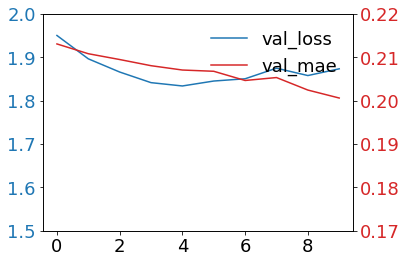

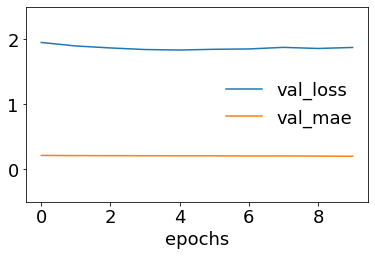

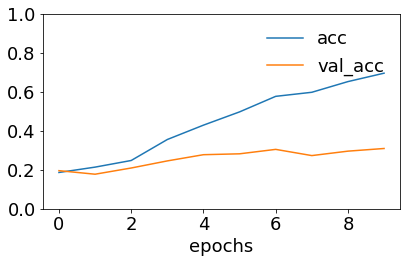

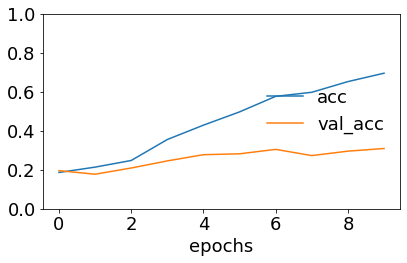

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.59      0.55      0.56        88
           2       0.13      0.03      0.05        66
           3       0.00      0.00      0.00        52
           4       0.20      0.04      0.06        55
           5       0.28      0.95      0.44        77
           6       0.00      0.00      0.00        18

    accuracy                           0.34       365
   macro avg       0.17      0.22      0.16       365
weighted avg       0.26      0.34      0.25       365

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "model_72"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_145 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

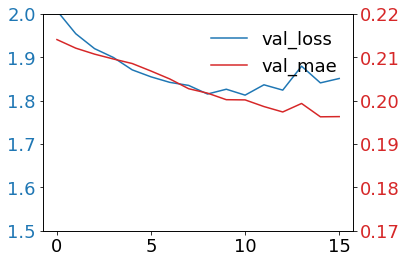

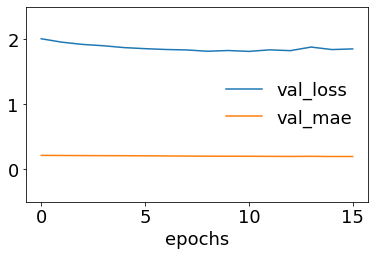

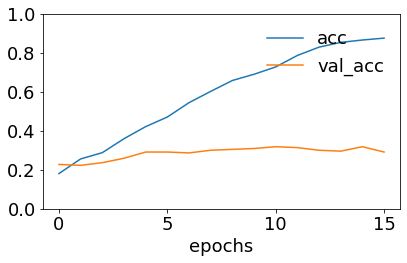

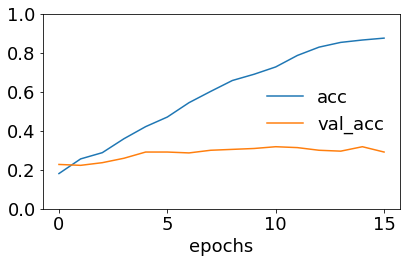

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.50      0.78      0.61        88
           2       0.36      0.18      0.24        66
           3       0.39      0.42      0.40        52
           4       0.39      0.27      0.32        55
           5       0.55      0.71      0.62        77
           6       0.00      0.00      0.00        18

    accuracy                           0.47       365
   macro avg       0.31      0.34      0.31       365
weighted avg       0.42      0.47      0.43       365

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00012: early stopping
Model: "model_73"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_147 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

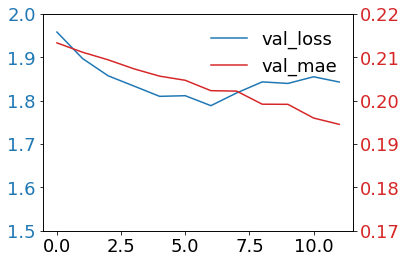

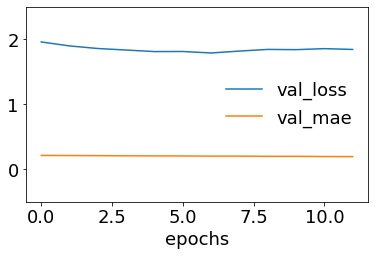

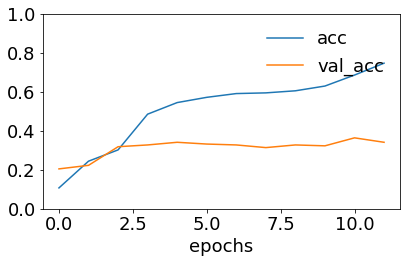

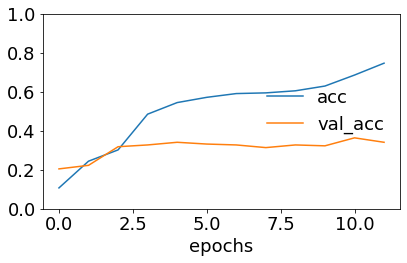

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.46      0.93      0.61        88
           2       0.45      0.53      0.49        66
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00        54
           5       0.57      0.82      0.67        76
           6       0.00      0.00      0.00        19

    accuracy                           0.49       365
   macro avg       0.21      0.33      0.25       365
weighted avg       0.31      0.49      0.38       365

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00010: early stopping
Model: "model_74"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_149 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

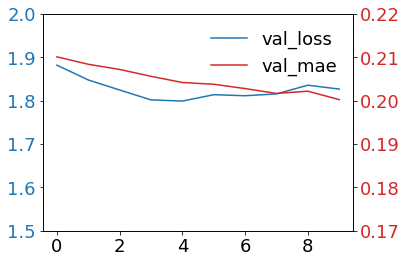

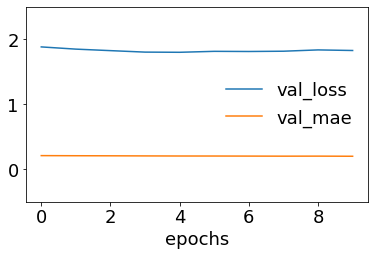

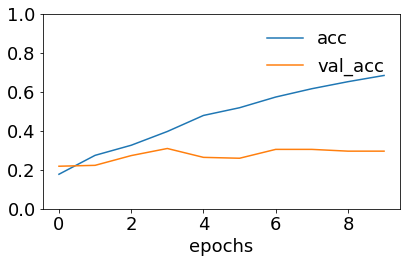

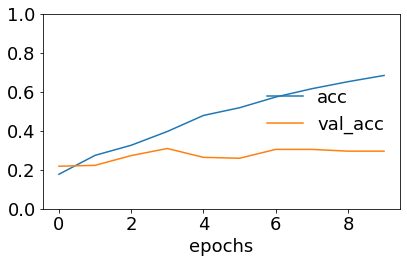

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.48      0.90      0.63        88
           2       0.54      0.20      0.29        66
           3       0.36      0.38      0.37        52
           4       0.00      0.00      0.00        54
           5       0.48      0.76      0.59        76
           6       0.00      0.00      0.00        19
           7       0.00      0.00      0.00         1

    accuracy                           0.47       365
   macro avg       0.23      0.28      0.23       365
weighted avg       0.36      0.47      0.38       365

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_75"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_151 (InputLayer)      

<Figure size 432x288 with 0 Axes>

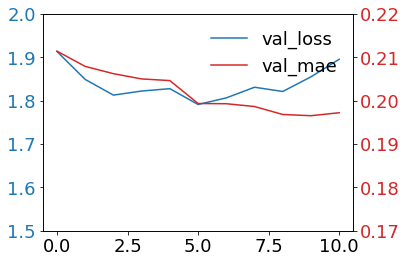

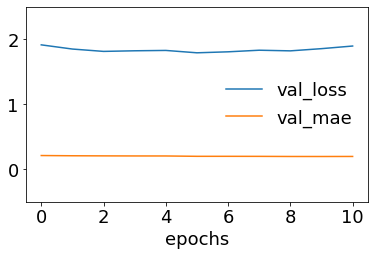

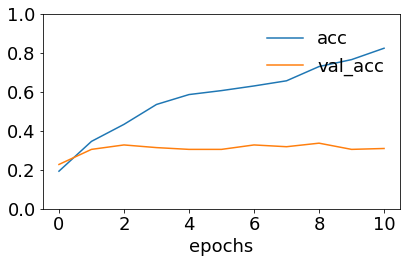

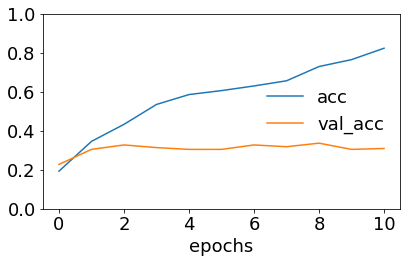

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.53      0.91      0.67        88
           2       0.52      0.71      0.60        66
           3       1.00      0.02      0.04        52
           4       0.31      0.07      0.12        54
           5       0.65      0.93      0.77        76
           6       0.00      0.00      0.00        19
           7       0.00      0.00      0.00         1

    accuracy                           0.56       365
   macro avg       0.38      0.33      0.27       365
weighted avg       0.54      0.56      0.45       365

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_76"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_153 (InputLayer)      

<Figure size 432x288 with 0 Axes>

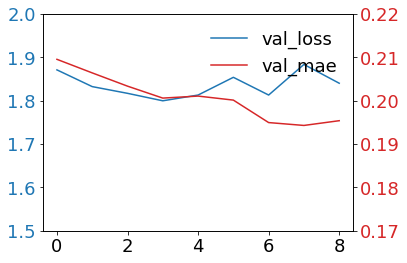

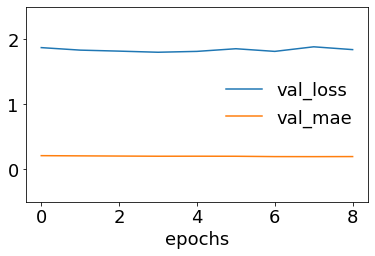

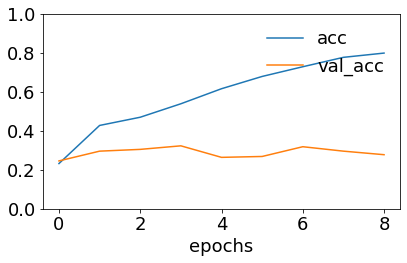

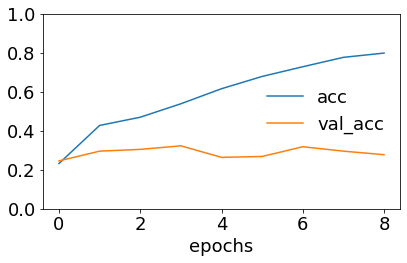

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         9
           1       0.53      0.93      0.68        88
           2       0.67      0.06      0.11        66
           3       0.20      0.02      0.04        52
           4       0.38      0.36      0.37        55
           5       0.48      0.93      0.64        76
           6       0.00      0.00      0.00        18
           7       0.00      0.00      0.00         1

    accuracy                           0.49       365
   macro avg       0.28      0.29      0.23       365
weighted avg       0.43      0.49      0.38       365



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_3, r1] = bilstm_tf_cnn(texts_tf3, data_3, embedding_matrix_3, num3)  # 80% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_77"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_155 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_68 (Embedding)        (None, 432, 300)     6667200     input_155[0][0]                  
__________________________________________________________________________________________________
input_156 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_21 (Conv1D)              (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

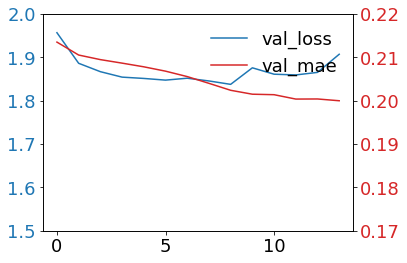

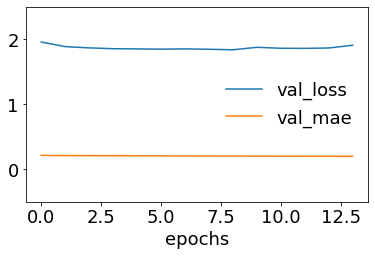

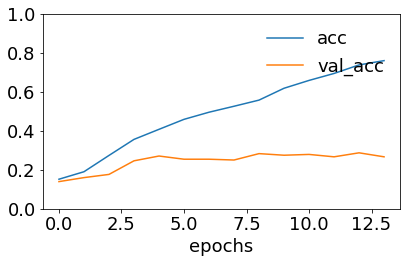

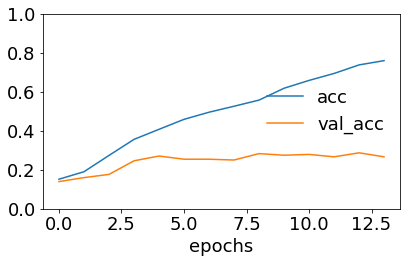

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.30      0.48      0.37        98
           2       0.50      0.07      0.12        73
           3       0.35      0.10      0.16        59
           4       0.16      0.20      0.18        61
           5       0.27      0.49      0.35        84
           6       0.00      0.00      0.00        21

    accuracy                           0.27       406
   macro avg       0.23      0.19      0.17       406
weighted avg       0.30      0.27      0.23       406

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_78"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_157 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

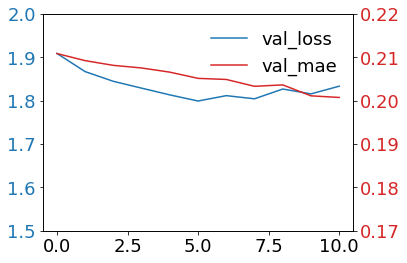

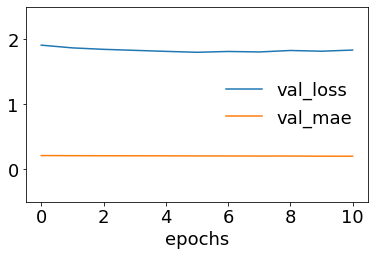

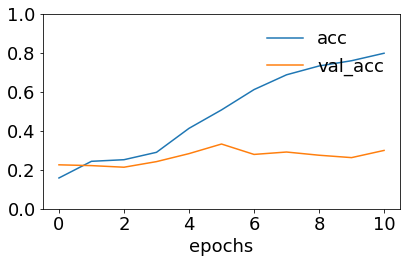

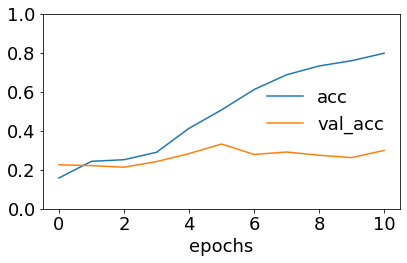

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.49      0.81      0.61        98
           2       0.47      0.11      0.18        73
           3       0.38      0.34      0.36        59
           4       0.62      0.21      0.32        61
           5       0.33      0.62      0.43        84
           6       0.00      0.00      0.00        20
           7       0.00      0.00      0.00         1

    accuracy                           0.42       406
   macro avg       0.29      0.26      0.24       406
weighted avg       0.42      0.42      0.37       406

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_79"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_159 (InputLayer)      

<Figure size 432x288 with 0 Axes>

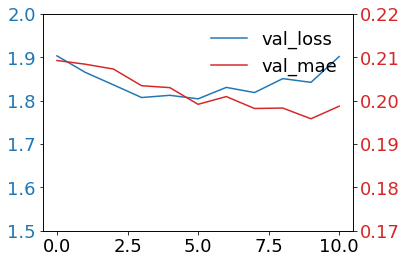

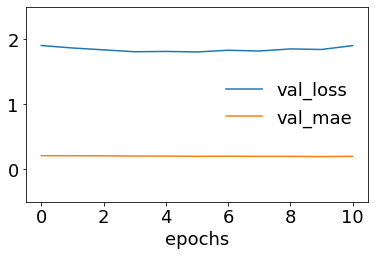

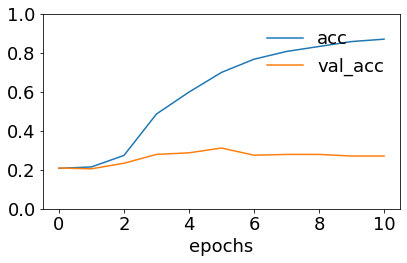

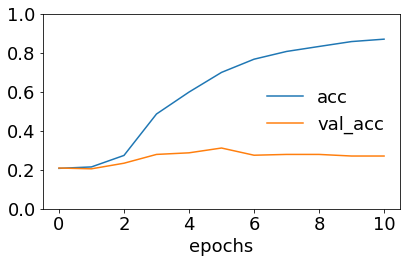

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.55      0.90      0.68        98
           2       0.43      0.14      0.21        73
           3       0.50      0.17      0.25        59
           4       0.55      0.43      0.48        61
           5       0.41      0.75      0.53        84
           6       0.00      0.00      0.00        20
           7       0.00      0.00      0.00         1

    accuracy                           0.49       406
   macro avg       0.31      0.30      0.27       406
weighted avg       0.45      0.49      0.42       406

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_80"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_161 (InputLayer)      

<Figure size 432x288 with 0 Axes>

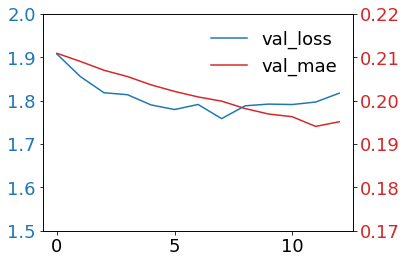

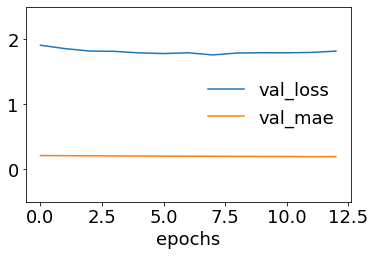

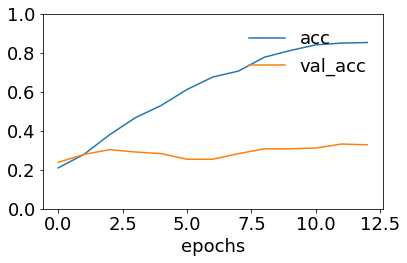

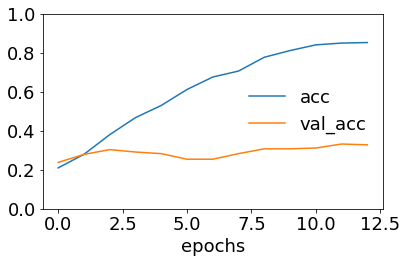

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.65      0.77      0.70        98
           2       0.39      0.64      0.48        73
           3       0.57      0.20      0.30        59
           4       0.28      0.36      0.31        61
           5       0.48      0.39      0.43        84
           6       0.00      0.00      0.00        20
           7       0.00      0.00      0.00         1

    accuracy                           0.47       406
   macro avg       0.30      0.30      0.28       406
weighted avg       0.45      0.47      0.44       406

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_81"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_163 (InputLayer)      

<Figure size 432x288 with 0 Axes>

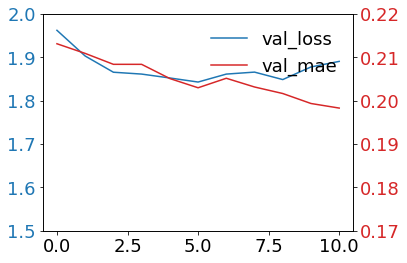

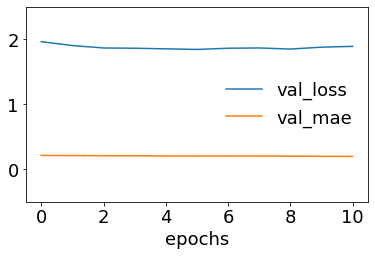

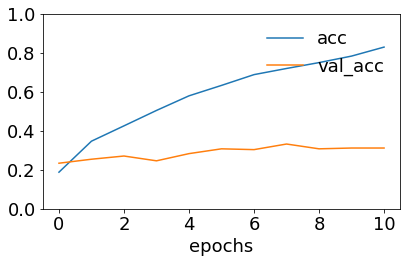

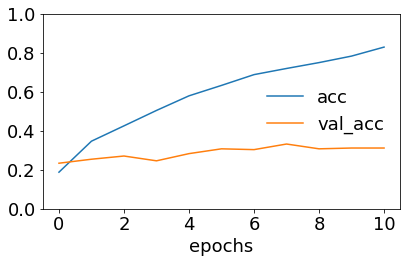

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.59      0.89      0.71        98
           2       0.37      0.53      0.44        73
           3       0.00      0.00      0.00        58
           4       0.51      0.41      0.45        61
           5       0.58      0.72      0.64        85
           6       0.00      0.00      0.00        20
           7       0.00      0.00      0.00         1

    accuracy                           0.52       406
   macro avg       0.26      0.32      0.28       406
weighted avg       0.41      0.52      0.45       406

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00008: early stopping
Model: "model_82"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_165 (InputLayer)      

<Figure size 432x288 with 0 Axes>

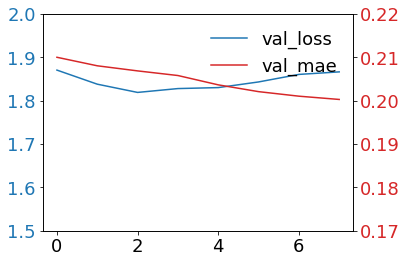

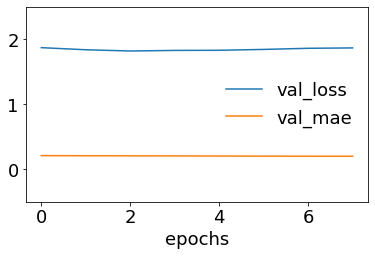

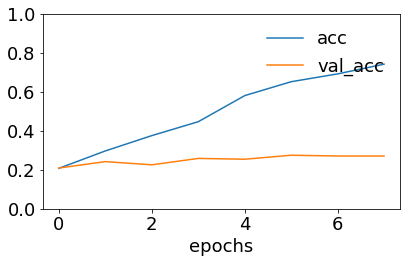

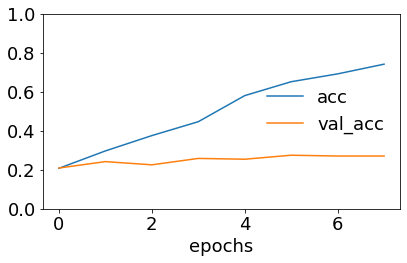

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.41      0.93      0.57        98
           2       0.37      0.86      0.51        73
           3       0.00      0.00      0.00        58
           4       0.67      0.10      0.17        61
           5       0.00      0.00      0.00        85
           6       0.00      0.00      0.00        20

    accuracy                           0.40       405
   macro avg       0.21      0.27      0.18       405
weighted avg       0.26      0.40      0.26       405

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_83"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_167 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

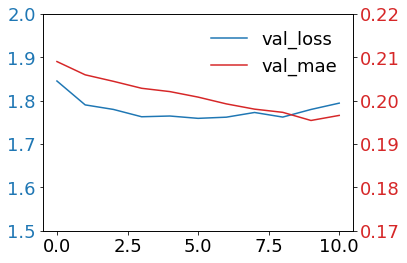

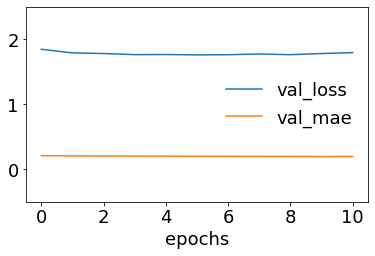

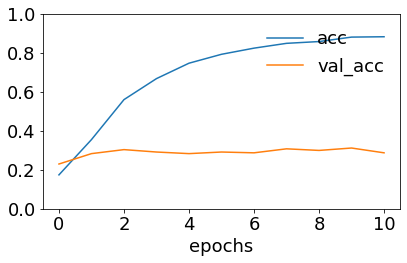

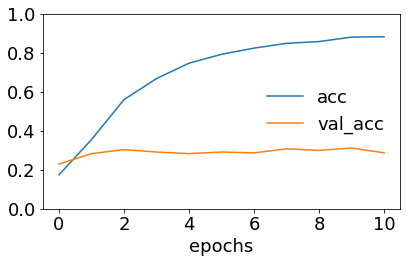

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.68      0.89      0.77        98
           2       0.83      0.60      0.69        72
           3       0.59      0.66      0.62        58
           4       0.64      0.69      0.67        62
           5       0.62      0.69      0.65        84
           6       0.00      0.00      0.00        21

    accuracy                           0.66       405
   macro avg       0.48      0.50      0.49       405
weighted avg       0.62      0.66      0.64       405



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_4, r1] = bilstm_tf_cnn(texts_tf4, data_4, embedding_matrix_4, num4)  # 100% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_84"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_169 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_69 (Embedding)        (None, 432, 300)     6873300     input_169[0][0]                  
__________________________________________________________________________________________________
input_170 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_28 (Conv1D)              (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

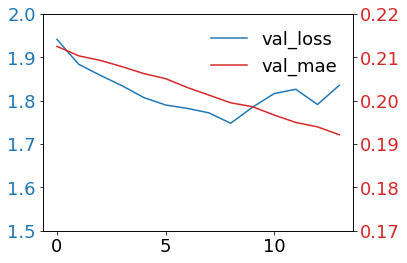

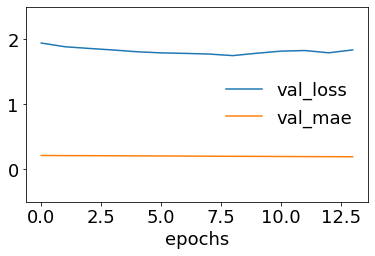

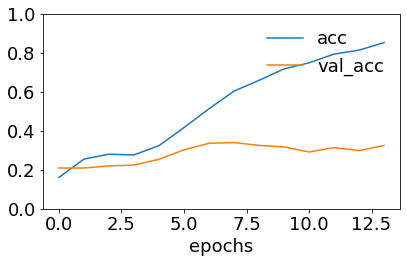

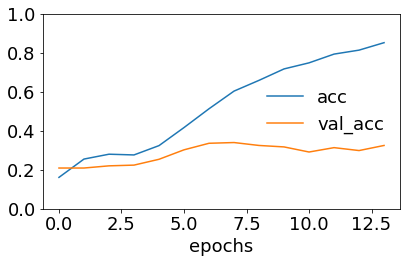

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.39      0.54      0.45       108
           2       0.34      0.21      0.26        80
           3       0.14      0.03      0.05        64
           4       0.21      0.27      0.24        67
           5       0.34      0.55      0.42        93
           6       0.00      0.00      0.00        23
           7       0.00      0.00      0.00         1

    accuracy                           0.33       447
   macro avg       0.18      0.20      0.18       447
weighted avg       0.28      0.33      0.29       447

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_85"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_171 (InputLayer)      

<Figure size 432x288 with 0 Axes>

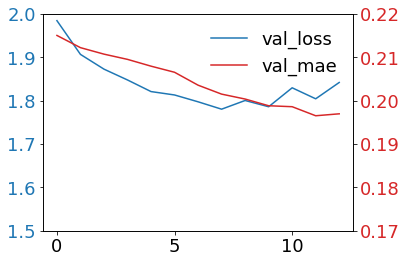

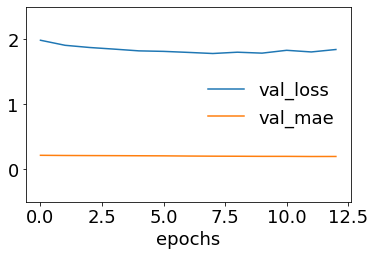

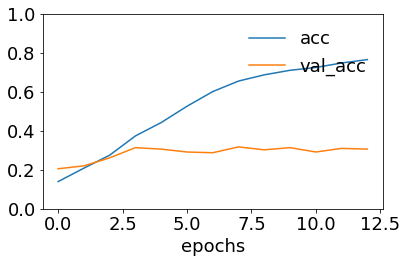

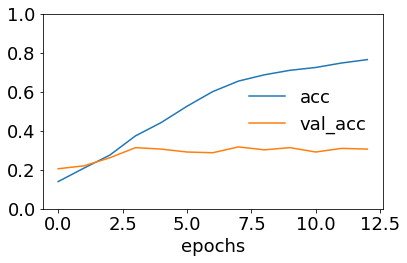

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.49      0.61      0.54       109
           2       0.48      0.47      0.48        80
           3       0.37      0.52      0.43        64
           4       0.00      0.00      0.00        67
           5       0.51      0.77      0.61        93
           6       0.00      0.00      0.00        22
           7       0.00      0.00      0.00         1

    accuracy                           0.47       447
   macro avg       0.23      0.30      0.26       447
weighted avg       0.36      0.47      0.41       447

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_86"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_173 (InputLayer)      

<Figure size 432x288 with 0 Axes>

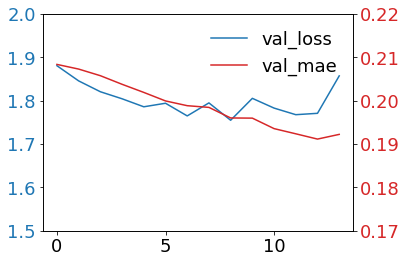

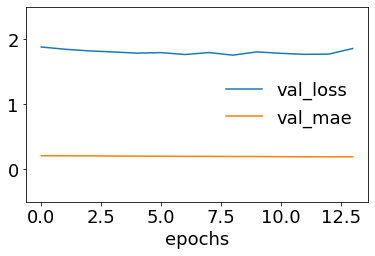

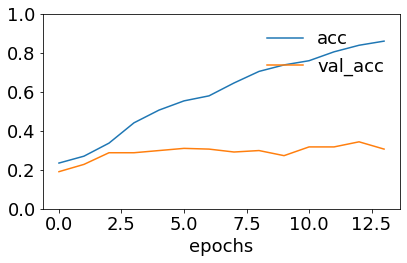

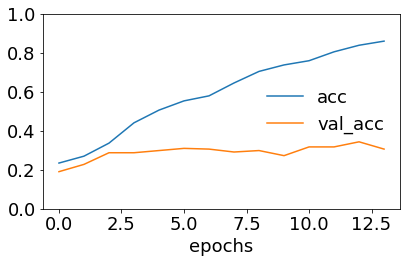

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.64      0.69      0.66       109
           2       0.85      0.41      0.55        80
           3       0.38      0.70      0.49        64
           4       0.00      0.00      0.00        67
           5       0.49      0.90      0.64        93
           6       0.00      0.00      0.00        22

    accuracy                           0.53       446
   macro avg       0.34      0.39      0.34       446
weighted avg       0.47      0.53      0.47       446

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00012: early stopping
Model: "model_87"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_175 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

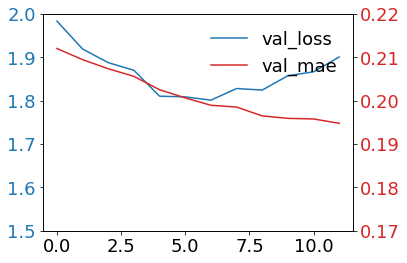

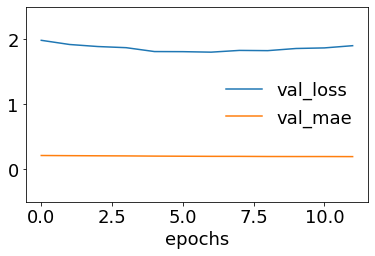

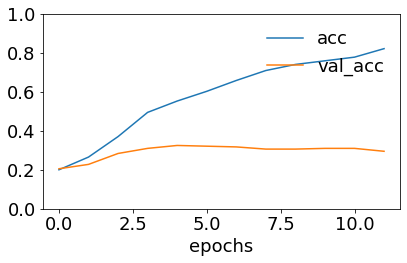

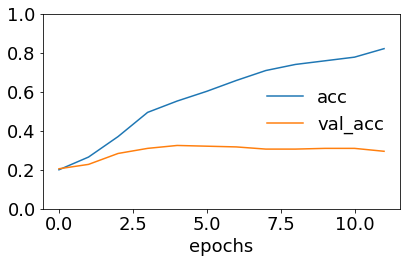

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.68      0.86      0.76       109
           2       0.82      0.56      0.66        81
           3       0.60      0.73      0.66        63
           4       0.00      0.00      0.00        67
           5       0.49      0.93      0.64        92
           6       0.00      0.00      0.00        23

    accuracy                           0.61       446
   macro avg       0.37      0.44      0.39       446
weighted avg       0.50      0.61      0.53       446

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00012: early stopping
Model: "model_88"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_177 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

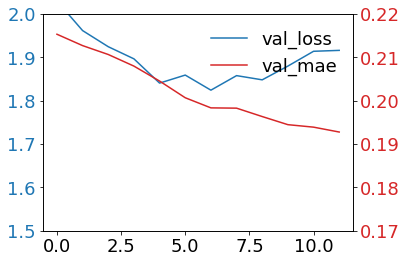

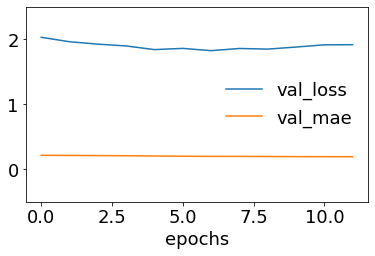

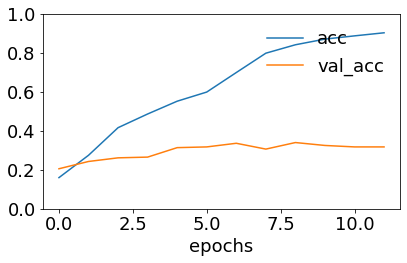

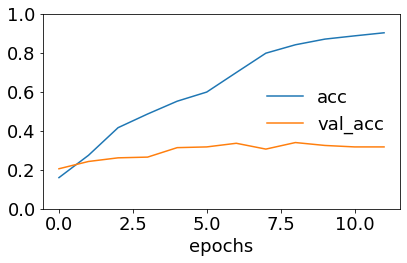

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.84      0.50      0.62       109
           2       0.49      0.86      0.62        80
           3       0.63      0.87      0.73        63
           4       0.73      0.45      0.56        67
           5       0.76      0.92      0.83        93
           6       0.00      0.00      0.00        23
           7       0.00      0.00      0.00         1

    accuracy                           0.66       446
   macro avg       0.43      0.45      0.42       446
weighted avg       0.65      0.66      0.63       446

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00012: early stopping
Model: "model_89"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_179 (InputLayer)      

<Figure size 432x288 with 0 Axes>

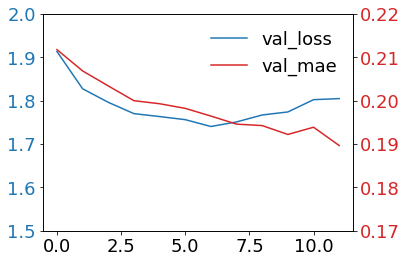

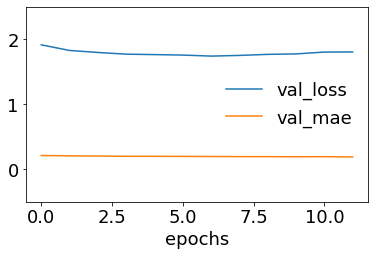

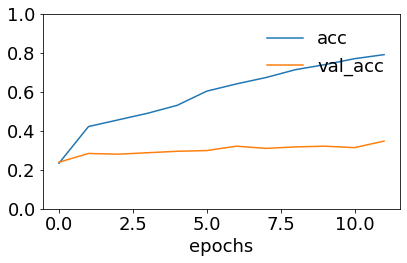

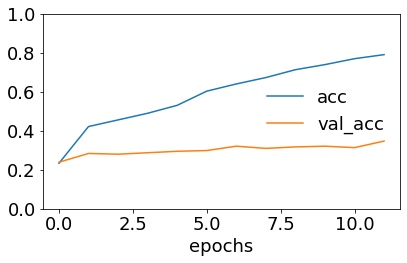

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.50      0.87      0.63       108
           2       0.77      0.85      0.81        80
           3       0.00      0.00      0.00        63
           4       0.50      0.12      0.19        67
           5       0.55      0.90      0.68        93
           6       0.00      0.00      0.00        23
           7       0.00      0.00      0.00         1

    accuracy                           0.57       446
   macro avg       0.29      0.34      0.29       446
weighted avg       0.45      0.57      0.47       446

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_90"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_181 (InputLayer)      

<Figure size 432x288 with 0 Axes>

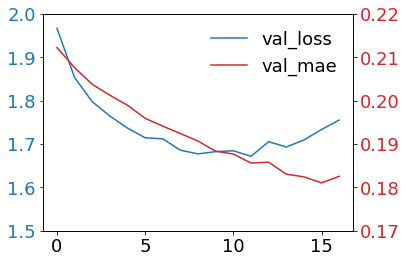

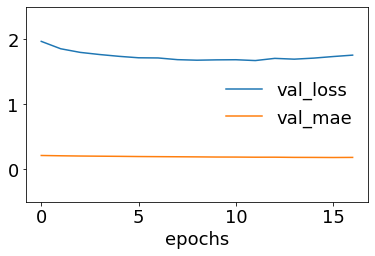

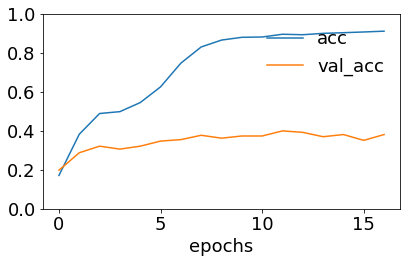

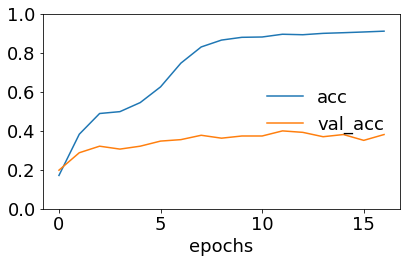

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.73      0.86      0.79       108
           2       0.81      0.78      0.79        80
           3       0.70      0.70      0.70        63
           4       0.51      0.81      0.62        67
           5       0.88      0.68      0.76        93
           6       0.00      0.00      0.00        23
           7       0.00      0.00      0.00         1

    accuracy                           0.71       446
   macro avg       0.45      0.48      0.46       446
weighted avg       0.68      0.71      0.68       446



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_5, r1] = bilstm_tf_cnn(texts_tf5, data_5, embedding_matrix_5, num5)  # 120% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00014: early stopping
Model: "model_91"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_183 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_70 (Embedding)        (None, 432, 300)     7126800     input_183[0][0]                  
__________________________________________________________________________________________________
input_184 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_35 (Conv1D)              (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

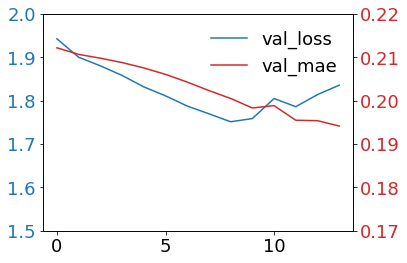

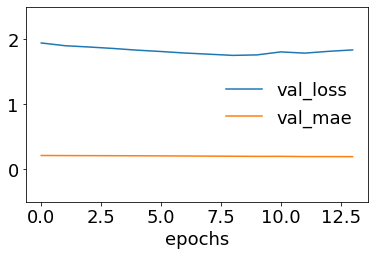

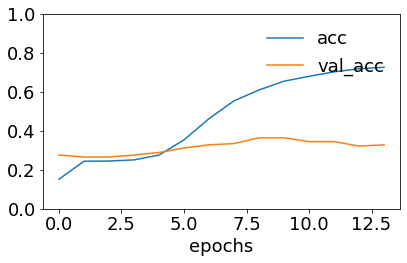

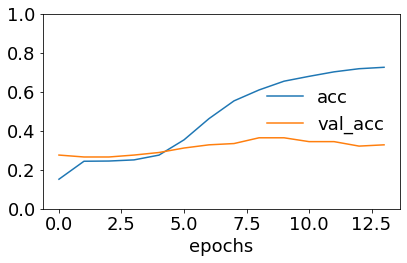

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.34      0.73      0.47       123
           2       0.17      0.02      0.04        92
           3       0.31      0.31      0.31        71
           4       0.27      0.39      0.32        77
           5       0.61      0.29      0.39       107
           6       0.00      0.00      0.00        25
           7       0.00      0.00      0.00         1

    accuracy                           0.34       508
   macro avg       0.21      0.22      0.19       508
weighted avg       0.33      0.34      0.29       508

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_92"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_185 (InputLayer)      

<Figure size 432x288 with 0 Axes>

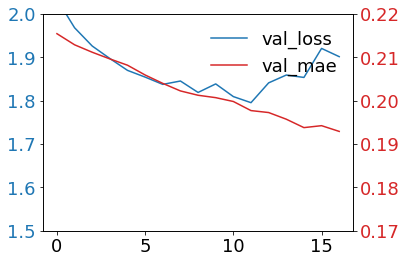

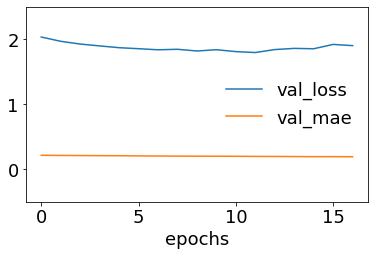

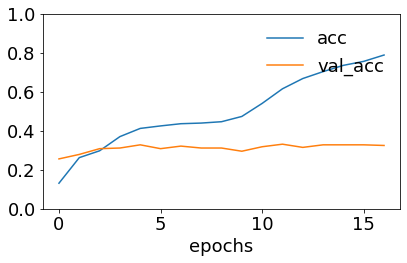

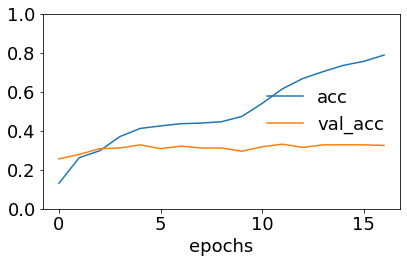

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.41      0.86      0.56       124
           2       0.33      0.01      0.02        93
           3       0.37      0.39      0.38        71
           4       0.45      0.25      0.32        76
           5       0.54      0.65      0.59       106
           6       0.00      0.00      0.00        26

    accuracy                           0.44       507
   macro avg       0.30      0.31      0.27       507
weighted avg       0.40      0.44      0.37       507

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00010: early stopping
Model: "model_93"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_187 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

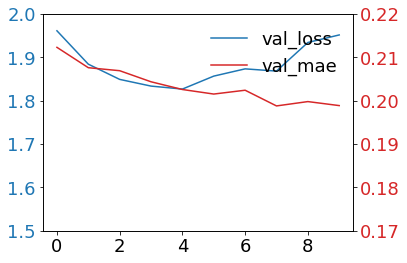

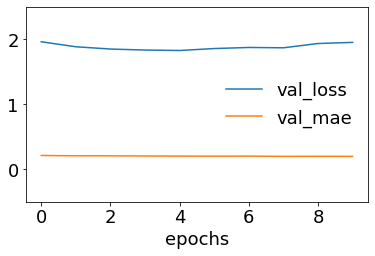

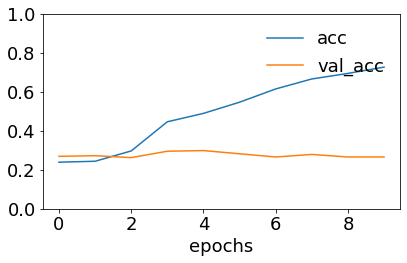

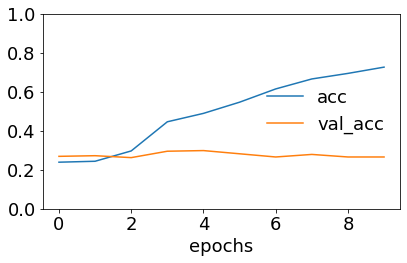

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.52      0.92      0.66       124
           2       0.21      0.06      0.10        93
           3       0.44      0.39      0.42        71
           4       0.33      0.01      0.03        76
           5       0.43      0.78      0.56       106
           6       0.00      0.00      0.00        25

    accuracy                           0.46       507
   macro avg       0.28      0.31      0.25       507
weighted avg       0.37      0.46      0.36       507

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_94"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_189 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

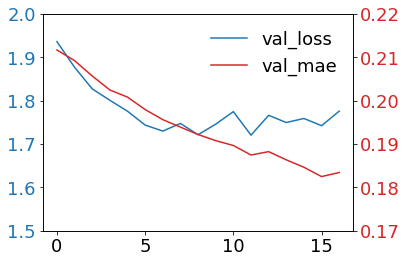

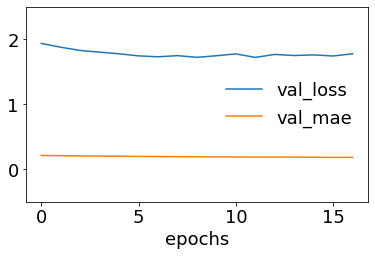

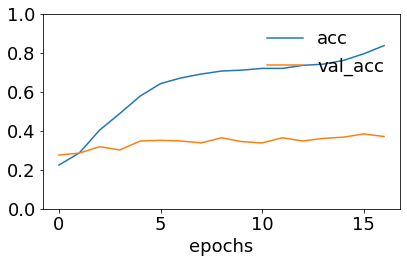

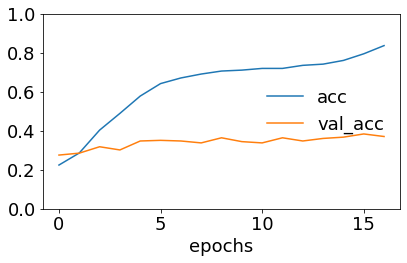

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.48      0.95      0.64       124
           2       1.00      0.02      0.04        92
           3       0.61      0.58      0.59        71
           4       0.68      0.74      0.71        76
           5       0.77      0.81      0.79       106
           6       0.00      0.00      0.00        25
           7       0.00      0.00      0.00         1

    accuracy                           0.60       507
   macro avg       0.44      0.39      0.35       507
weighted avg       0.65      0.60      0.52       507

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_95"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_191 (InputLayer)      

<Figure size 432x288 with 0 Axes>

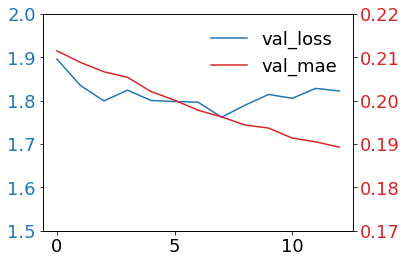

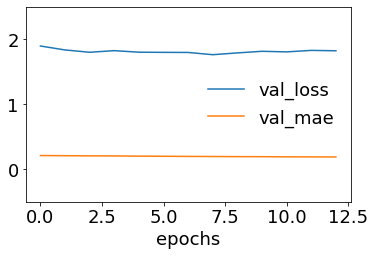

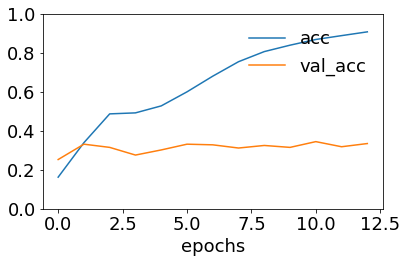

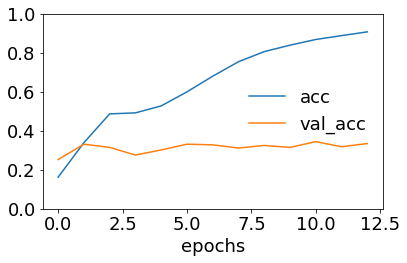

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.58      0.67      0.62       124
           2       0.39      0.52      0.45        92
           3       0.70      0.52      0.60        71
           4       0.66      0.62      0.64        76
           5       0.76      0.86      0.81       106
           6       0.00      0.00      0.00        25
           7       0.00      0.00      0.00         1

    accuracy                           0.60       507
   macro avg       0.39      0.40      0.39       507
weighted avg       0.57      0.60      0.58       507

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_96"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_193 (InputLayer)      

<Figure size 432x288 with 0 Axes>

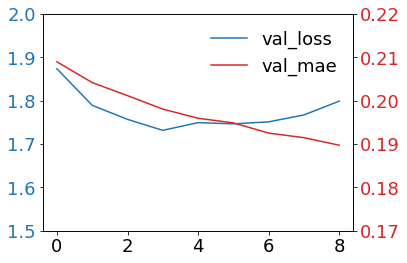

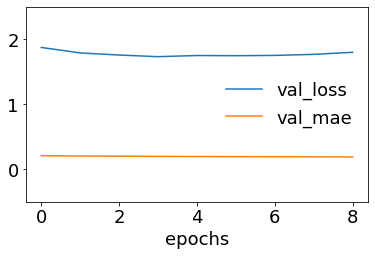

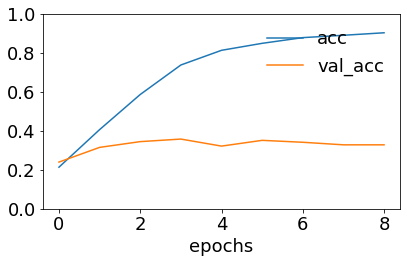

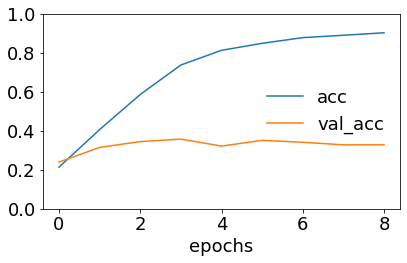

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.62      0.89      0.73       124
           2       0.61      0.38      0.47        92
           3       0.71      0.85      0.77        71
           4       0.75      0.53      0.62        76
           5       0.73      0.93      0.82       106
           6       0.00      0.00      0.00        25
           7       0.00      0.00      0.00         1

    accuracy                           0.68       507
   macro avg       0.43      0.45      0.43       507
weighted avg       0.63      0.68      0.64       507

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_97"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_195 (InputLayer)      

<Figure size 432x288 with 0 Axes>

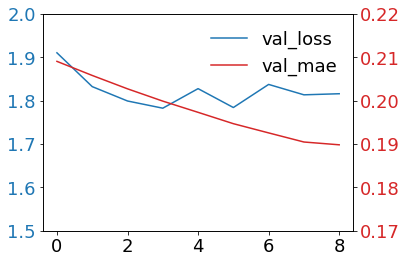

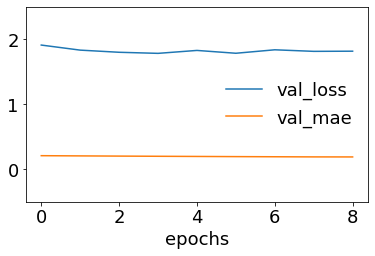

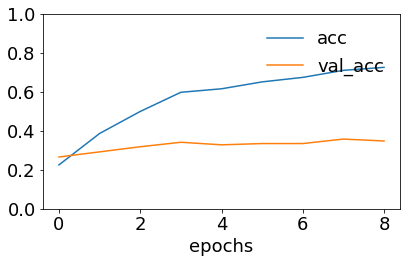

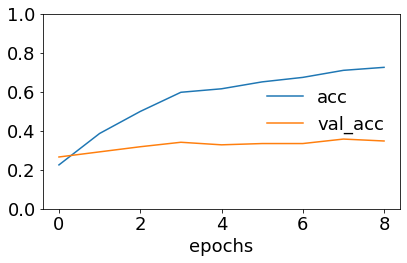

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.48      0.94      0.63       123
           2       0.00      0.00      0.00        92
           3       0.83      0.21      0.34        71
           4       0.52      0.88      0.65        76
           5       0.83      0.90      0.86       107
           6       0.00      0.00      0.00        25
           7       0.00      0.00      0.00         1

    accuracy                           0.58       507
   macro avg       0.33      0.37      0.31       507
weighted avg       0.48      0.58      0.48       507



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_6, r1] = bilstm_tf_cnn(texts_tf6, data_6, embedding_matrix_6, num6)  # 150% data augmentation

##### 1.8 augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "model_98"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_197 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_71 (Embedding)        (None, 432, 300)     7315800     input_197[0][0]                  
__________________________________________________________________________________________________
input_198 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_42 (Conv1D)              (None, 430, 300)     270300

<Figure size 432x288 with 0 Axes>

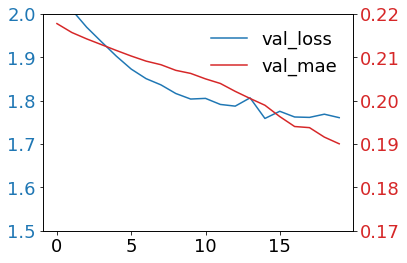

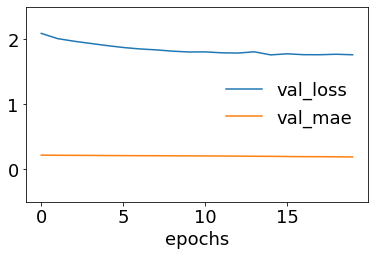

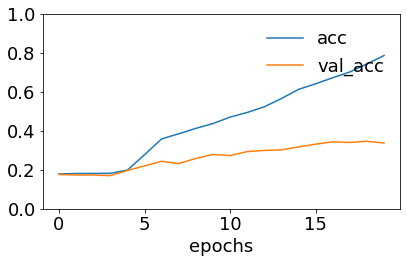

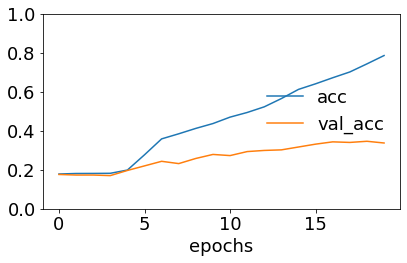

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.41      0.46      0.44       137
           2       0.22      0.47      0.30       103
           3       0.00      0.00      0.00        82
           4       0.26      0.08      0.12        85
           5       0.29      0.42      0.34       118
           6       0.00      0.00      0.00        29

    accuracy                           0.29       568
   macro avg       0.17      0.20      0.17       568
weighted avg       0.24      0.29      0.25       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_99"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_199 (InputLayer)          [(None, 432)]        0                            

<Figure size 432x288 with 0 Axes>

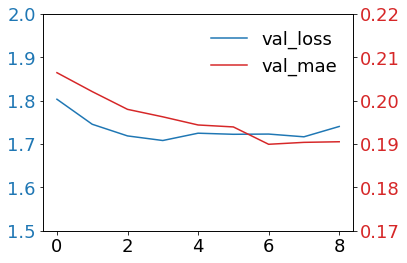

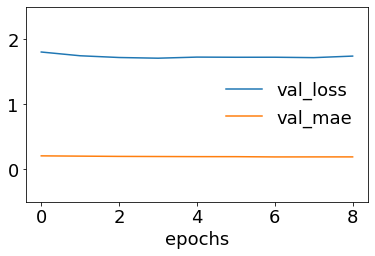

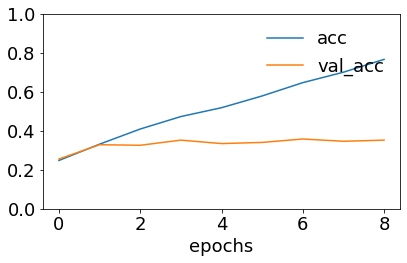

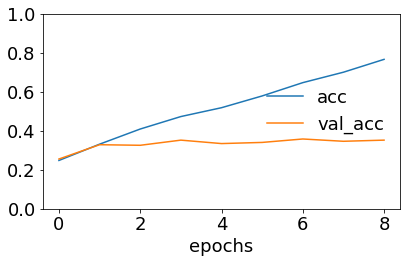

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.46      0.87      0.60       137
           2       0.36      0.32      0.34       103
           3       0.00      0.00      0.00        82
           4       0.00      0.00      0.00        85
           5       0.43      0.81      0.56       118
           6       0.00      0.00      0.00        28
           7       0.00      0.00      0.00         1

    accuracy                           0.43       568
   macro avg       0.16      0.25      0.19       568
weighted avg       0.27      0.43      0.32       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_100"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_201 (InputLayer)     

<Figure size 432x288 with 0 Axes>

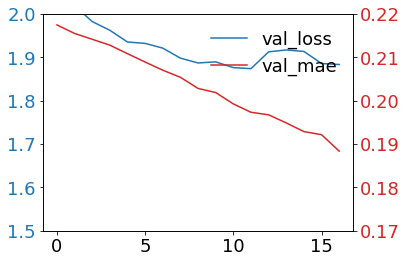

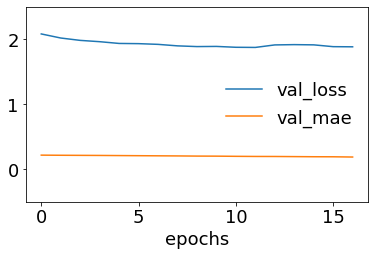

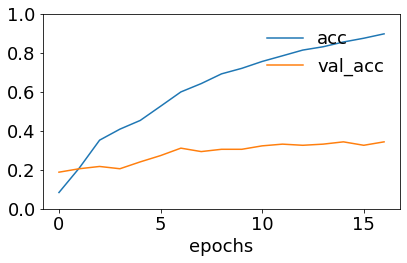

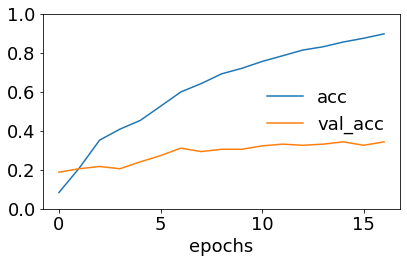

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.61      0.85      0.71       137
           2       0.45      0.67      0.54       103
           3       0.55      0.33      0.41        82
           4       0.43      0.19      0.26        85
           5       0.62      0.72      0.67       118
           6       0.00      0.00      0.00        28
           7       0.00      0.00      0.00         1

    accuracy                           0.55       568
   macro avg       0.33      0.35      0.32       568
weighted avg       0.50      0.55      0.51       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_101"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_203 (InputLayer)     

<Figure size 432x288 with 0 Axes>

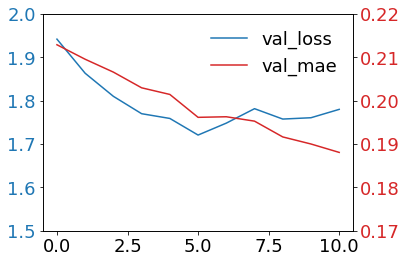

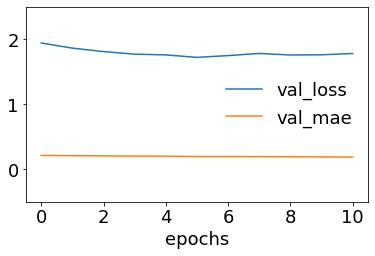

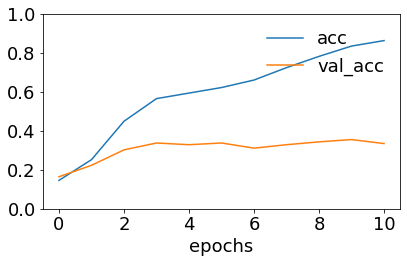

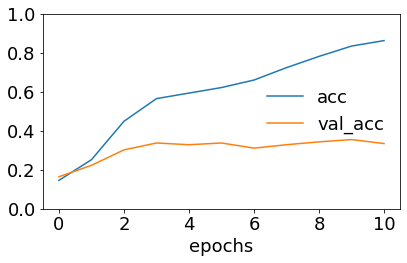

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.60      0.95      0.73       137
           2       0.43      0.63      0.51       102
           3       0.00      0.00      0.00        81
           4       0.62      0.21      0.31        86
           5       0.61      0.88      0.72       119
           6       0.00      0.00      0.00        28
           7       0.00      0.00      0.00         1

    accuracy                           0.56       568
   macro avg       0.28      0.33      0.28       568
weighted avg       0.44      0.56      0.47       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_102"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_205 (InputLayer)     

<Figure size 432x288 with 0 Axes>

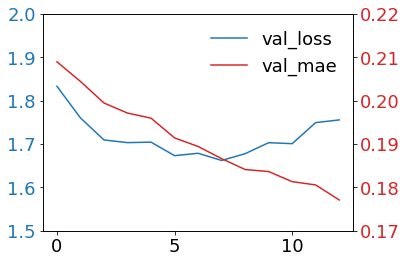

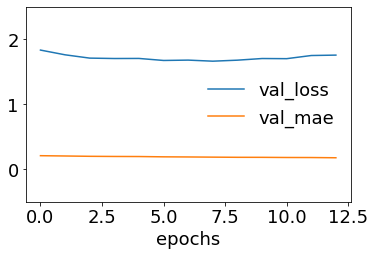

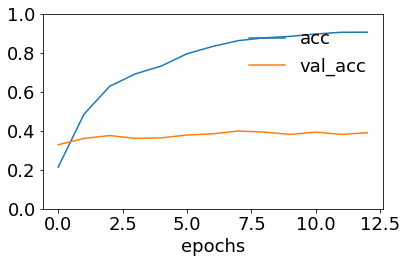

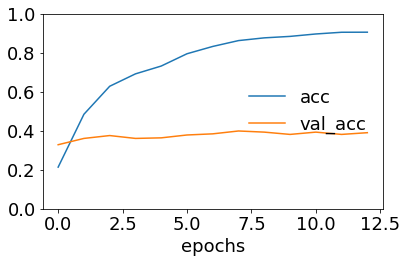

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.75      0.87      0.80       137
           2       0.53      0.60      0.56       102
           3       0.59      0.70      0.64        81
           4       0.71      0.55      0.62        85
           5       0.77      0.85      0.80       119
           6       0.00      0.00      0.00        29
           7       0.00      0.00      0.00         1

    accuracy                           0.68       568
   macro avg       0.42      0.45      0.43       568
weighted avg       0.63      0.68      0.65       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00012: early stopping
Model: "model_103"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_207 (InputLayer)     

<Figure size 432x288 with 0 Axes>

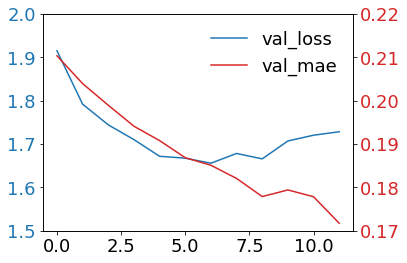

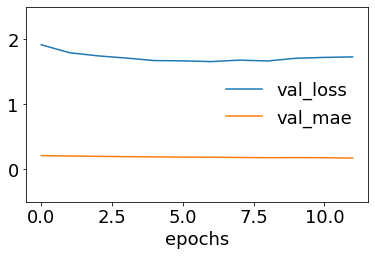

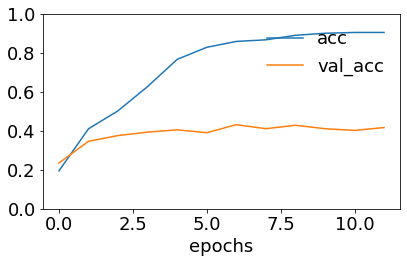

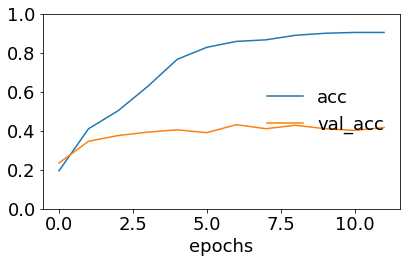

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.75      0.90      0.82       137
           2       0.76      0.78      0.77       102
           3       0.82      0.69      0.75        81
           4       0.69      0.71      0.70        85
           5       0.76      0.92      0.83       119
           6       0.00      0.00      0.00        29
           7       0.00      0.00      0.00         1

    accuracy                           0.76       568
   macro avg       0.47      0.50      0.48       568
weighted avg       0.70      0.76      0.72       568

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_104"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_209 (InputLayer)     

<Figure size 432x288 with 0 Axes>

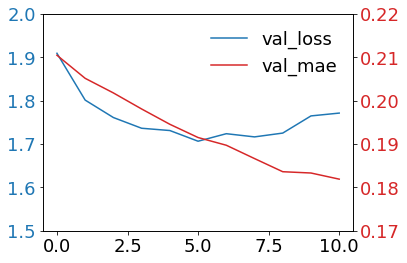

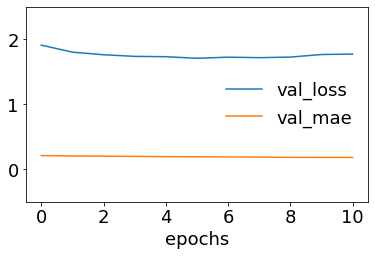

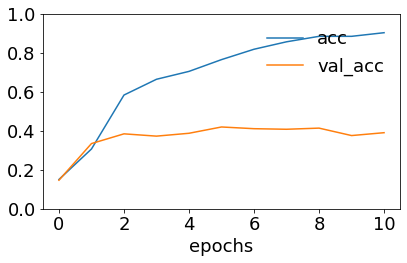

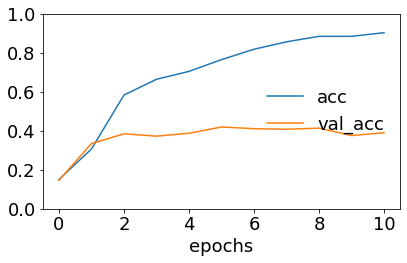

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.79      0.92      0.85       137
           2       0.67      0.84      0.75       103
           3       0.88      0.28      0.43        81
           4       0.93      0.49      0.65        85
           5       0.53      0.93      0.67       118
           6       0.00      0.00      0.00        29
           7       0.00      0.00      0.00         1

    accuracy                           0.68       568
   macro avg       0.48      0.43      0.42       568
weighted avg       0.69      0.68      0.64       568



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_7, r1] = bilstm_tf_cnn(texts_tf7, data_7, embedding_matrix_7, num7)  # 180% data augmentation

In [0]:
scores_bilstm_tf_cnn_7

,accuracy,precision,recall,f1,cohen_kappa_score,auc
0,0.294014,0.238931,0.294014,0.248865,0.113512,0.608773
1,0.434859,0.266846,0.434859,0.324201,0.276755,0.723652
2,0.552817,0.501691,0.552817,0.506426,0.439063,0.826883
3,0.558099,0.442842,0.558099,0.466817,0.440027,0.840081
4,0.677817,0.627317,0.677817,0.648509,0.600242,0.880973
5,0.755282,0.698410,0.755282,0.722774,0.695665,0.919158
6,0.683099,0.688598,0.683099,0.639118,0.602119,0.907633


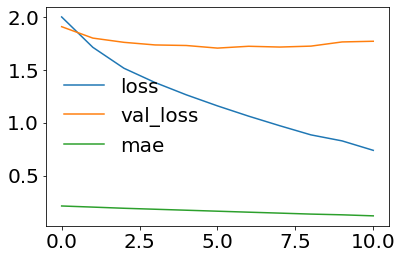

In [0]:
plt.rcParams.update({'figure.autolayout': True, 'font.size':20})

# plot some data
plt.plot(r1.history['loss'], label='loss')
plt.plot(r1.history['val_loss'], label='val_loss')
plt.plot(r1.history['mae'], label='mae')
plt.legend(frameon=False)
plt.show()

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00011: early stopping
Model: "model_105"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_211 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_72 (Embedding)        (None, 432, 300)     6673500     input_211[0][0]                  
__________________________________________________________________________________________________
input_212 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_49 (Conv1D)              (None, 430, 300)     270300      embedding_72[0][0]     

<Figure size 432x288 with 0 Axes>

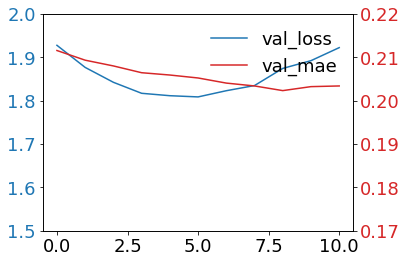

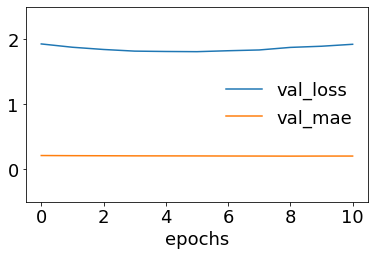

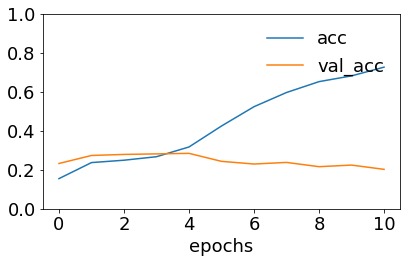

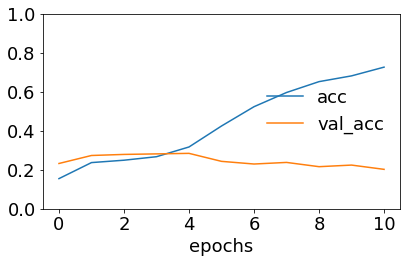

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.29      0.61      0.39       147
           2       0.18      0.11      0.14       109
           3       0.21      0.07      0.10        88
           4       0.16      0.13      0.14        92
           5       0.28      0.29      0.29       127
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00         1

    accuracy                           0.26       609
   macro avg       0.14      0.15      0.13       609
weighted avg       0.22      0.26      0.22       609

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_106"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_213 (InputLayer)     

<Figure size 432x288 with 0 Axes>

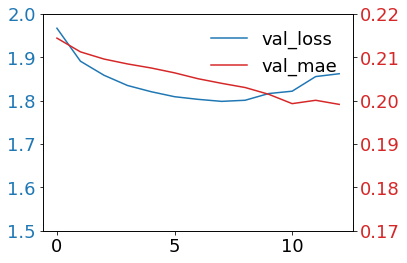

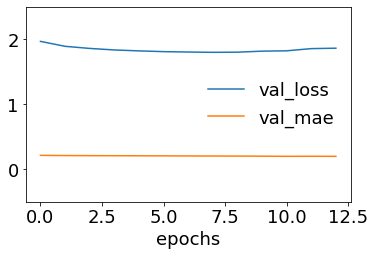

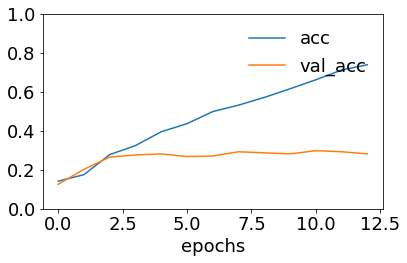

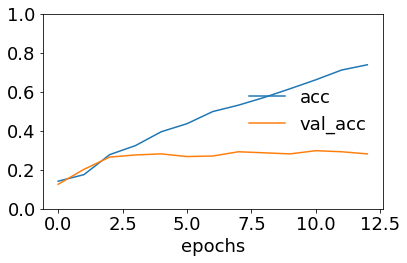

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.32      0.37      0.34       147
           2       0.18      0.27      0.22       109
           3       0.31      0.06      0.10        88
           4       0.00      0.00      0.00        92
           5       0.31      0.65      0.42       127
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00         1

    accuracy                           0.28       609
   macro avg       0.14      0.17      0.13       609
weighted avg       0.22      0.28      0.22       609

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_107"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_215 (InputLayer)     

<Figure size 432x288 with 0 Axes>

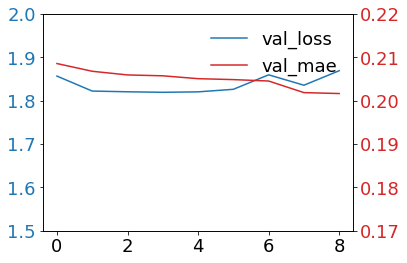

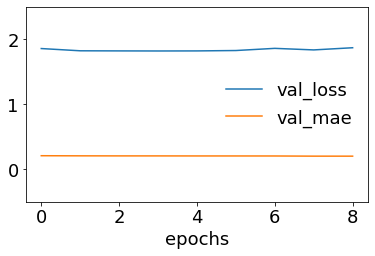

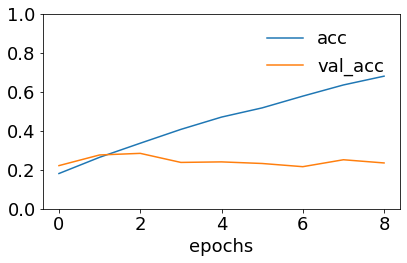

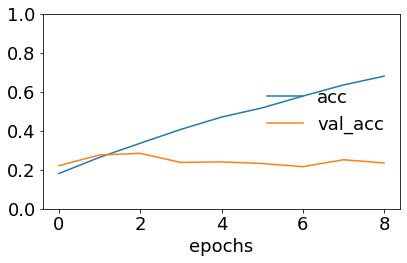

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.34      0.74      0.46       147
           2       0.25      0.05      0.08       109
           3       0.28      0.22      0.24        88
           4       0.00      0.00      0.00        92
           5       0.40      0.62      0.49       127
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00         1

    accuracy                           0.35       609
   macro avg       0.16      0.20      0.16       609
weighted avg       0.25      0.35      0.26       609

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_108"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_217 (InputLayer)     

<Figure size 432x288 with 0 Axes>

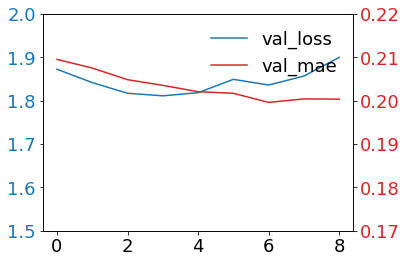

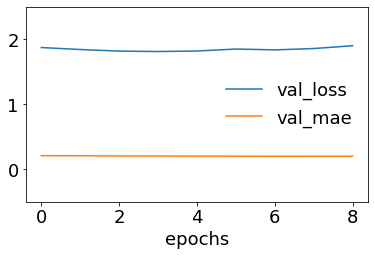

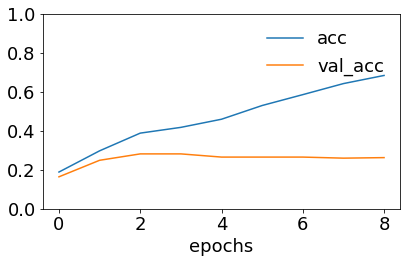

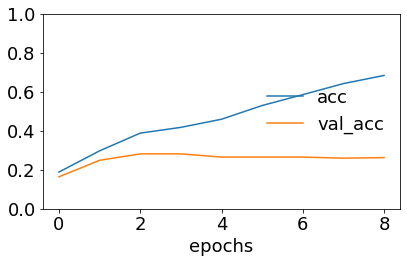

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.37      0.80      0.51       147
           2       0.44      0.06      0.11       109
           3       0.38      0.06      0.10        88
           4       0.38      0.09      0.14        92
           5       0.40      0.76      0.52       126
           6       0.00      0.00      0.00        31
           7       0.00      0.00      0.00         1

    accuracy                           0.38       609
   macro avg       0.25      0.22      0.17       609
weighted avg       0.36      0.38      0.29       609

9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00013: early stopping
Model: "model_109"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_219 (InputLayer)     

<Figure size 432x288 with 0 Axes>

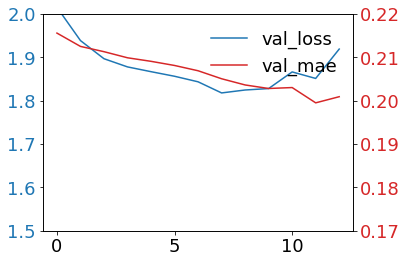

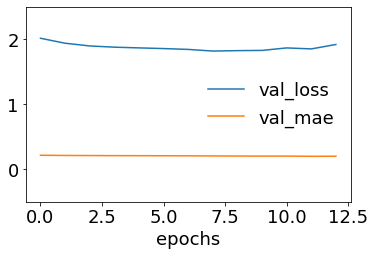

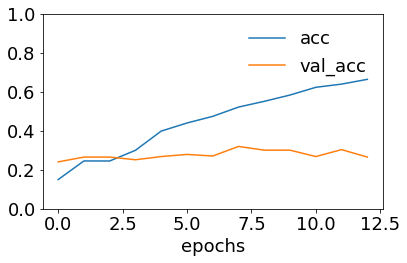

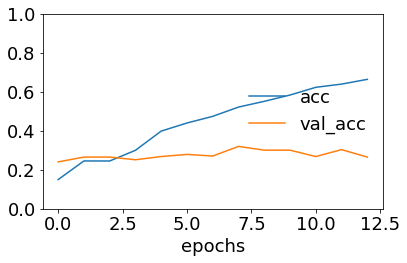

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.36      0.74      0.48       147
           2       0.38      0.19      0.25       109
           3       0.40      0.07      0.12        88
           4       0.31      0.47      0.37        92
           5       0.46      0.33      0.39       126
           6       0.00      0.00      0.00        31

    accuracy                           0.36       608
   macro avg       0.27      0.26      0.23       608
weighted avg       0.35      0.36      0.32       608

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00010: early stopping
Model: "model_110"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_221 (InputLayer)          [(None, 432)]        0                           

<Figure size 432x288 with 0 Axes>

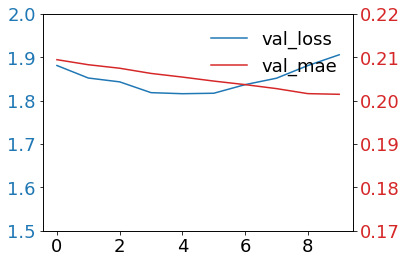

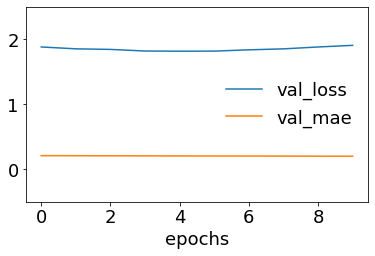

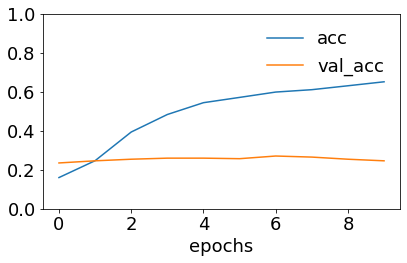

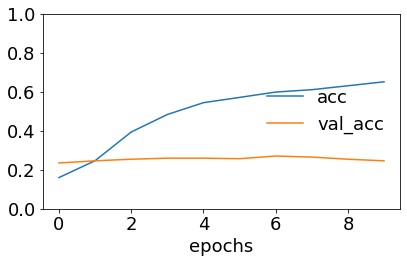

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.48      0.69      0.56       147
           2       0.32      0.65      0.43       110
           3       0.37      0.33      0.35        87
           4       0.00      0.00      0.00        91
           5       0.59      0.42      0.49       126
           6       0.00      0.00      0.00        31
           7       0.00      0.00      0.00         1

    accuracy                           0.42       608
   macro avg       0.22      0.26      0.23       608
weighted avg       0.35      0.42      0.37       608

0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00009: early stopping
Model: "model_111"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_223 (InputLayer)     

<Figure size 432x288 with 0 Axes>

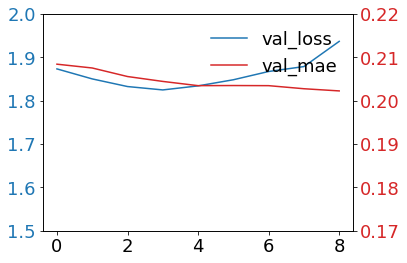

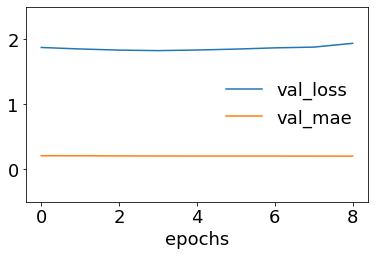

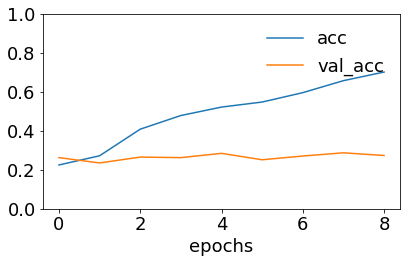

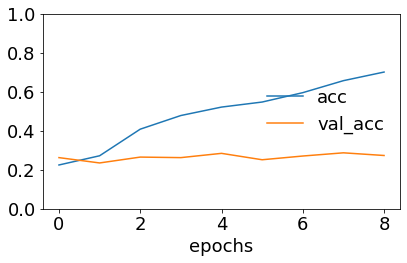

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.52      0.73      0.60       147
           2       0.40      0.65      0.49       110
           3       0.00      0.00      0.00        88
           4       1.00      0.02      0.04        91
           5       0.51      0.89      0.65       126
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00         1

    accuracy                           0.48       608
   macro avg       0.30      0.29      0.22       608
weighted avg       0.45      0.48      0.38       608



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_bilstm_tf_cnn_8, r1] = bilstm_tf_cnn(texts_tf8, data_8, embedding_matrix_8, num8)  # 180% data augmentation

In [0]:
print('20% augmentation')
print(scores_bilstm_tf_cnn_1.mean())
print('\n50% augmentation')
print(scores_bilstm_tf_cnn_2.mean())
print('\n80% augmentation')
print(scores_bilstm_tf_cnn_3.mean())
print('\n100% augmentation')
print(scores_bilstm_tf_cnn_4.mean())
print('\n120% augmentation')
print(scores_bilstm_tf_cnn_5.mean())
print('\n150% augmentation')
print(scores_bilstm_tf_cnn_6.mean())
print('\n180% augmentation')
print(scores_bilstm_tf_cnn_7.mean())
print('\n200% augmentation')
print(scores_bilstm_tf_cnn_8.mean())

20% augmentation
accuracy             0.411503
precision            0.345053
recall               0.411503
f1                   0.326901
cohen_kappa_score    0.251795
auc                  0.727725
dtype: float64

50% augmentation
accuracy             0.499213
precision            0.483566
recall               0.499213
f1                   0.443205
cohen_kappa_score    0.371301
auc                  0.799346
dtype: float64

80% augmentation
accuracy             0.442551
precision            0.370240
recall               0.442551
f1                   0.358531
cohen_kappa_score    0.295776
auc                  0.757853
dtype: float64

100% augmentation
accuracy             0.461316
precision            0.416004
recall               0.461316
f1                   0.400453
cohen_kappa_score    0.321801
auc                  0.765898
dtype: float64

120% augmentation
accuracy             0.552917
precision            0.483557
recall               0.552917
f1                   0.495536
cohen_kap

20% augmentation
accuracy             0.417363
precision            0.370993
recall               0.417363
f1                   0.351632
cohen_kappa_score    0.264235
dtype: float64

50% augmentation
accuracy             0.419339
precision            0.319639
recall               0.419339
f1                   0.315033
cohen_kappa_score    0.254018
dtype: float64

80% augmentation
accuracy             0.518852
precision            0.446138
recall               0.518852
f1                   0.451261
cohen_kappa_score    0.389889
dtype: float64

100% augmentation
accuracy             0.447973
precision            0.373601
recall               0.447973
f1                   0.365179
cohen_kappa_score    0.295006
dtype: float64

120% augmentation
accuracy             0.484724
precision            0.429980
recall               0.484724
f1                   0.411468
cohen_kappa_score    0.346341
dtype: float64

150% augmentation
accuracy             0.517232
precision            0.446388
recall               0.517232
f1                   0.449713
cohen_kappa_score    0.389466
dtype: float64

180% augmentation
accuracy             0.642857
precision            0.602450
recall               0.642857
f1                   0.608094
cohen_kappa_score    0.553714
dtype: float64

200% augmentation
accuracy             0.422850
precision            0.390893
recall               0.422850
f1                   0.374245
cohen_kappa_score    0.272703
dtype: float64